## Setup

In [1]:
import pandas as pd
import torch
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import math, random, torch, collections, time, torch.nn.functional as F, networkx as nx, matplotlib.pyplot as plt, numpy as np
from torch.nn import Linear
from torch_geometric.nn import GCNConv
from IPython.display import clear_output
from torch_geometric.utils import to_networkx
from torch_geometric.utils import from_networkx

In [2]:
import sys, os
sys.path.append('../../gnumap/')
from models.train_models import *
from scipy import optimize

dev = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
from codecarbon import OfflineEmissionsTracker
from umap_functions import *
from simulation_utils import make_roll

In [3]:
make_roll

<function simulation_utils.make_roll(c=0.6, v=4, omega=12, n_samples=2000, n_neighbours=30, a=2, b=2, scale=0.5, plot=True, features=None, standardize=True)>

In [4]:
N_NEIGHBOURS = 5

In [5]:
make_roll(c=0.6, v=4, omega=12, n_samples = 2000, n_neighbours = 30,
              a = 1, b = 1, scale=3, plot=True, features=None,
              standardize=True)
"""
X: coordinates for swissroll
t: underlying beta samples
new_data: node features
"""

(array([[-1.4187785 , -0.40936446, -1.17009934],
        [-1.7603181 ,  0.31083883,  0.1788976 ],
        [ 2.37877391, -1.22732911,  0.60003994],
        ...,
        [ 1.24777108,  0.64887899, -0.96407868],
        [-0.0870321 ,  0.64905821,  0.34447371],
        [ 1.08172792, -1.31539003, -0.5832604 ]]),
 array([0.81470177, 0.76699088, 0.98854889, ..., 0.58581603, 0.14185224,
        0.95963885]),
 Data(x=[2000, 2000], edge_index=[2, 71188], edge_weight=[71188]))

'\nX: coordinates for swissroll\nt: underlying beta samples\nnew_data: node features\n'

## Data generation

In [6]:
import random
random.seed(12345)
X, t, new_data = make_roll(n_neighbours = N_NEIGHBOURS, a = 1, b = 1, scale=0.1, n_samples = 4000, features='coordinates')
# new_data is graph object

In [7]:
z = X[:,0]
x = X[:,1]
y = X[:,2]

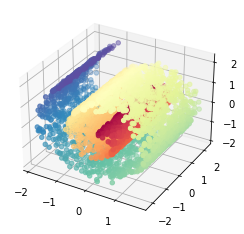

In [8]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.scatter3D(x, y, z, c=t, cmap='Spectral')

In [9]:
# import umap.umap_ as umap
import umap
import numpy as np
from sklearn.neighbors import kneighbors_graph

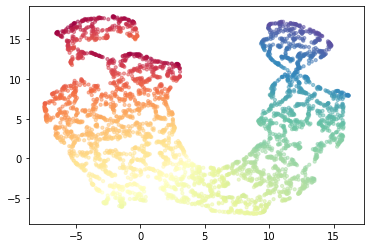

In [10]:
X = np.vstack([np.array(x),np.array(y),np.array(z)]).T
A_dist = kneighbors_graph(X, N_NEIGHBOURS, mode='distance', include_self=False)
embedding = umap.UMAP(n_components=2, n_neighbors= 10, min_dist= 0.3).fit_transform(X)
plt.scatter(*embedding.T, s=10, c=t, alpha=0.5, cmap='Spectral')

The number of neighbor regulates how much local information that you want to reflect on the embedding spcaces. The smaller the local n_neighbor, the more local your embedding is. 

## Draw reconstructed graph

<Figure size 432x288 with 0 Axes>

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_58568/367358442.py:4: DeprecationWarning: 

The scipy.sparse array containers will be used instead of matrices
in Networkx 3.0. Use `from_scipy_sparse_array` instead.
  nx.draw_networkx(nx.from_scipy_sparse_matrix(A_dist),


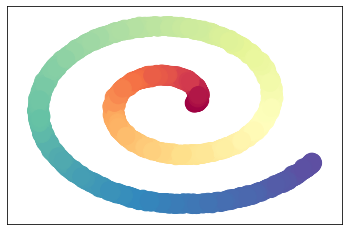

In [11]:
# A_dist = kneighbors_graph(X, 5, mode='distance', include_self=False)
### Very sensitive to wrong edges
plt.figure()
nx.draw_networkx(nx.from_scipy_sparse_matrix(A_dist),
                 pos={i:[new_data.x[i,0].numpy(),new_data.x[i,1].numpy()] for i in range(new_data.num_nodes)},
                 # to see the "roll" it should by x, y axis
                 node_color=t, cmap='Spectral', with_labels=False)
plt.show()

n_neighbors = 3 : small k puts more emphasis on the local structure

# Define GNUMAP model

In [12]:
from models.data_augmentation import *

(array([6.198e+03, 8.714e+03, 5.404e+03, 2.238e+03, 6.800e+02, 2.160e+02,
        6.200e+01, 1.200e+01, 1.200e+01, 8.000e+00]),
 array([0.        , 0.62643435, 1.2528687 , 1.87930305, 2.50573741,
        3.13217176, 3.75860611, 4.38504046, 5.01147481, 5.63790916,
        6.26434351]),
 <BarContainer object of 10 artists>)

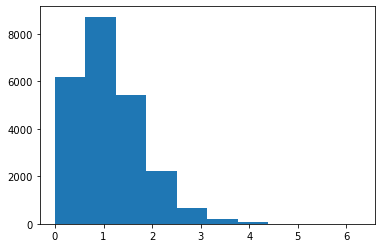

In [13]:
plt.hist(new_data.edge_weight.detach().numpy())

In [14]:
import numpy as np
from carbontracker.tracker import CarbonTracker
import cProfile
import os
import scipy
import torch
import torch.nn as nn
import torch_geometric
from torch_geometric.data import Data
from torch_geometric.utils import remove_self_loops, negative_sampling
from torch_geometric.utils import add_remaining_self_loops
from torch_geometric.utils import to_scipy_sparse_matrix, to_networkx, from_scipy_sparse_matrix
from torch_geometric.transforms import NormalizeFeatures
import time
from umap_functions import *
from graph_utils import *
from models.data_augmentation import *
import matplotlib.pyplot as plt
from models.baseline_models import *

In [15]:
def my_plot(epochs, loss):
    plt.plot(epochs, loss)
    
"""
Understanding Contrastive Representation Learning through
Alignment and Uniformity on the Hypersphere

source: https://arxiv.org/pdf/2005.10242.pdf

alignment and uniformity regularizations
"""

def uniform_loss(x, t=2):
    return torch.pdist(x,p=2).pow(2).mul(-t).exp().mean().log()
    # return torch.log(torch.mean(-t*(torch.pdist(x,p=2)**2)))
    # rewrite with torch command
def align_loss(x,y, theta = 2):
    return torch.norm(x-y, dim = 1).pow(theta).mean()


'\nUnderstanding Contrastive Representation Learning through\nAlignment and Uniformity on the Hypersphere\n\nsource: https://arxiv.org/pdf/2005.10242.pdf\n\nalignment and uniformity regularizations\n'

In [16]:
def train_gnumap(data, hid_dim, dim, n_layers=2, dropout_rate = 0.5, target=None,
                 model_type = 'GCN', must_propagate=None, norm = 'normalize',
                 patience=20, epochs=200, lr=1e-3, wd=1e-2,
                 min_dist=0.1, name_file="1", subsampling=None,
                 spread = 1.0, repulsion_strength=None,
                 device=None, verbose = False, normalized = True):


    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
   # EPS_0 = data.num_edges/ (data.num_nodes ** 2)
    _a, _b = find_ab_params(spread, min_dist) # spread , min_dist given as hyperparameter

    if torch_geometric.utils.is_undirected(data.edge_index):
        new_edge_index, new_edge_attr = data.edge_index, data.edge_weight
    else:
        new_edge_index, new_edge_attr = torch_geometric.utils.to_undirected(data.edge_index, data.edge_weight)

    
    #### Prune
    EPS = 1e-20 #math.exp(-1.0/(2*_b) * math.log(1.0/_a * (1.0/EPS_0 -1)))
    # print("Epsilon is " + str(EPS))
    print("Hyperparameters a = " + str(_a) + " and b = " + str(_b))

    if model_type == 'GNN':
        model = GNN(data.num_features, hid_dim, dim, n_layers=n_layers,
                    must_propagate=must_propagate, norm=norm)
    elif model_type == 'GCN':
        model = GCN(data.num_features, hid_dim, dim, n_layers = n_layers,dropout_rate = dropout_rate)
    elif model_type == 'MLP':
        model = MLP(data.num_features, hid_dim, dim)
    model = model.to(device)
    model.apply(init_weights)
    new_data = Data(x=data.x, edge_index=new_edge_index, # if feature drops the feature matrix should be updated
                    y=data.y, edge_weight=new_edge_attr,
                    transform = NormalizeFeatures)

    optimizer = torch.optim.SGD(model.parameters(), lr=lr, momentum = 0.9, weight_decay= wd)
    new_data = new_data.to(device)
    sparsity =  new_data.num_edges/(new_data.num_nodes**2 -new_data.num_nodes)
    
    if repulsion_strength is None:
        repulsion_strength = 1.0/sparsity
        # we have way more samples that are "not" connected(sparsity), so need to give more weight to negative sampling to get balanced results
    row_pos, col_pos =  new_data.edge_index
    index = (row_pos != col_pos)
        # to exclude self-connectivity
    edge_weights_pos = new_data.edge_weight#[index]

    if target is not None:
        edge_weights_pos = fast_intersection(row_pos[index], col_pos[index], edge_weights_pos,
                                             target, unknown_dist=1.0, far_dist=5.0)
        # p_{ij}
    if subsampling is None:
        row_neg, col_neg = negative_sampling(new_data.edge_index, num_neg_samples = 5 * new_data.edge_index.shape[1] )
        # negative_sample_rate: int (optional, default 5), the number of negative samples to select per positive sample
        index_neg = (row_neg != col_neg)
        edge_weights_neg = EPS * torch.ones(len(row_neg))
        if target is not None:
            edge_weights_neg = fast_intersection(row_neg[index_neg], col_neg[index_neg], edge_weights_neg,
                                                 target, unknown_dist=1.0, far_dist=5.0)
    best_t=0
    cnt_wait = 0
    best=1e9
    log_sigmoid = torch.nn.LogSigmoid()
    edges = [(e[0],e[1]) for _, e in enumerate(data.edge_index.numpy().T)]
    loss_vals = []
    CE = nn.BCELoss()
    for epoch in range(epochs):
        tic_epoch = time.time()
        model.train()
        optimizer.zero_grad()
        tic = time.time()
        out = model(new_data.x.float(), new_data.edge_index) # data.edge_index?
        if normalized is True:
            out = F.normalize(out) # add normalization**
        diff_norm = torch.sum(torch.square(out[row_pos[index]] - out[col_pos[index]]), 1)
        diff_norm = torch.clip(diff_norm, min=1e-3)
        log_q = - torch.log1p(_a *  diff_norm ** _b) # 1/(1+a*d^2b)
        loss_pos = -torch.mean(
             edge_weights_pos[index]*log_sigmoid(log_q)
             + (1- edge_weights_pos[index])*(log_sigmoid(log_q)-log_q)*repulsion_strength
         )  

        if subsampling is None:
            diff_norm_neg = torch.sum(torch.square(out[row_neg[index_neg]] - out[col_neg[index_neg]]), 1) #+ 1e-3
            diff_norm_neg = torch.clip(diff_norm_neg, min=1e-3)
            log_q_neg = - torch.log1p(_a *  diff_norm_neg ** _b)
        else:
            row_neg, col_neg = negative_sampling(new_data.edge_index,
                                                 num_neg_samples=subsampling, force_undirected = True)
            index_neg = (row_neg != col_neg)
            edge_weights_neg = EPS * torch.ones(len(row_neg))
            if target is not None:
                edge_weights_neg = fast_intersection(row_neg[index_neg],
                                                     col_neg[index_neg], edge_weights_neg,
                                                     target, unknown_dist=1.0, far_dist=5.0)
            diff_norm_neg = torch.sum(torch.square(out[row_neg[index_neg]] - out[col_neg[index_neg]]), 1) #+ 1e-3
            diff_norm_neg = torch.clip(diff_norm_neg, min=1e-3)
            log_q_neg = - torch.log1p(_a *  diff_norm_neg ** _b)
        print("loss before neg", loss_pos)
        loss_neg = - torch.mean((log_sigmoid(log_q_neg) - log_q_neg ) * repulsion_strength)
        ### Add a term to make sure that the features are learned independently
        loss = loss_pos + loss_neg
        print("loss final", loss)
        tic =  time.time()
        loss.backward()
        optimizer.step()
        loss_vals.append(loss.detach().numpy())
        #torch.nn.utils.clip_grad_value_(model.parameters(), clip_value=4)



        if verbose is True:
            if epoch%10== 0:
                u = out.detach().numpy()
                plt.figure()
                plt.scatter(u[:,0], u[:,1], c = t,
                            cmap="Spectral")
                plt.show()
                print(torch.mm(out.T, out)/ new_data.num_nodes)

        for g in optimizer.param_groups:
            g['lr'] = lr * (1.0 - (float(epoch) / float(epochs)))

        print('Epoch={:03d}, loss={:.4f}, time={:.4f}'.format(epoch, loss.item(),time.time()-tic_epoch))
        if loss < best:
            best = loss
            best_t = epoch
            cnt_wait = 0
            torch.save(model.state_dict(), os.getcwd()  + '/results/best_gnumap_'
                                          + '_dim' + str(dim) + '_' + name_file +  '.pkl')
        else:
            cnt_wait += 1
        if cnt_wait == patience and epoch>50:
            print('Early stopping at epoch {}!'.format(epoch))
            break
        #print("Time epoch after saving", time.time()-tic_epoch)
    #tracker.stop()
    print('Loading {}th epoch'.format(best_t))
    model.load_state_dict(torch.load(os.getcwd()  + '/results/best_gnumap_' +
                                     '_dim' + str(dim) + '_' + name_file + '.pkl'))
    return(model,new_edge_index, loss_vals)

## Run simplest model

### GCN-layer 2

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(1.0109, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0109, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.0109, time=0.0277
loss before neg tensor(0.9972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9972, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.9972, time=0.0255
loss before neg tensor(0.9892, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9892, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.9892, time=0.0276
loss before neg tensor(0.9769, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9769, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.9769, time=0.0298
loss before neg tensor(0.9646, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9646, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=0.9646, time=0.0255
loss before neg ten

Epoch=046, loss=0.9172, time=0.0278
loss before neg tensor(0.9159, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9159, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=0.9159, time=0.0310
loss before neg tensor(0.9159, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9159, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=0.9159, time=0.0284
loss before neg tensor(0.9167, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9167, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=0.9167, time=0.0277
loss before neg tensor(0.9173, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9173, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=0.9173, time=0.0249
loss before neg tensor(0.9161, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9161, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=0.9161, time=0.0247
loss before neg tensor(0.9163, dtype=torch.float6

Epoch=091, loss=0.9159, time=0.0289
loss before neg tensor(0.9164, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9164, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=0.9164, time=0.0304
loss before neg tensor(0.9161, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9161, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=0.9161, time=0.0558
loss before neg tensor(0.9151, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9151, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=0.9151, time=0.0319
loss before neg tensor(0.9131, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9131, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=0.9131, time=0.0262
loss before neg tensor(0.9153, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9153, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=0.9153, time=0.0345
loss before neg tensor(0.9135, dtype=torch.float6

Epoch=141, loss=0.9005, time=0.0322
loss before neg tensor(0.9005, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9005, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=142, loss=0.9005, time=0.0301
loss before neg tensor(0.9004, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9004, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=143, loss=0.9004, time=0.0266
loss before neg tensor(0.9005, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9005, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=144, loss=0.9005, time=0.0272
loss before neg tensor(0.9004, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9004, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=145, loss=0.9004, time=0.0239
loss before neg tensor(0.9004, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9004, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=146, loss=0.9004, time=0.0299
loss before neg tensor(0.9004, dtype=torch.float6

Epoch=190, loss=0.9003, time=0.0292
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=191, loss=0.9003, time=0.0283
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=192, loss=0.9003, time=0.0264
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=193, loss=0.9003, time=0.0258
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=194, loss=0.9003, time=0.0268
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=195, loss=0.9003, time=0.0253
loss before neg tensor(0.9003, dtype=torch.float6

loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=242, loss=0.9003, time=0.0347
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=243, loss=0.9003, time=0.0295
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=244, loss=0.9003, time=0.0305
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=245, loss=0.9003, time=0.0293
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=246, loss=0.9003, time=0.0300
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=286, loss=0.9003, time=0.0294
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=287, loss=0.9003, time=0.0279
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=288, loss=0.9003, time=0.0269
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=289, loss=0.9003, time=0.0273
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=290, loss=0.9003, time=0.0297
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=291, loss=0.9003, time=0.0267
loss before neg tensor(0.9003, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.9009, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2246, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.2246, time=0.0258
loss before neg tensor(0.9124, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2344, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.2344, time=0.0235
loss before neg tensor(0.8623, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1799, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.1799, time=0.0273
loss before neg tensor(0.8147, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1302, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.1302, time=0.0249
loss before neg tensor(0.7828, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0925, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.0925, time=0.0269
loss before neg ten

loss before neg tensor(0.7144, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0151, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.0151, time=0.0337
loss before neg tensor(0.7142, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0152, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=1.0152, time=0.0248
loss before neg tensor(0.7133, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0143, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=1.0143, time=0.0266
loss before neg tensor(0.7141, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0147, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=053, loss=1.0147, time=0.0257
loss before neg tensor(0.7139, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0147, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=054, loss=1.0147, time=0.0240
loss before neg tensor(0.7132, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.7111, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0117, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=098, loss=1.0117, time=0.0295
loss before neg tensor(0.7108, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0115, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=099, loss=1.0115, time=0.0308
loss before neg tensor(0.7113, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0119, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=100, loss=1.0119, time=0.0267
loss before neg tensor(0.7109, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0116, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=101, loss=1.0116, time=0.0256
loss before neg tensor(0.7105, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0112, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=102, loss=1.0112, time=0.0251
loss before neg tensor(0.7104, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6675, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5569, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.5569, time=0.0286
loss before neg tensor(0.7267, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4497, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.4497, time=0.0288
loss before neg tensor(0.7125, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3314, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.3314, time=0.0288
loss before neg tensor(0.6442, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3045, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.3045, time=0.0300
loss before neg tensor(0.5895, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2796, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.2796, time=0.0292
loss before neg ten

Epoch=046, loss=1.1191, time=0.0269
loss before neg tensor(0.5183, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1206, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.1206, time=0.0305
loss before neg tensor(0.5184, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1204, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.1204, time=0.0274
loss before neg tensor(0.5188, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1208, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.1208, time=0.0261
loss before neg tensor(0.5178, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1198, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.1198, time=0.0270
loss before neg tensor(0.5164, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1188, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=1.1188, time=0.0285
loss before neg tensor(0.5170, dtype=torch.float6

Epoch=091, loss=1.1157, time=0.0276
loss before neg tensor(0.5135, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1156, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=1.1156, time=0.0290
loss before neg tensor(0.5140, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1160, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=1.1160, time=0.0244
loss before neg tensor(0.5130, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1149, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=1.1149, time=0.0251
loss before neg tensor(0.5132, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1150, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=1.1150, time=0.0269
loss before neg tensor(0.5126, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1143, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=1.1143, time=0.0262
loss before neg tensor(0.5127, dtype=torch.float6

loss before neg tensor(0.5108, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1127, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=137, loss=1.1127, time=0.0325
loss before neg tensor(0.5108, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1126, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=138, loss=1.1126, time=0.0262
loss before neg tensor(0.5104, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1121, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=139, loss=1.1121, time=0.0251
loss before neg tensor(0.5115, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1132, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=140, loss=1.1132, time=0.0293
loss before neg tensor(0.5103, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1119, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=141, loss=1.1119, time=0.0264
loss before neg tensor(0.5114, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=181, loss=1.1170, time=0.0286
loss before neg tensor(0.5122, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1150, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=182, loss=1.1150, time=0.0266
loss before neg tensor(0.5110, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1153, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=183, loss=1.1153, time=0.0269
loss before neg tensor(0.5127, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1157, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=184, loss=1.1157, time=0.0251
loss before neg tensor(0.5120, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1142, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=185, loss=1.1142, time=0.0269
loss before neg tensor(0.5110, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1139, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=186, loss=1.1139, time=0.0284
loss before neg tensor(0.5128, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.4569, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.8189, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.8189, time=0.0321
loss before neg tensor(0.4985, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5166, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.5166, time=0.0272
loss before neg tensor(0.4670, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3893, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.3893, time=0.0307
loss before neg tensor(0.4099, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3815, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.3815, time=0.0263
loss before neg tensor(0.3833, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3557, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.3557, time=0.0266
loss before neg ten

Epoch=044, loss=1.2213, time=0.0318
loss before neg tensor(0.3151, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2200, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=1.2200, time=0.0286
loss before neg tensor(0.3163, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2219, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=1.2219, time=0.0315
loss before neg tensor(0.3139, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2187, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.2187, time=0.0263
loss before neg tensor(0.3141, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2189, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.2189, time=0.0238
loss before neg tensor(0.3137, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2189, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.2189, time=0.0252
loss before neg tensor(0.3132, dtype=torch.float6

Epoch=090, loss=1.2149, time=0.0276
loss before neg tensor(0.3104, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2149, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=091, loss=1.2149, time=0.0260
loss before neg tensor(0.3100, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2147, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=1.2147, time=0.0261
loss before neg tensor(0.3101, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2148, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=1.2148, time=0.0254
loss before neg tensor(0.3103, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2149, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=1.2149, time=0.0269
loss before neg tensor(0.3107, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2155, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=1.2155, time=0.0268
loss before neg tensor(0.3095, dtype=torch.float6

loss before neg tensor(0.3069, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2113, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=140, loss=1.2113, time=0.0300
loss before neg tensor(0.3077, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2120, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=141, loss=1.2120, time=0.0300
loss before neg tensor(0.3074, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2115, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=142, loss=1.2115, time=0.0266
loss before neg tensor(0.3077, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2118, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=143, loss=1.2118, time=0.0319
loss before neg tensor(0.3070, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2112, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=144, loss=1.2112, time=0.0295
loss before neg tensor(0.3083, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.3559, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0234, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.0234, time=0.0289
loss before neg tensor(0.3117, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.6514, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.6514, time=0.0256
loss before neg tensor(0.2444, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.6962, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.6962, time=0.0255
loss before neg tensor(0.1968, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5518, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.5518, time=0.0282
loss before neg tensor(0.1737, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4483, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.4483, time=0.0257
loss before neg ten

loss before neg tensor(0.1173, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3217, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=1.3217, time=0.0282
loss before neg tensor(0.1150, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3201, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=1.3201, time=0.0242
loss before neg tensor(0.1167, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3214, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.3214, time=0.0241
loss before neg tensor(0.1148, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3192, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.3192, time=0.0251
loss before neg tensor(0.1160, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3204, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.3204, time=0.0281
loss before neg tensor(0.1169, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=089, loss=1.3128, time=0.0301
loss before neg tensor(0.1111, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3149, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=090, loss=1.3149, time=0.0313
loss before neg tensor(0.1100, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3142, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=091, loss=1.3142, time=0.0259
loss before neg tensor(0.1091, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3126, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=1.3126, time=0.0270
loss before neg tensor(0.1086, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3125, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=1.3125, time=0.0250
loss before neg tensor(0.1113, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3154, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=1.3154, time=0.0287
loss before neg tensor(0.1107, dtype=torch.float6

Epoch=134, loss=1.3096, time=0.0273
loss before neg tensor(0.1062, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3090, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=135, loss=1.3090, time=0.0281
loss before neg tensor(0.1062, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3082, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=136, loss=1.3082, time=0.0265
loss before neg tensor(0.1064, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3088, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=137, loss=1.3088, time=0.0289
loss before neg tensor(0.1071, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3096, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=138, loss=1.3096, time=0.0294
loss before neg tensor(0.1066, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3094, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=139, loss=1.3094, time=0.0258
loss before neg tensor(0.1077, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.1153, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2841, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.2841, time=0.0326
loss before neg tensor(0.1268, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.7445, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.7445, time=0.0266
loss before neg tensor(0.0778, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9651, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.9651, time=0.0256
loss before neg tensor(0.0499, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9064, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.9064, time=0.0343
loss before neg tensor(0.0132, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.7073, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.7073, time=0.0264
loss before neg ten

Epoch=044, loss=1.4304, time=0.0277
loss before neg tensor(-0.0765, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4318, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=1.4318, time=0.0266
loss before neg tensor(-0.0756, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4328, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=1.4328, time=0.0260
loss before neg tensor(-0.0758, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4317, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.4317, time=0.0258
loss before neg tensor(-0.0754, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4317, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.4317, time=0.0288
loss before neg tensor(-0.0762, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4311, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.4311, time=0.0267
loss before neg tensor(-0.0759, dtype=torch.

loss before neg tensor(-0.0820, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4259, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=090, loss=1.4259, time=0.0280
loss before neg tensor(-0.0811, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4276, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=091, loss=1.4276, time=0.0279
loss before neg tensor(-0.0814, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4269, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=1.4269, time=0.0244
loss before neg tensor(-0.0816, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4275, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=1.4275, time=0.0296
loss before neg tensor(-0.0795, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4294, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=1.4294, time=0.0255
loss before neg tensor(-0.0807, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Epoch=134, loss=1.4209, time=0.0274
loss before neg tensor(-0.0865, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4211, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=135, loss=1.4211, time=0.0270
loss before neg tensor(-0.0880, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4197, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=136, loss=1.4197, time=0.0268
loss before neg tensor(-0.0873, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4195, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=137, loss=1.4195, time=0.0265
loss before neg tensor(-0.0874, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4196, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=138, loss=1.4196, time=0.0286
loss before neg tensor(-0.0874, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4192, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=139, loss=1.4192, time=0.0259
loss before neg tensor(-0.0856, dtype=torch.

loss before neg tensor(-0.0933, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4115, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=180, loss=1.4115, time=0.0292
loss before neg tensor(-0.0934, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4137, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=181, loss=1.4137, time=0.0252
loss before neg tensor(-0.0930, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4131, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=182, loss=1.4131, time=0.0249
loss before neg tensor(-0.0931, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4131, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=183, loss=1.4131, time=0.0249
loss before neg tensor(-0.0927, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4127, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=184, loss=1.4127, time=0.0317
loss before neg tensor(-0.0920, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Epoch=225, loss=1.4087, time=0.0270
loss before neg tensor(-0.0961, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4092, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=226, loss=1.4092, time=0.0332
loss before neg tensor(-0.0961, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4082, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=227, loss=1.4082, time=0.0273
loss before neg tensor(-0.0954, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4082, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=228, loss=1.4082, time=0.0285
loss before neg tensor(-0.0951, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4094, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=229, loss=1.4094, time=0.0297
loss before neg tensor(-0.0947, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4099, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=230, loss=1.4099, time=0.0262
loss before neg tensor(-0.0951, dtype=torch.

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-0.9242, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.3660, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=4.3660, time=0.0301
loss before neg tensor(-0.9179, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.4928, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.4928, time=0.0262
loss before neg tensor(-1.0001, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.5704, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.5704, time=0.0259
loss before neg tensor(-1.0413, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3475, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.3475, time=0.0292
loss before neg tensor(-1.0554, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1531, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=2.1531, time=0.0295
loss before ne

Epoch=044, loss=1.9326, time=0.0253
loss before neg tensor(-1.0823, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9308, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=1.9308, time=0.0295
loss before neg tensor(-1.0799, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9316, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=1.9316, time=0.0276
loss before neg tensor(-1.0854, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9263, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.9263, time=0.0269
loss before neg tensor(-1.0819, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9290, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.9290, time=0.0272
loss before neg tensor(-1.0854, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9259, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.9259, time=0.0249
loss before neg tensor(-1.0862, dtype=torch.

Epoch=089, loss=1.9175, time=0.0312
loss before neg tensor(-1.0902, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9190, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=090, loss=1.9190, time=0.0277
loss before neg tensor(-1.0923, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9181, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=091, loss=1.9181, time=0.0262
loss before neg tensor(-1.0899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9218, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=1.9218, time=0.0292
loss before neg tensor(-1.0935, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9174, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=1.9174, time=0.0263
loss before neg tensor(-1.0922, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9184, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=1.9184, time=0.0262
loss before neg tensor(-1.0930, dtype=torch.

loss before neg tensor(-1.1055, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9047, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=135, loss=1.9047, time=0.0312
loss before neg tensor(-1.0993, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9097, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=136, loss=1.9097, time=0.0290
loss before neg tensor(-1.1033, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9051, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=137, loss=1.9051, time=0.0285
loss before neg tensor(-1.0977, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9130, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=138, loss=1.9130, time=0.0271
loss before neg tensor(-1.1027, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9071, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=139, loss=1.9071, time=0.0283
loss before neg tensor(-1.1024, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-2.1005, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.4558, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=4.4558, time=0.0286
loss before neg tensor(-3.1214, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(8.8076, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=8.8076, time=0.0269
loss before neg tensor(-3.1511, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.9575, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=7.9575, time=0.0243
loss before neg tensor(-3.1441, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.9034, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=6.9034, time=0.0263
loss before neg tensor(-3.1308, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.9457, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=5.9457, time=0.0263
loss before ne

Epoch=049, loss=3.0363, time=0.0307
loss before neg tensor(-3.0482, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.0109, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=3.0109, time=0.0287
loss before neg tensor(-3.0523, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.0033, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=3.0033, time=0.0347
loss before neg tensor(-3.0531, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.0069, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=3.0069, time=0.0280
loss before neg tensor(-3.0415, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.0144, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=053, loss=3.0144, time=0.0253
loss before neg tensor(-3.0402, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.0158, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=054, loss=3.0158, time=0.0273
loss before neg tensor(-3.0545, dtype=torch.

Epoch=094, loss=2.9649, time=0.0313
loss before neg tensor(-3.0722, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9672, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=2.9672, time=0.0261
loss before neg tensor(-3.0814, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9589, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=2.9589, time=0.0292
loss before neg tensor(-3.0675, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9699, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=097, loss=2.9699, time=0.0265
loss before neg tensor(-3.0776, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9636, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=098, loss=2.9636, time=0.0252
loss before neg tensor(-3.0857, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9487, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=099, loss=2.9487, time=0.0243
loss before neg tensor(-3.0780, dtype=torch.

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-6.4639, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.1223, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=10.1223, time=0.0286
loss before neg tensor(-9.3080, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(24.5493, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=24.5493, time=0.0273
loss before neg tensor(-9.3150, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(24.1950, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=24.1950, time=0.0300
loss before neg tensor(-9.3103, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(23.4913, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=23.4913, time=0.0289
loss before neg tensor(-9.2999, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(22.5539, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=22.5539, time=0.0264
loss

Epoch=045, loss=9.9881, time=0.0291
loss before neg tensor(-8.9421, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(9.9581, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=9.9581, time=0.0277
loss before neg tensor(-8.9294, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(9.9481, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=9.9481, time=0.0329
loss before neg tensor(-8.9861, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(9.9200, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=9.9200, time=0.0293
loss before neg tensor(-8.9122, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(9.9285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=9.9285, time=0.0267
loss before neg tensor(-8.9050, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(9.9316, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=9.9316, time=0.0254
loss before neg tensor(-8.9429, dtype=torch.

loss before neg tensor(-8.7882, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.8689, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=091, loss=6.8689, time=0.0296
loss before neg tensor(-8.7676, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.7491, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=6.7491, time=0.0255
loss before neg tensor(-8.7759, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.7278, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=6.7278, time=0.0264
loss before neg tensor(-8.7627, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.6534, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=6.6534, time=0.0274
loss before neg tensor(-8.7970, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.6305, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=6.6305, time=0.0278
loss before neg tensor(-8.7690, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Epoch=135, loss=6.1632, time=0.0256
loss before neg tensor(-8.9662, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.1482, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=136, loss=6.1482, time=0.0349
loss before neg tensor(-8.9526, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.1716, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=137, loss=6.1716, time=0.0252
loss before neg tensor(-8.9534, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.1533, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=138, loss=6.1533, time=0.0255
loss before neg tensor(-8.9415, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.1476, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=139, loss=6.1476, time=0.0233
loss before neg tensor(-8.9578, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.1408, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=140, loss=6.1408, time=0.0248
loss before neg tensor(-8.9316, dtype=torch.

Epoch=180, loss=6.0659, time=0.0289
loss before neg tensor(-9.0210, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.0227, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=181, loss=6.0227, time=0.0295
loss before neg tensor(-9.0082, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.0552, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=182, loss=6.0552, time=0.0269
loss before neg tensor(-9.0363, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.0122, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=183, loss=6.0122, time=0.0268
loss before neg tensor(-9.0398, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.0028, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=184, loss=6.0028, time=0.0247
loss before neg tensor(-9.0473, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.0184, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=185, loss=6.0184, time=0.0262
loss before neg tensor(-9.0376, dtype=torch.

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-15.7865, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(19.4159, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=19.4159, time=0.0342
loss before neg tensor(-19.5347, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(46.8003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=46.8003, time=0.0293
loss before neg tensor(-19.5361, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(46.3285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=46.3285, time=0.0294
loss before neg tensor(-19.5244, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(45.1814, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=45.1814, time=0.0301
loss before neg tensor(-19.5058, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(43.7669, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=43.7669, time=0.0247

loss before neg tensor(-18.3743, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(15.1626, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=15.1626, time=0.0276
loss before neg tensor(-18.3183, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(14.8548, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=14.8548, time=0.0285
loss before neg tensor(-18.2487, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(14.7608, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=14.7608, time=0.0289
loss before neg tensor(-18.3959, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(14.2868, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=14.2868, time=0.0241
loss before neg tensor(-18.2275, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(14.2269, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=14.2269, time=0.0242
loss before neg tensor(-18.0424, dtype=torch.float64, grad_fn=<Ne

Epoch=095, loss=12.1211, time=0.0281
loss before neg tensor(-18.3839, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.9064, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=11.9064, time=0.0255
loss before neg tensor(-18.4753, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.8319, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=097, loss=11.8319, time=0.0250
loss before neg tensor(-18.5062, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.7560, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=098, loss=11.7560, time=0.0271
loss before neg tensor(-18.4770, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.8406, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=099, loss=11.8406, time=0.0334
loss before neg tensor(-18.4753, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.7883, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=100, loss=11.7883, time=0.0255
loss before neg tensor(-18.3

loss before neg tensor(-18.6193, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.5534, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=142, loss=11.5534, time=0.0284
loss before neg tensor(-18.6448, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.5140, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=143, loss=11.5140, time=0.0257
loss before neg tensor(-18.5817, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.5644, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=144, loss=11.5644, time=0.0273
loss before neg tensor(-18.6810, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.5162, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=145, loss=11.5162, time=0.0270
loss before neg tensor(-18.6657, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.4704, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=146, loss=11.4704, time=0.0260
loss before neg tensor(-18.6792, dtype=torch.float64, grad_fn=<Ne

Epoch=188, loss=11.3952, time=0.0277
loss before neg tensor(-18.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.2455, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=189, loss=11.2455, time=0.0260
loss before neg tensor(-18.7389, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.4029, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=190, loss=11.4029, time=0.0275
loss before neg tensor(-18.7755, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.3742, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=191, loss=11.3742, time=0.0271
loss before neg tensor(-18.7643, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.3837, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=192, loss=11.3837, time=0.0265
loss before neg tensor(-18.7531, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.3816, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=193, loss=11.3816, time=0.0242
loss before neg tensor(-18.8

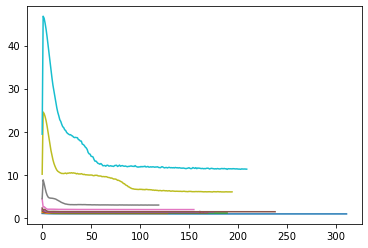

In [20]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses  =  train_gnumap(new_data, 32, 2, n_layers=2, target=None,
                                     model_type = 'GCN', patience=20, epochs=500, lr=1e-1, wd=1e-2,
                                     min_dist=0.1, name_file="1", subsampling=None,
                                     spread = 1.0, repulsion_strength=repulsion_strength[i],
                                     device=None, verbose = False, normalized = True)
    out_tmp = model(new_data.x.float(), new_data.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

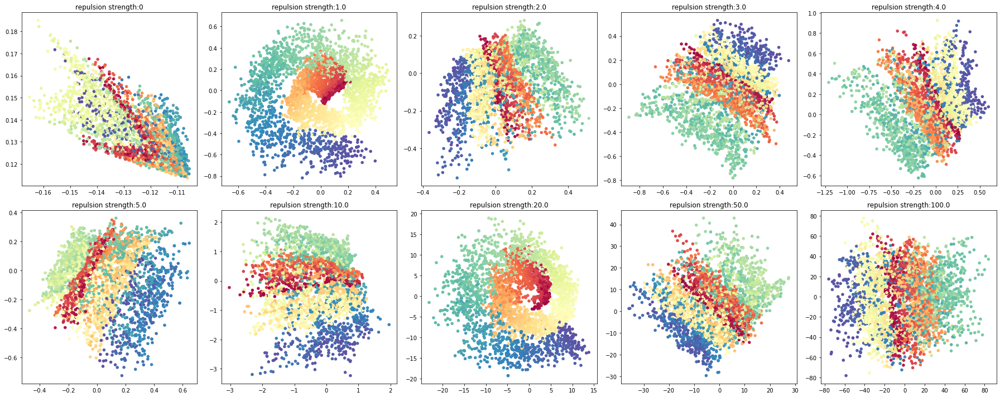

In [21]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

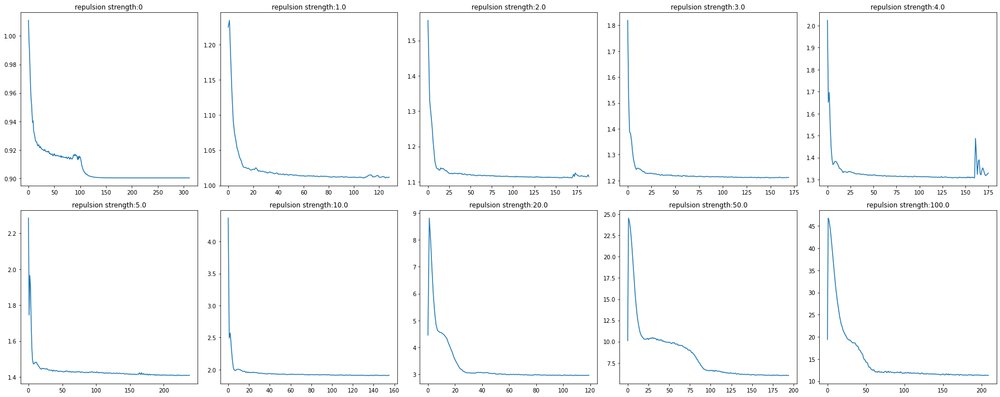

In [23]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.8393, grad_fn=<NegBackward0>)
loss final tensor(4.0815, grad_fn=<AddBackward0>)
Epoch=000, loss=4.0815, time=0.0288
loss before neg tensor(0.7332, grad_fn=<NegBackward0>)
loss final tensor(5.8063, grad_fn=<AddBackward0>)
Epoch=001, loss=5.8063, time=0.0288
loss before neg tensor(0.7288, grad_fn=<NegBackward0>)
loss final tensor(4.6818, grad_fn=<AddBackward0>)
Epoch=002, loss=4.6818, time=0.0313
loss before neg tensor(0.7258, grad_fn=<NegBackward0>)
loss final tensor(3.9273, grad_fn=<AddBackward0>)
Epoch=003, loss=3.9273, time=0.0288
loss before neg tensor(0.7225, grad_fn=<NegBackward0>)
loss final tensor(3.8229, grad_fn=<AddBackward0>)
Epoch=004, loss=3.8229, time=0.0312
loss before neg tensor(0.7198, grad_fn=<NegBackward0>)
loss final tensor(3.9225, grad_fn=<AddBackward0>)
Epoch=005, loss=3.9225, time=0.0267
loss before neg tensor(0.7179, grad_fn=<NegBackward0>)
loss final tensor(3.9657, grad_fn

Epoch=060, loss=3.7259, time=0.0294
loss before neg tensor(0.7148, grad_fn=<NegBackward0>)
loss final tensor(3.7277, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7277, time=0.0273
loss before neg tensor(0.7135, grad_fn=<NegBackward0>)
loss final tensor(3.7248, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7248, time=0.0263
loss before neg tensor(0.7137, grad_fn=<NegBackward0>)
loss final tensor(3.7269, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7269, time=0.0270
loss before neg tensor(0.7128, grad_fn=<NegBackward0>)
loss final tensor(3.7237, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7237, time=0.0280
loss before neg tensor(0.7147, grad_fn=<NegBackward0>)
loss final tensor(3.7260, grad_fn=<AddBackward0>)
Epoch=065, loss=3.7260, time=0.0296
loss before neg tensor(0.7119, grad_fn=<NegBackward0>)
loss final tensor(3.7224, grad_fn=<AddBackward0>)
Epoch=066, loss=3.7224, time=0.0262
loss before neg tensor(0.7135, grad_fn=<NegBackward0>)
loss final tensor(3.7217, grad_fn=<AddBackward0>)
Epoch=067, lo

loss before neg tensor(0.7095, grad_fn=<NegBackward0>)
loss final tensor(3.7195, grad_fn=<AddBackward0>)
Epoch=121, loss=3.7195, time=0.0274
loss before neg tensor(0.7099, grad_fn=<NegBackward0>)
loss final tensor(3.7171, grad_fn=<AddBackward0>)
Epoch=122, loss=3.7171, time=0.0242
loss before neg tensor(0.7100, grad_fn=<NegBackward0>)
loss final tensor(3.7216, grad_fn=<AddBackward0>)
Epoch=123, loss=3.7216, time=0.0231
loss before neg tensor(0.7091, grad_fn=<NegBackward0>)
loss final tensor(3.7176, grad_fn=<AddBackward0>)
Epoch=124, loss=3.7176, time=0.0245
loss before neg tensor(0.7094, grad_fn=<NegBackward0>)
loss final tensor(3.7181, grad_fn=<AddBackward0>)
Epoch=125, loss=3.7181, time=0.0255
loss before neg tensor(0.7094, grad_fn=<NegBackward0>)
loss final tensor(3.7182, grad_fn=<AddBackward0>)
Epoch=126, loss=3.7182, time=0.0254
loss before neg tensor(0.7092, grad_fn=<NegBackward0>)
loss final tensor(3.7183, grad_fn=<AddBackward0>)
Epoch=127, loss=3.7183, time=0.0238
loss before n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.8165, grad_fn=<NegBackward0>)
loss final tensor(3.8738, grad_fn=<AddBackward0>)
Epoch=000, loss=3.8738, time=0.0301
loss before neg tensor(0.8000, grad_fn=<NegBackward0>)
loss final tensor(4.0628, grad_fn=<AddBackward0>)
Epoch=001, loss=4.0628, time=0.0279
loss before neg tensor(0.7609, grad_fn=<NegBackward0>)
loss final tensor(3.7964, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7964, time=0.0278
loss before neg tensor(0.7429, grad_fn=<NegBackward0>)
loss final tensor(3.8330, grad_fn=<AddBackward0>)
Epoch=003, loss=3.8330, time=0.0332
loss before neg tensor(0.7330, grad_fn=<NegBackward0>)
loss final tensor(3.7855, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7855, time=0.0321
loss before neg tensor(0.7271, grad_fn=<NegBackward0>)
loss final tensor(3.7480, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7480, time=0.0257
loss before neg tensor(0.7236, grad_fn=<NegBackward0>)
loss final tensor(3.7478, grad_fn

Epoch=059, loss=3.7209, time=0.0268
loss before neg tensor(0.7079, grad_fn=<NegBackward0>)
loss final tensor(3.7190, grad_fn=<AddBackward0>)
Epoch=060, loss=3.7190, time=0.0271
loss before neg tensor(0.7083, grad_fn=<NegBackward0>)
loss final tensor(3.7196, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7196, time=0.0270
loss before neg tensor(0.7083, grad_fn=<NegBackward0>)
loss final tensor(3.7204, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7204, time=0.0275
loss before neg tensor(0.7084, grad_fn=<NegBackward0>)
loss final tensor(3.7207, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7207, time=0.0282
loss before neg tensor(0.7083, grad_fn=<NegBackward0>)
loss final tensor(3.7215, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7215, time=0.0276
loss before neg tensor(0.7077, grad_fn=<NegBackward0>)
loss final tensor(3.7185, grad_fn=<AddBackward0>)
Epoch=065, loss=3.7185, time=0.0349
loss before neg tensor(0.7077, grad_fn=<NegBackward0>)
loss final tensor(3.7196, grad_fn=<AddBackward0>)
Epoch=066, lo

loss before neg tensor(0.7067, grad_fn=<NegBackward0>)
loss final tensor(3.7143, grad_fn=<AddBackward0>)
Epoch=120, loss=3.7143, time=0.0353
loss before neg tensor(0.7060, grad_fn=<NegBackward0>)
loss final tensor(3.7132, grad_fn=<AddBackward0>)
Epoch=121, loss=3.7132, time=0.0270
loss before neg tensor(0.7065, grad_fn=<NegBackward0>)
loss final tensor(3.7131, grad_fn=<AddBackward0>)
Epoch=122, loss=3.7131, time=0.0267
loss before neg tensor(0.7065, grad_fn=<NegBackward0>)
loss final tensor(3.7155, grad_fn=<AddBackward0>)
Epoch=123, loss=3.7155, time=0.0274
loss before neg tensor(0.7059, grad_fn=<NegBackward0>)
loss final tensor(3.7131, grad_fn=<AddBackward0>)
Epoch=124, loss=3.7131, time=0.0282
loss before neg tensor(0.7061, grad_fn=<NegBackward0>)
loss final tensor(3.7127, grad_fn=<AddBackward0>)
Epoch=125, loss=3.7127, time=0.0320
loss before neg tensor(0.7069, grad_fn=<NegBackward0>)
loss final tensor(3.7123, grad_fn=<AddBackward0>)
Epoch=126, loss=3.7123, time=0.0263
loss before n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7847, grad_fn=<NegBackward0>)
loss final tensor(4.1271, grad_fn=<AddBackward0>)
Epoch=000, loss=4.1271, time=0.0339
loss before neg tensor(0.7691, grad_fn=<NegBackward0>)
loss final tensor(4.2203, grad_fn=<AddBackward0>)
Epoch=001, loss=4.2203, time=0.0274
loss before neg tensor(0.7417, grad_fn=<NegBackward0>)
loss final tensor(3.9955, grad_fn=<AddBackward0>)
Epoch=002, loss=3.9955, time=0.0296
loss before neg tensor(0.7277, grad_fn=<NegBackward0>)
loss final tensor(3.7649, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7649, time=0.0281
loss before neg tensor(0.7208, grad_fn=<NegBackward0>)
loss final tensor(3.7711, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7711, time=0.0306
loss before neg tensor(0.7168, grad_fn=<NegBackward0>)
loss final tensor(3.8213, grad_fn=<AddBackward0>)
Epoch=005, loss=3.8213, time=0.0299
loss before neg tensor(0.7153, grad_fn=<NegBackward0>)
loss final tensor(3.8301, grad_fn

Epoch=057, loss=3.7192, time=0.0279
loss before neg tensor(0.7071, grad_fn=<NegBackward0>)
loss final tensor(3.7188, grad_fn=<AddBackward0>)
Epoch=058, loss=3.7188, time=0.0298
loss before neg tensor(0.7075, grad_fn=<NegBackward0>)
loss final tensor(3.7176, grad_fn=<AddBackward0>)
Epoch=059, loss=3.7176, time=0.0279
loss before neg tensor(0.7073, grad_fn=<NegBackward0>)
loss final tensor(3.7191, grad_fn=<AddBackward0>)
Epoch=060, loss=3.7191, time=0.0273
loss before neg tensor(0.7076, grad_fn=<NegBackward0>)
loss final tensor(3.7208, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7208, time=0.0265
loss before neg tensor(0.7073, grad_fn=<NegBackward0>)
loss final tensor(3.7174, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7174, time=0.0278
loss before neg tensor(0.7068, grad_fn=<NegBackward0>)
loss final tensor(3.7192, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7192, time=0.0303
loss before neg tensor(0.7075, grad_fn=<NegBackward0>)
loss final tensor(3.7170, grad_fn=<AddBackward0>)
Epoch=064, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.8418, grad_fn=<NegBackward0>)
loss final tensor(4.1394, grad_fn=<AddBackward0>)
Epoch=000, loss=4.1394, time=0.0266
loss before neg tensor(0.7903, grad_fn=<NegBackward0>)
loss final tensor(4.8433, grad_fn=<AddBackward0>)
Epoch=001, loss=4.8433, time=0.0274
loss before neg tensor(0.7481, grad_fn=<NegBackward0>)
loss final tensor(3.9062, grad_fn=<AddBackward0>)
Epoch=002, loss=3.9062, time=0.0243
loss before neg tensor(0.7381, grad_fn=<NegBackward0>)
loss final tensor(4.0436, grad_fn=<AddBackward0>)
Epoch=003, loss=4.0436, time=0.0305
loss before neg tensor(0.7238, grad_fn=<NegBackward0>)
loss final tensor(3.8857, grad_fn=<AddBackward0>)
Epoch=004, loss=3.8857, time=0.0261
loss before neg tensor(0.7188, grad_fn=<NegBackward0>)
loss final tensor(3.7948, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7948, time=0.0265
loss before neg tensor(0.7197, grad_fn=<NegBackward0>)
loss final tensor(3.7544, grad_fn

Epoch=060, loss=3.7245, time=0.0290
loss before neg tensor(0.7101, grad_fn=<NegBackward0>)
loss final tensor(3.7254, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7254, time=0.0334
loss before neg tensor(0.7100, grad_fn=<NegBackward0>)
loss final tensor(3.7234, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7234, time=0.0286
loss before neg tensor(0.7102, grad_fn=<NegBackward0>)
loss final tensor(3.7280, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7280, time=0.0321
loss before neg tensor(0.7093, grad_fn=<NegBackward0>)
loss final tensor(3.7215, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7215, time=0.0282
loss before neg tensor(0.7093, grad_fn=<NegBackward0>)
loss final tensor(3.7246, grad_fn=<AddBackward0>)
Epoch=065, loss=3.7246, time=0.0280
loss before neg tensor(0.7107, grad_fn=<NegBackward0>)
loss final tensor(3.7252, grad_fn=<AddBackward0>)
Epoch=066, loss=3.7252, time=0.0297
loss before neg tensor(0.7102, grad_fn=<NegBackward0>)
loss final tensor(3.7264, grad_fn=<AddBackward0>)
Epoch=067, lo

Epoch=123, loss=3.7160, time=0.0275
loss before neg tensor(0.7064, grad_fn=<NegBackward0>)
loss final tensor(3.7141, grad_fn=<AddBackward0>)
Epoch=124, loss=3.7141, time=0.0262
loss before neg tensor(0.7054, grad_fn=<NegBackward0>)
loss final tensor(3.7137, grad_fn=<AddBackward0>)
Epoch=125, loss=3.7137, time=0.0275
loss before neg tensor(0.7057, grad_fn=<NegBackward0>)
loss final tensor(3.7143, grad_fn=<AddBackward0>)
Epoch=126, loss=3.7143, time=0.0315
loss before neg tensor(0.7061, grad_fn=<NegBackward0>)
loss final tensor(3.7159, grad_fn=<AddBackward0>)
Epoch=127, loss=3.7159, time=0.0260
loss before neg tensor(0.7055, grad_fn=<NegBackward0>)
loss final tensor(3.7134, grad_fn=<AddBackward0>)
Epoch=128, loss=3.7134, time=0.0260
loss before neg tensor(0.7057, grad_fn=<NegBackward0>)
loss final tensor(3.7129, grad_fn=<AddBackward0>)
Epoch=129, loss=3.7129, time=0.0272
loss before neg tensor(0.7057, grad_fn=<NegBackward0>)
loss final tensor(3.7133, grad_fn=<AddBackward0>)
Epoch=130, lo

Epoch=182, loss=3.7082, time=0.0310
loss before neg tensor(0.7047, grad_fn=<NegBackward0>)
loss final tensor(3.7067, grad_fn=<AddBackward0>)
Epoch=183, loss=3.7067, time=0.0268
loss before neg tensor(0.7041, grad_fn=<NegBackward0>)
loss final tensor(3.7068, grad_fn=<AddBackward0>)
Epoch=184, loss=3.7068, time=0.0273
loss before neg tensor(0.7044, grad_fn=<NegBackward0>)
loss final tensor(3.7049, grad_fn=<AddBackward0>)
Epoch=185, loss=3.7049, time=0.0266
loss before neg tensor(0.7045, grad_fn=<NegBackward0>)
loss final tensor(3.7058, grad_fn=<AddBackward0>)
Epoch=186, loss=3.7058, time=0.0267
loss before neg tensor(0.7039, grad_fn=<NegBackward0>)
loss final tensor(3.7053, grad_fn=<AddBackward0>)
Epoch=187, loss=3.7053, time=0.0272
loss before neg tensor(0.7043, grad_fn=<NegBackward0>)
loss final tensor(3.7064, grad_fn=<AddBackward0>)
Epoch=188, loss=3.7064, time=0.0273
loss before neg tensor(0.7042, grad_fn=<NegBackward0>)
loss final tensor(3.7067, grad_fn=<AddBackward0>)
Epoch=189, lo

Epoch=242, loss=3.7050, time=0.0253
loss before neg tensor(0.7038, grad_fn=<NegBackward0>)
loss final tensor(3.7022, grad_fn=<AddBackward0>)
Epoch=243, loss=3.7022, time=0.0281
loss before neg tensor(0.7034, grad_fn=<NegBackward0>)
loss final tensor(3.7039, grad_fn=<AddBackward0>)
Epoch=244, loss=3.7039, time=0.0269
loss before neg tensor(0.7039, grad_fn=<NegBackward0>)
loss final tensor(3.7063, grad_fn=<AddBackward0>)
Epoch=245, loss=3.7063, time=0.0255
loss before neg tensor(0.7043, grad_fn=<NegBackward0>)
loss final tensor(3.7054, grad_fn=<AddBackward0>)
Epoch=246, loss=3.7054, time=0.0240
loss before neg tensor(0.7037, grad_fn=<NegBackward0>)
loss final tensor(3.7033, grad_fn=<AddBackward0>)
Epoch=247, loss=3.7033, time=0.0303
loss before neg tensor(0.7036, grad_fn=<NegBackward0>)
loss final tensor(3.7065, grad_fn=<AddBackward0>)
Epoch=248, loss=3.7065, time=0.0244
loss before neg tensor(0.7038, grad_fn=<NegBackward0>)
loss final tensor(3.7068, grad_fn=<AddBackward0>)
Epoch=249, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.8077, grad_fn=<NegBackward0>)
loss final tensor(4.4054, grad_fn=<AddBackward0>)
Epoch=000, loss=4.4054, time=0.0297
loss before neg tensor(0.7525, grad_fn=<NegBackward0>)
loss final tensor(5.0825, grad_fn=<AddBackward0>)
Epoch=001, loss=5.0825, time=0.0277
loss before neg tensor(0.7345, grad_fn=<NegBackward0>)
loss final tensor(4.3375, grad_fn=<AddBackward0>)
Epoch=002, loss=4.3375, time=0.0279
loss before neg tensor(0.7205, grad_fn=<NegBackward0>)
loss final tensor(3.8075, grad_fn=<AddBackward0>)
Epoch=003, loss=3.8075, time=0.0275
loss before neg tensor(0.7151, grad_fn=<NegBackward0>)
loss final tensor(3.7626, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7626, time=0.0268
loss before neg tensor(0.7109, grad_fn=<NegBackward0>)
loss final tensor(3.8073, grad_fn=<AddBackward0>)
Epoch=005, loss=3.8073, time=0.0253
loss before neg tensor(0.7103, grad_fn=<NegBackward0>)
loss final tensor(3.8624, grad_fn

Epoch=061, loss=3.7220, time=0.0252
loss before neg tensor(0.7087, grad_fn=<NegBackward0>)
loss final tensor(3.7232, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7232, time=0.0302
loss before neg tensor(0.7095, grad_fn=<NegBackward0>)
loss final tensor(3.7248, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7248, time=0.0288
loss before neg tensor(0.7105, grad_fn=<NegBackward0>)
loss final tensor(3.7257, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7257, time=0.0240
loss before neg tensor(0.7093, grad_fn=<NegBackward0>)
loss final tensor(3.7237, grad_fn=<AddBackward0>)
Epoch=065, loss=3.7237, time=0.0259
loss before neg tensor(0.7100, grad_fn=<NegBackward0>)
loss final tensor(3.7255, grad_fn=<AddBackward0>)
Epoch=066, loss=3.7255, time=0.0234
loss before neg tensor(0.7095, grad_fn=<NegBackward0>)
loss final tensor(3.7251, grad_fn=<AddBackward0>)
Epoch=067, loss=3.7251, time=0.0283
loss before neg tensor(0.7088, grad_fn=<NegBackward0>)
loss final tensor(3.7237, grad_fn=<AddBackward0>)
Epoch=068, lo

Epoch=120, loss=3.7187, time=0.0260
loss before neg tensor(0.7068, grad_fn=<NegBackward0>)
loss final tensor(3.7204, grad_fn=<AddBackward0>)
Epoch=121, loss=3.7204, time=0.0281
loss before neg tensor(0.7067, grad_fn=<NegBackward0>)
loss final tensor(3.7199, grad_fn=<AddBackward0>)
Epoch=122, loss=3.7199, time=0.0259
loss before neg tensor(0.7065, grad_fn=<NegBackward0>)
loss final tensor(3.7188, grad_fn=<AddBackward0>)
Epoch=123, loss=3.7188, time=0.0264
loss before neg tensor(0.7071, grad_fn=<NegBackward0>)
loss final tensor(3.7212, grad_fn=<AddBackward0>)
Epoch=124, loss=3.7212, time=0.0240
loss before neg tensor(0.7065, grad_fn=<NegBackward0>)
loss final tensor(3.7196, grad_fn=<AddBackward0>)
Epoch=125, loss=3.7196, time=0.0269
loss before neg tensor(0.7065, grad_fn=<NegBackward0>)
loss final tensor(3.7190, grad_fn=<AddBackward0>)
Epoch=126, loss=3.7190, time=0.0252
loss before neg tensor(0.7064, grad_fn=<NegBackward0>)
loss final tensor(3.7181, grad_fn=<AddBackward0>)
Epoch=127, lo

loss before neg tensor(0.7053, grad_fn=<NegBackward0>)
loss final tensor(3.7175, grad_fn=<AddBackward0>)
Epoch=184, loss=3.7175, time=0.0264
loss before neg tensor(0.7058, grad_fn=<NegBackward0>)
loss final tensor(3.7176, grad_fn=<AddBackward0>)
Epoch=185, loss=3.7176, time=0.0286
loss before neg tensor(0.7060, grad_fn=<NegBackward0>)
loss final tensor(3.7187, grad_fn=<AddBackward0>)
Epoch=186, loss=3.7187, time=0.0259
loss before neg tensor(0.7058, grad_fn=<NegBackward0>)
loss final tensor(3.7173, grad_fn=<AddBackward0>)
Epoch=187, loss=3.7173, time=0.0233
loss before neg tensor(0.7058, grad_fn=<NegBackward0>)
loss final tensor(3.7170, grad_fn=<AddBackward0>)
Epoch=188, loss=3.7170, time=0.0254
loss before neg tensor(0.7055, grad_fn=<NegBackward0>)
loss final tensor(3.7187, grad_fn=<AddBackward0>)
Epoch=189, loss=3.7187, time=0.0257
loss before neg tensor(0.7059, grad_fn=<NegBackward0>)
loss final tensor(3.7162, grad_fn=<AddBackward0>)
Epoch=190, loss=3.7162, time=0.0237
loss before n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.8240, grad_fn=<NegBackward0>)
loss final tensor(5.5371, grad_fn=<AddBackward0>)
Epoch=000, loss=5.5371, time=0.0306
loss before neg tensor(0.7604, grad_fn=<NegBackward0>)
loss final tensor(5.5586, grad_fn=<AddBackward0>)
Epoch=001, loss=5.5586, time=0.0255
loss before neg tensor(0.7329, grad_fn=<NegBackward0>)
loss final tensor(5.5254, grad_fn=<AddBackward0>)
Epoch=002, loss=5.5254, time=0.0246
loss before neg tensor(0.7267, grad_fn=<NegBackward0>)
loss final tensor(4.7928, grad_fn=<AddBackward0>)
Epoch=003, loss=4.7928, time=0.0264
loss before neg tensor(0.7213, grad_fn=<NegBackward0>)
loss final tensor(4.3114, grad_fn=<AddBackward0>)
Epoch=004, loss=4.3114, time=0.0250
loss before neg tensor(0.7198, grad_fn=<NegBackward0>)
loss final tensor(4.0641, grad_fn=<AddBackward0>)
Epoch=005, loss=4.0641, time=0.0243
loss before neg tensor(0.7169, grad_fn=<NegBackward0>)
loss final tensor(3.9321, grad_fn

Epoch=058, loss=3.7382, time=0.0246
loss before neg tensor(0.7166, grad_fn=<NegBackward0>)
loss final tensor(3.7404, grad_fn=<AddBackward0>)
Epoch=059, loss=3.7404, time=0.0251
loss before neg tensor(0.7178, grad_fn=<NegBackward0>)
loss final tensor(3.7416, grad_fn=<AddBackward0>)
Epoch=060, loss=3.7416, time=0.0238
loss before neg tensor(0.7174, grad_fn=<NegBackward0>)
loss final tensor(3.7388, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7388, time=0.0228
loss before neg tensor(0.7166, grad_fn=<NegBackward0>)
loss final tensor(3.7391, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7391, time=0.0236
loss before neg tensor(0.7180, grad_fn=<NegBackward0>)
loss final tensor(3.7392, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7392, time=0.0228
loss before neg tensor(0.7184, grad_fn=<NegBackward0>)
loss final tensor(3.7391, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7391, time=0.0241
loss before neg tensor(0.7172, grad_fn=<NegBackward0>)
loss final tensor(3.7400, grad_fn=<AddBackward0>)
Epoch=065, lo

loss before neg tensor(0.7128, grad_fn=<NegBackward0>)
loss final tensor(3.7336, grad_fn=<AddBackward0>)
Epoch=118, loss=3.7336, time=0.0286
loss before neg tensor(0.7135, grad_fn=<NegBackward0>)
loss final tensor(3.7345, grad_fn=<AddBackward0>)
Epoch=119, loss=3.7345, time=0.0237
loss before neg tensor(0.7133, grad_fn=<NegBackward0>)
loss final tensor(3.7323, grad_fn=<AddBackward0>)
Epoch=120, loss=3.7323, time=0.0233
loss before neg tensor(0.7135, grad_fn=<NegBackward0>)
loss final tensor(3.7329, grad_fn=<AddBackward0>)
Epoch=121, loss=3.7329, time=0.0230
loss before neg tensor(0.7132, grad_fn=<NegBackward0>)
loss final tensor(3.7319, grad_fn=<AddBackward0>)
Epoch=122, loss=3.7319, time=0.0272
loss before neg tensor(0.7135, grad_fn=<NegBackward0>)
loss final tensor(3.7336, grad_fn=<AddBackward0>)
Epoch=123, loss=3.7336, time=0.0310
Early stopping at epoch 123!
Loading 103th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7902, grad_fn=<NegBackward0>)
loss final tensor(4.7320, grad_fn=<AddBackward0>)
Epoch=000, loss=4.7320, time=0.0272
loss before neg tensor(0.7236, grad_fn=<NegBackward0>)
loss final tensor(5.3314, grad_fn=<AddBackward0>)
Epoch=001, loss=5.3314, time=0.0238
loss before neg tensor(0.7113, grad_fn=<NegBackward0>)
loss final tensor(5.2334, grad_fn=<AddBackward0>)
Epoch=002, loss=5.2334, time=0.0273
loss before neg tensor(0.7239, grad_fn=<NegBackward0>)
loss final tensor(4.7042, grad_fn=<AddBackward0>)
Epoch=003, loss=4.7042, time=0.0268
loss before neg tensor(0.7242, grad_fn=<NegBackward0>)
loss final tensor(4.1066, grad_fn=<AddBackward0>)
Epoch=004, loss=4.1066, time=0.0240
loss before neg tensor(0.7208, grad_fn=<NegBackward0>)
loss final tensor(3.8851, grad_fn=<AddBackward0>)
Epoch=005, loss=3.8851, time=0.0229
loss before neg tensor(0.7160, grad_fn=<NegBackward0>)
loss final tensor(3.8368, grad_fn

loss before neg tensor(0.7142, grad_fn=<NegBackward0>)
loss final tensor(3.7364, grad_fn=<AddBackward0>)
Epoch=058, loss=3.7364, time=0.0277
loss before neg tensor(0.7144, grad_fn=<NegBackward0>)
loss final tensor(3.7338, grad_fn=<AddBackward0>)
Epoch=059, loss=3.7338, time=0.0263
loss before neg tensor(0.7142, grad_fn=<NegBackward0>)
loss final tensor(3.7339, grad_fn=<AddBackward0>)
Epoch=060, loss=3.7339, time=0.0255
loss before neg tensor(0.7145, grad_fn=<NegBackward0>)
loss final tensor(3.7360, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7360, time=0.0233
loss before neg tensor(0.7136, grad_fn=<NegBackward0>)
loss final tensor(3.7331, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7331, time=0.0271
loss before neg tensor(0.7147, grad_fn=<NegBackward0>)
loss final tensor(3.7346, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7346, time=0.0251
loss before neg tensor(0.7139, grad_fn=<NegBackward0>)
loss final tensor(3.7362, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7362, time=0.0259
loss before n

loss before neg tensor(0.7103, grad_fn=<NegBackward0>)
loss final tensor(3.7278, grad_fn=<AddBackward0>)
Epoch=121, loss=3.7278, time=0.0267
loss before neg tensor(0.7102, grad_fn=<NegBackward0>)
loss final tensor(3.7298, grad_fn=<AddBackward0>)
Epoch=122, loss=3.7298, time=0.0258
loss before neg tensor(0.7099, grad_fn=<NegBackward0>)
loss final tensor(3.7273, grad_fn=<AddBackward0>)
Epoch=123, loss=3.7273, time=0.0253
loss before neg tensor(0.7098, grad_fn=<NegBackward0>)
loss final tensor(3.7278, grad_fn=<AddBackward0>)
Epoch=124, loss=3.7278, time=0.0244
loss before neg tensor(0.7100, grad_fn=<NegBackward0>)
loss final tensor(3.7272, grad_fn=<AddBackward0>)
Epoch=125, loss=3.7272, time=0.0234
loss before neg tensor(0.7097, grad_fn=<NegBackward0>)
loss final tensor(3.7270, grad_fn=<AddBackward0>)
Epoch=126, loss=3.7270, time=0.0241
loss before neg tensor(0.7102, grad_fn=<NegBackward0>)
loss final tensor(3.7266, grad_fn=<AddBackward0>)
Epoch=127, loss=3.7266, time=0.0241
loss before n

Epoch=179, loss=3.7235, time=0.0276
loss before neg tensor(0.7074, grad_fn=<NegBackward0>)
loss final tensor(3.7220, grad_fn=<AddBackward0>)
Epoch=180, loss=3.7220, time=0.0283
loss before neg tensor(0.7067, grad_fn=<NegBackward0>)
loss final tensor(3.7223, grad_fn=<AddBackward0>)
Epoch=181, loss=3.7223, time=0.0248
loss before neg tensor(0.7077, grad_fn=<NegBackward0>)
loss final tensor(3.7210, grad_fn=<AddBackward0>)
Epoch=182, loss=3.7210, time=0.0249
loss before neg tensor(0.7069, grad_fn=<NegBackward0>)
loss final tensor(3.7198, grad_fn=<AddBackward0>)
Epoch=183, loss=3.7198, time=0.0241
loss before neg tensor(0.7072, grad_fn=<NegBackward0>)
loss final tensor(3.7229, grad_fn=<AddBackward0>)
Epoch=184, loss=3.7229, time=0.0246
loss before neg tensor(0.7078, grad_fn=<NegBackward0>)
loss final tensor(3.7236, grad_fn=<AddBackward0>)
Epoch=185, loss=3.7236, time=0.0260
loss before neg tensor(0.7078, grad_fn=<NegBackward0>)
loss final tensor(3.7229, grad_fn=<AddBackward0>)
Epoch=186, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7774, grad_fn=<NegBackward0>)
loss final tensor(5.2943, grad_fn=<AddBackward0>)
Epoch=000, loss=5.2943, time=0.0252
loss before neg tensor(0.7202, grad_fn=<NegBackward0>)
loss final tensor(5.5915, grad_fn=<AddBackward0>)
Epoch=001, loss=5.5915, time=0.0235
loss before neg tensor(0.7081, grad_fn=<NegBackward0>)
loss final tensor(5.3276, grad_fn=<AddBackward0>)
Epoch=002, loss=5.3276, time=0.0259
loss before neg tensor(0.7120, grad_fn=<NegBackward0>)
loss final tensor(4.8123, grad_fn=<AddBackward0>)
Epoch=003, loss=4.8123, time=0.0253
loss before neg tensor(0.7174, grad_fn=<NegBackward0>)
loss final tensor(4.3079, grad_fn=<AddBackward0>)
Epoch=004, loss=4.3079, time=0.0274
loss before neg tensor(0.7180, grad_fn=<NegBackward0>)
loss final tensor(4.0204, grad_fn=<AddBackward0>)
Epoch=005, loss=4.0204, time=0.0247
loss before neg tensor(0.7162, grad_fn=<NegBackward0>)
loss final tensor(3.8885, grad_fn

Epoch=058, loss=3.7366, time=0.0288
loss before neg tensor(0.7152, grad_fn=<NegBackward0>)
loss final tensor(3.7328, grad_fn=<AddBackward0>)
Epoch=059, loss=3.7328, time=0.0256
loss before neg tensor(0.7162, grad_fn=<NegBackward0>)
loss final tensor(3.7380, grad_fn=<AddBackward0>)
Epoch=060, loss=3.7380, time=0.0254
loss before neg tensor(0.7155, grad_fn=<NegBackward0>)
loss final tensor(3.7314, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7314, time=0.0265
loss before neg tensor(0.7163, grad_fn=<NegBackward0>)
loss final tensor(3.7314, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7314, time=0.0264
loss before neg tensor(0.7154, grad_fn=<NegBackward0>)
loss final tensor(3.7332, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7332, time=0.0273
loss before neg tensor(0.7150, grad_fn=<NegBackward0>)
loss final tensor(3.7320, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7320, time=0.0270
loss before neg tensor(0.7143, grad_fn=<NegBackward0>)
loss final tensor(3.7305, grad_fn=<AddBackward0>)
Epoch=065, lo

Epoch=121, loss=3.7275, time=0.0274
loss before neg tensor(0.7113, grad_fn=<NegBackward0>)
loss final tensor(3.7284, grad_fn=<AddBackward0>)
Epoch=122, loss=3.7284, time=0.0288
loss before neg tensor(0.7113, grad_fn=<NegBackward0>)
loss final tensor(3.7260, grad_fn=<AddBackward0>)
Epoch=123, loss=3.7260, time=0.0252
loss before neg tensor(0.7111, grad_fn=<NegBackward0>)
loss final tensor(3.7268, grad_fn=<AddBackward0>)
Epoch=124, loss=3.7268, time=0.0259
loss before neg tensor(0.7114, grad_fn=<NegBackward0>)
loss final tensor(3.7262, grad_fn=<AddBackward0>)
Epoch=125, loss=3.7262, time=0.0254
loss before neg tensor(0.7097, grad_fn=<NegBackward0>)
loss final tensor(3.7256, grad_fn=<AddBackward0>)
Epoch=126, loss=3.7256, time=0.0264
loss before neg tensor(0.7106, grad_fn=<NegBackward0>)
loss final tensor(3.7259, grad_fn=<AddBackward0>)
Epoch=127, loss=3.7259, time=0.0251
loss before neg tensor(0.7107, grad_fn=<NegBackward0>)
loss final tensor(3.7262, grad_fn=<AddBackward0>)
Epoch=128, lo

Epoch=183, loss=3.7219, time=0.0252
loss before neg tensor(0.7083, grad_fn=<NegBackward0>)
loss final tensor(3.7192, grad_fn=<AddBackward0>)
Epoch=184, loss=3.7192, time=0.0457
loss before neg tensor(0.7081, grad_fn=<NegBackward0>)
loss final tensor(3.7214, grad_fn=<AddBackward0>)
Epoch=185, loss=3.7214, time=0.0313
loss before neg tensor(0.7080, grad_fn=<NegBackward0>)
loss final tensor(3.7213, grad_fn=<AddBackward0>)
Epoch=186, loss=3.7213, time=0.0252
loss before neg tensor(0.7083, grad_fn=<NegBackward0>)
loss final tensor(3.7233, grad_fn=<AddBackward0>)
Epoch=187, loss=3.7233, time=0.0285
loss before neg tensor(0.7083, grad_fn=<NegBackward0>)
loss final tensor(3.7218, grad_fn=<AddBackward0>)
Epoch=188, loss=3.7218, time=0.0267
loss before neg tensor(0.7079, grad_fn=<NegBackward0>)
loss final tensor(3.7211, grad_fn=<AddBackward0>)
Epoch=189, loss=3.7211, time=0.0278
loss before neg tensor(0.7081, grad_fn=<NegBackward0>)
loss final tensor(3.7222, grad_fn=<AddBackward0>)
Epoch=190, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.8384, grad_fn=<NegBackward0>)
loss final tensor(4.1193, grad_fn=<AddBackward0>)
Epoch=000, loss=4.1193, time=0.0281
loss before neg tensor(0.7655, grad_fn=<NegBackward0>)
loss final tensor(4.6748, grad_fn=<AddBackward0>)
Epoch=001, loss=4.6748, time=0.0263
loss before neg tensor(0.7471, grad_fn=<NegBackward0>)
loss final tensor(3.8639, grad_fn=<AddBackward0>)
Epoch=002, loss=3.8639, time=0.0290
loss before neg tensor(0.7331, grad_fn=<NegBackward0>)
loss final tensor(3.8559, grad_fn=<AddBackward0>)
Epoch=003, loss=3.8559, time=0.0282
loss before neg tensor(0.7278, grad_fn=<NegBackward0>)
loss final tensor(3.9149, grad_fn=<AddBackward0>)
Epoch=004, loss=3.9149, time=0.0280
loss before neg tensor(0.7227, grad_fn=<NegBackward0>)
loss final tensor(3.9080, grad_fn=<AddBackward0>)
Epoch=005, loss=3.9080, time=0.0277
loss before neg tensor(0.7198, grad_fn=<NegBackward0>)
loss final tensor(3.8456, grad_fn

Epoch=060, loss=3.7159, time=0.0269
loss before neg tensor(0.7149, grad_fn=<NegBackward0>)
loss final tensor(3.7163, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7163, time=0.0294
loss before neg tensor(0.7129, grad_fn=<NegBackward0>)
loss final tensor(3.7130, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7130, time=0.0304
loss before neg tensor(0.7129, grad_fn=<NegBackward0>)
loss final tensor(3.7155, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7155, time=0.0264
loss before neg tensor(0.7130, grad_fn=<NegBackward0>)
loss final tensor(3.7144, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7144, time=0.0260
loss before neg tensor(0.7122, grad_fn=<NegBackward0>)
loss final tensor(3.7133, grad_fn=<AddBackward0>)
Epoch=065, loss=3.7133, time=0.0260
loss before neg tensor(0.7116, grad_fn=<NegBackward0>)
loss final tensor(3.7128, grad_fn=<AddBackward0>)
Epoch=066, loss=3.7128, time=0.0252
loss before neg tensor(0.7127, grad_fn=<NegBackward0>)
loss final tensor(3.7117, grad_fn=<AddBackward0>)
Epoch=067, lo

loss before neg tensor(0.7094, grad_fn=<NegBackward0>)
loss final tensor(3.7057, grad_fn=<AddBackward0>)
Epoch=120, loss=3.7057, time=0.0703
loss before neg tensor(0.7087, grad_fn=<NegBackward0>)
loss final tensor(3.7068, grad_fn=<AddBackward0>)
Epoch=121, loss=3.7068, time=0.0625
loss before neg tensor(0.7082, grad_fn=<NegBackward0>)
loss final tensor(3.7052, grad_fn=<AddBackward0>)
Epoch=122, loss=3.7052, time=0.0606
loss before neg tensor(0.7090, grad_fn=<NegBackward0>)
loss final tensor(3.7074, grad_fn=<AddBackward0>)
Epoch=123, loss=3.7074, time=0.0528
loss before neg tensor(0.7096, grad_fn=<NegBackward0>)
loss final tensor(3.7075, grad_fn=<AddBackward0>)
Epoch=124, loss=3.7075, time=0.0579
loss before neg tensor(0.7086, grad_fn=<NegBackward0>)
loss final tensor(3.7061, grad_fn=<AddBackward0>)
Epoch=125, loss=3.7061, time=0.0399
loss before neg tensor(0.7082, grad_fn=<NegBackward0>)
loss final tensor(3.7042, grad_fn=<AddBackward0>)
Epoch=126, loss=3.7042, time=0.0536
loss before n

loss before neg tensor(0.7072, grad_fn=<NegBackward0>)
loss final tensor(3.7008, grad_fn=<AddBackward0>)
Epoch=180, loss=3.7008, time=0.0351
loss before neg tensor(0.7075, grad_fn=<NegBackward0>)
loss final tensor(3.7016, grad_fn=<AddBackward0>)
Epoch=181, loss=3.7016, time=0.0299
loss before neg tensor(0.7075, grad_fn=<NegBackward0>)
loss final tensor(3.7025, grad_fn=<AddBackward0>)
Epoch=182, loss=3.7025, time=0.0343
loss before neg tensor(0.7077, grad_fn=<NegBackward0>)
loss final tensor(3.7019, grad_fn=<AddBackward0>)
Epoch=183, loss=3.7019, time=0.0405
loss before neg tensor(0.7079, grad_fn=<NegBackward0>)
loss final tensor(3.7006, grad_fn=<AddBackward0>)
Epoch=184, loss=3.7006, time=0.0384
loss before neg tensor(0.7074, grad_fn=<NegBackward0>)
loss final tensor(3.7035, grad_fn=<AddBackward0>)
Epoch=185, loss=3.7035, time=0.0348
loss before neg tensor(0.7080, grad_fn=<NegBackward0>)
loss final tensor(3.7059, grad_fn=<AddBackward0>)
Epoch=186, loss=3.7059, time=0.0388
loss before n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.8126, grad_fn=<NegBackward0>)
loss final tensor(3.9838, grad_fn=<AddBackward0>)
Epoch=000, loss=3.9838, time=0.0364
loss before neg tensor(0.8085, grad_fn=<NegBackward0>)
loss final tensor(3.9544, grad_fn=<AddBackward0>)
Epoch=001, loss=3.9544, time=0.0322
loss before neg tensor(0.7665, grad_fn=<NegBackward0>)
loss final tensor(3.8038, grad_fn=<AddBackward0>)
Epoch=002, loss=3.8038, time=0.0350
loss before neg tensor(0.7496, grad_fn=<NegBackward0>)
loss final tensor(3.8373, grad_fn=<AddBackward0>)
Epoch=003, loss=3.8373, time=0.0318
loss before neg tensor(0.7395, grad_fn=<NegBackward0>)
loss final tensor(3.8205, grad_fn=<AddBackward0>)
Epoch=004, loss=3.8205, time=0.0315
loss before neg tensor(0.7347, grad_fn=<NegBackward0>)
loss final tensor(3.7882, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7882, time=0.0341
loss before neg tensor(0.7266, grad_fn=<NegBackward0>)
loss final tensor(3.7803, grad_fn

loss before neg tensor(0.7093, grad_fn=<NegBackward0>)
loss final tensor(3.7128, grad_fn=<AddBackward0>)
Epoch=060, loss=3.7128, time=0.0351
loss before neg tensor(0.7093, grad_fn=<NegBackward0>)
loss final tensor(3.7132, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7132, time=0.0344
loss before neg tensor(0.7096, grad_fn=<NegBackward0>)
loss final tensor(3.7120, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7120, time=0.0385
loss before neg tensor(0.7092, grad_fn=<NegBackward0>)
loss final tensor(3.7130, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7130, time=0.0337
loss before neg tensor(0.7088, grad_fn=<NegBackward0>)
loss final tensor(3.7131, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7131, time=0.0338
loss before neg tensor(0.7084, grad_fn=<NegBackward0>)
loss final tensor(3.7092, grad_fn=<AddBackward0>)
Epoch=065, loss=3.7092, time=0.0343
loss before neg tensor(0.7088, grad_fn=<NegBackward0>)
loss final tensor(3.7126, grad_fn=<AddBackward0>)
Epoch=066, loss=3.7126, time=0.0329
loss before n

Epoch=122, loss=3.7067, time=0.0343
loss before neg tensor(0.7074, grad_fn=<NegBackward0>)
loss final tensor(3.7064, grad_fn=<AddBackward0>)
Epoch=123, loss=3.7064, time=0.0309
loss before neg tensor(0.7074, grad_fn=<NegBackward0>)
loss final tensor(3.7073, grad_fn=<AddBackward0>)
Epoch=124, loss=3.7073, time=0.0328
loss before neg tensor(0.7076, grad_fn=<NegBackward0>)
loss final tensor(3.7070, grad_fn=<AddBackward0>)
Epoch=125, loss=3.7070, time=0.0351
loss before neg tensor(0.7076, grad_fn=<NegBackward0>)
loss final tensor(3.7087, grad_fn=<AddBackward0>)
Epoch=126, loss=3.7087, time=0.0338
loss before neg tensor(0.7074, grad_fn=<NegBackward0>)
loss final tensor(3.7139, grad_fn=<AddBackward0>)
Epoch=127, loss=3.7139, time=0.0345
loss before neg tensor(0.7079, grad_fn=<NegBackward0>)
loss final tensor(3.7078, grad_fn=<AddBackward0>)
Epoch=128, loss=3.7078, time=0.0346
loss before neg tensor(0.7084, grad_fn=<NegBackward0>)
loss final tensor(3.7162, grad_fn=<AddBackward0>)
Epoch=129, lo

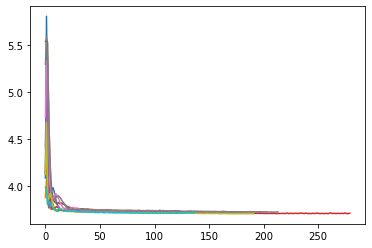

In [24]:
import copy
new_data_unweighted = copy.deepcopy(new_data)
new_data_unweighted.edge_weight = torch.ones(new_data_unweighted.edge_index.shape[1])
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses = train_gnumap(new_data_unweighted, 32, 2, n_layers=2, target=None,
                                 model_type = 'GCN', patience=20, epochs=500, lr=1e-1, wd=1e-2,
                                 min_dist=0.1, name_file="1", subsampling=None,
                                 spread = 1.0, repulsion_strength=10.0,
                                 device=None, verbose = False, normalized = True )
    out_tmp = model(new_data_unweighted.x.float(), new_data_unweighted.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

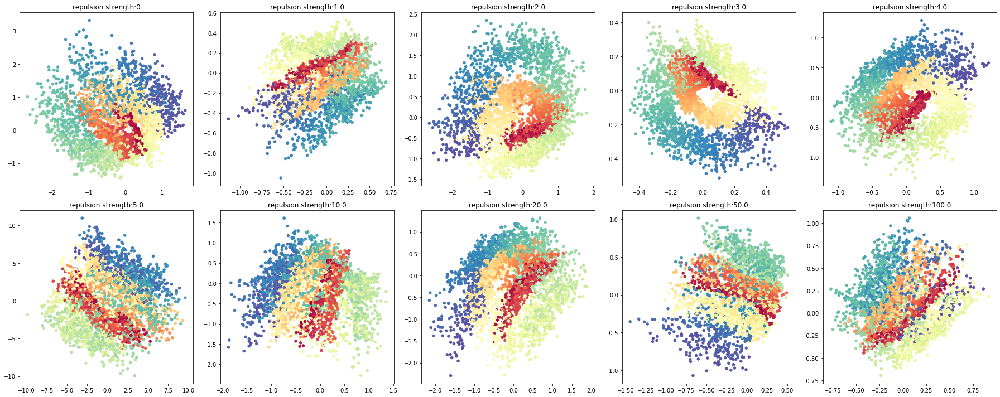

In [25]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

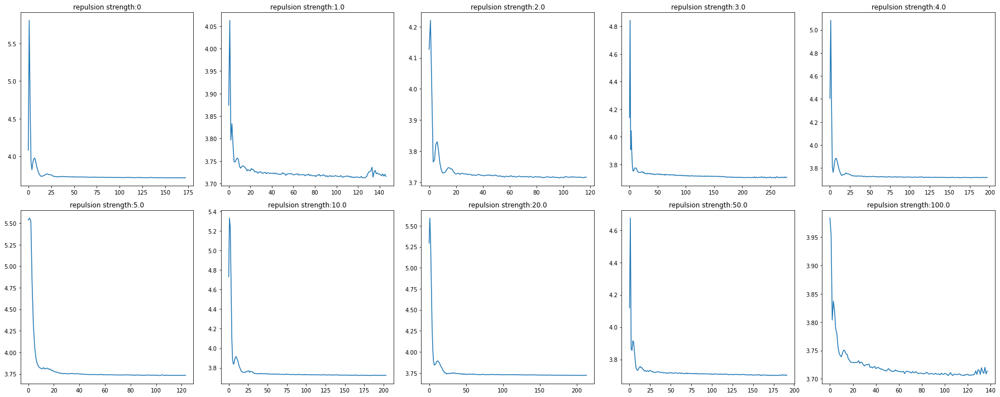

In [26]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

### GCN-layer1

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.9135, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9135, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=0.9135, time=0.0203
loss before neg tensor(0.9131, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9131, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.9131, time=0.0214
loss before neg tensor(0.9128, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9128, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.9128, time=0.0243
loss before neg tensor(0.9124, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9124, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.9124, time=0.0253
loss before neg tensor(0.9121, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9121, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=0.9121, time=0.0216
loss before neg ten

Epoch=050, loss=0.9102, time=0.0222
loss before neg tensor(0.9112, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9112, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=0.9112, time=0.0248
loss before neg tensor(0.9122, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9122, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=0.9122, time=0.0203
loss before neg tensor(0.9101, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9101, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=053, loss=0.9101, time=0.0185
loss before neg tensor(0.9113, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9113, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=054, loss=0.9113, time=0.0206
Early stopping at epoch 54!
Loading 34th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7152, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0370, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.0370, time=0.0204
loss before neg tensor(0.7139, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0301, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.0301, time=0.0331
loss before neg tensor(0.7128, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0220, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.0220, time=0.0237
loss before neg tensor(0.7099, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0145, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.0145, time=0.0264
loss before neg tensor(0.7080, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0108, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.0108, time=0.0240
loss before neg ten

loss before neg tensor(0.7047, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0085, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.0085, time=0.0263
loss before neg tensor(0.7039, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0079, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.0079, time=0.0238
loss before neg tensor(0.7038, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0077, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.0077, time=0.0177
loss before neg tensor(0.7039, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0077, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.0077, time=0.0195
loss before neg tensor(0.7047, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0083, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=1.0083, time=0.0177
loss before neg tensor(0.7046, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.5060, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1289, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.1289, time=0.0179
loss before neg tensor(0.5055, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1257, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.1257, time=0.0176
loss before neg tensor(0.5046, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1206, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.1206, time=0.0178
loss before neg tensor(0.5037, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1151, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.1151, time=0.0180
loss before neg tensor(0.5030, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1110, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.1110, time=0.0217
loss before neg ten

Epoch=047, loss=1.1111, time=0.0190
loss before neg tensor(0.5052, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1097, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.1097, time=0.0188
loss before neg tensor(0.5033, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1094, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.1094, time=0.0199
loss before neg tensor(0.5031, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1079, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.1079, time=0.0193
loss before neg tensor(0.5038, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1097, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=1.1097, time=0.0208
loss before neg tensor(0.5035, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1103, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=1.1103, time=0.0181
loss before neg tensor(0.5026, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.3105, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3087, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.3087, time=0.0199
loss before neg tensor(0.3217, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4276, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.4276, time=0.0214
loss before neg tensor(0.3062, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2816, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.2816, time=0.0225
loss before neg tensor(0.3025, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2444, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.2444, time=0.0240
loss before neg tensor(0.3010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2290, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.2290, time=0.0211
loss before neg ten

Epoch=047, loss=1.2023, time=0.0403
loss before neg tensor(0.2990, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2023, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.2023, time=0.0373
loss before neg tensor(0.2991, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2024, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.2024, time=0.0193
loss before neg tensor(0.2991, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2024, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.2024, time=0.0182
loss before neg tensor(0.2991, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2023, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=1.2023, time=0.0210
loss before neg tensor(0.2991, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2022, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=1.2022, time=0.0202
loss before neg tensor(0.2991, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.1027, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3270, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.3270, time=0.0195
loss before neg tensor(0.1018, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3203, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.3203, time=0.0202
loss before neg tensor(0.1009, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3121, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.3121, time=0.0210
loss before neg tensor(0.1006, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3074, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.3074, time=0.0212
loss before neg tensor(0.1008, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3075, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.3075, time=0.0204
loss before neg ten

loss before neg tensor(0.0994, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3071, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=1.3071, time=0.0208
loss before neg tensor(0.0982, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3045, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.3045, time=0.0207
loss before neg tensor(0.0981, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3041, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.3041, time=0.0235
loss before neg tensor(0.0976, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3036, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.3036, time=0.0236
loss before neg tensor(0.0974, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3024, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.3024, time=0.0197
loss before neg tensor(0.0970, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.0989, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3056, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=1.3056, time=0.0201
loss before neg tensor(0.0985, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3054, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=1.3054, time=0.0193
loss before neg tensor(0.0990, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3064, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=1.3064, time=0.0197
loss before neg tensor(0.0987, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3062, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=1.3062, time=0.0193
loss before neg tensor(0.0993, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3059, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=1.3059, time=0.0196
Early stopping at epoch 96!
Loading 76th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-0.0873, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.6577, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.6577, time=0.0208
loss before neg tensor(-0.1031, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4167, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.4167, time=0.0166
loss before neg tensor(-0.1022, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4357, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.4357, time=0.0172
loss before neg tensor(-0.1001, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4785, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.4785, time=0.0184
loss before neg tensor(-0.0995, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4912, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.4912, time=0.0206
loss before ne

Epoch=044, loss=1.4002, time=0.0189
loss before neg tensor(-0.1078, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3992, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=1.3992, time=0.0192
loss before neg tensor(-0.1081, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3984, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=1.3984, time=0.0183
loss before neg tensor(-0.1080, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3974, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.3974, time=0.0207
loss before neg tensor(-0.1079, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3972, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.3972, time=0.0169
loss before neg tensor(-0.1076, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3989, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.3989, time=0.0159
loss before neg tensor(-0.1074, dtype=torch.

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-1.1125, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0295, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.0295, time=0.0194
loss before neg tensor(-1.1173, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9420, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.9420, time=0.0202
loss before neg tensor(-1.1186, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9043, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.9043, time=0.0183
loss before neg tensor(-1.1168, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9275, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.9275, time=0.0188
loss before neg tensor(-1.1150, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9587, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.9587, time=0.0178
loss before ne

loss before neg tensor(-1.1186, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.8949, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.8949, time=0.0202
loss before neg tensor(-1.1172, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.8967, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=1.8967, time=0.0199
loss before neg tensor(-1.1186, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.8976, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=1.8976, time=0.0199
loss before neg tensor(-1.1184, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.8968, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=053, loss=1.8968, time=0.0191
loss before neg tensor(-1.1178, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.8985, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=054, loss=1.8985, time=0.0191
loss before neg tensor(-1.1182, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-3.0874, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.4387, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=3.4387, time=0.0225
loss before neg tensor(-3.1152, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9319, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.9319, time=0.0219
loss before neg tensor(-3.1115, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.0597, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=3.0597, time=0.0237
loss before neg tensor(-3.1045, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.1930, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=3.1930, time=0.0230
loss before neg tensor(-3.1083, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.1544, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=3.1544, time=0.0234
loss before ne

Epoch=045, loss=2.9109, time=0.0237
loss before neg tensor(-3.1379, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9126, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=2.9126, time=0.0312
loss before neg tensor(-3.1388, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9107, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=2.9107, time=0.0204
loss before neg tensor(-3.1423, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9065, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=2.9065, time=0.0244
loss before neg tensor(-3.1461, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9044, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=2.9044, time=0.0233
loss before neg tensor(-3.1497, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.8992, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=2.8992, time=0.0198
loss before neg tensor(-3.1493, dtype=torch.

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-9.1525, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.2245, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=6.2245, time=0.0206
loss before neg tensor(-9.2028, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.0124, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=6.0124, time=0.0248
loss before neg tensor(-9.2028, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.2241, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=6.2241, time=0.0263
loss before neg tensor(-9.2204, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.9312, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=5.9312, time=0.0257
loss before neg tensor(-9.2295, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.9163, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=5.9163, time=0.0195
loss before ne

loss before neg tensor(-9.2187, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.8608, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=5.8608, time=0.0214
loss before neg tensor(-9.2277, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.8699, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=5.8699, time=0.0186
loss before neg tensor(-9.2254, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.8575, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=5.8575, time=0.0168
loss before neg tensor(-9.2248, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.8679, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=5.8679, time=0.0176
loss before neg tensor(-9.2240, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.8588, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=5.8588, time=0.0178
loss before neg tensor(-9.2303, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-19.3259, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.7191, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=11.7191, time=0.0202
loss before neg tensor(-19.2428, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(19.2636, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=19.2636, time=0.0213
loss before neg tensor(-19.3364, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.7934, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=11.7934, time=0.0234
loss before neg tensor(-19.3190, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.1089, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=11.1089, time=0.0215
loss before neg tensor(-19.3307, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.0733, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=11.0733, time=0.0177

Epoch=046, loss=10.8675, time=0.0217
loss before neg tensor(-19.2979, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.8618, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=10.8618, time=0.0322
loss before neg tensor(-19.3056, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.8629, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=10.8629, time=0.0197
loss before neg tensor(-19.3087, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.8732, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=10.8732, time=0.0225
loss before neg tensor(-19.3095, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.8784, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=10.8784, time=0.0187
loss before neg tensor(-19.3081, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.8719, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=10.8719, time=0.0219
loss before neg tensor(-19.3

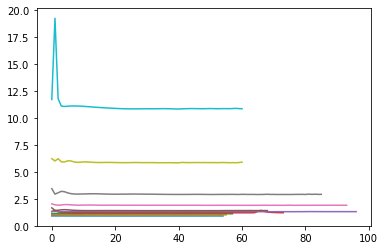

In [68]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses  =  train_gnumap(new_data, 64, 2, n_layers=1, target=None,
                                     model_type = 'GCN', patience=20, epochs=500, lr=5e-1, wd=1e-2,
                                     min_dist=0.1, name_file="1", subsampling=None,
                                     spread = 1.0, repulsion_strength=repulsion_strength[i],
                                     device=None, verbose = False, normalized = True)
    out_tmp = model(new_data.x.float(), new_data.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

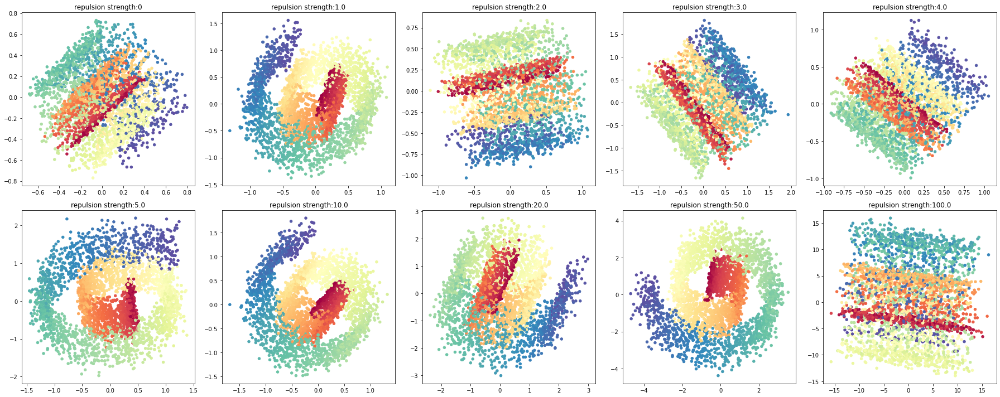

In [69]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

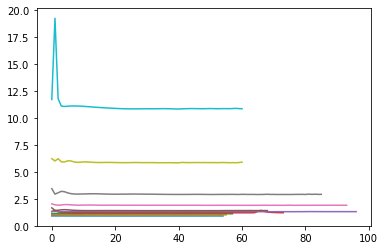

In [70]:
for i in range(num):
    _ = plt.plot(loss[i])

### GNN-standardize

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.9100, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9100, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=0.9100, time=0.0161
loss before neg tensor(0.9100, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9100, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.9100, time=0.0167
loss before neg tensor(0.9099, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9099, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.9099, time=0.0155
loss before neg tensor(0.9095, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9095, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.9095, time=0.0163
loss before neg tensor(0.9099, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9099, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=0.9099, time=0.0178
loss before neg ten

Epoch=055, loss=0.9129, time=0.0165
loss before neg tensor(0.9121, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9121, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=056, loss=0.9121, time=0.0163
loss before neg tensor(0.9121, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9121, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=057, loss=0.9121, time=0.0129
loss before neg tensor(0.9122, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9122, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=058, loss=0.9122, time=0.0131
loss before neg tensor(0.9117, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9117, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=059, loss=0.9117, time=0.0134
loss before neg tensor(0.9118, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9118, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=060, loss=0.9118, time=0.0147
loss before neg tensor(0.9119, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7133, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0243, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.0243, time=0.0139
loss before neg tensor(0.7128, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0229, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.0229, time=0.0129
loss before neg tensor(0.7124, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0209, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.0209, time=0.0132
loss before neg tensor(0.7119, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0186, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.0186, time=0.0134
loss before neg tensor(0.7114, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0163, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.0163, time=0.0138
loss before neg ten

loss before neg tensor(0.7117, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0142, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.0142, time=0.0149
loss before neg tensor(0.7100, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0126, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=1.0126, time=0.0147
loss before neg tensor(0.7102, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0130, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=1.0130, time=0.0140
loss before neg tensor(0.7120, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0147, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=053, loss=1.0147, time=0.0152
loss before neg tensor(0.7124, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0151, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=054, loss=1.0151, time=0.0154
loss before neg tensor(0.7123, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.7101, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0131, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=101, loss=1.0131, time=0.0167
loss before neg tensor(0.7109, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0144, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=102, loss=1.0144, time=0.0136
loss before neg tensor(0.7096, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0130, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=103, loss=1.0130, time=0.0131
loss before neg tensor(0.7072, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0105, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=104, loss=1.0105, time=0.0141
loss before neg tensor(0.7067, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0100, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=105, loss=1.0100, time=0.0135
loss before neg tensor(0.7066, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.7063, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0098, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=146, loss=1.0098, time=0.0166
loss before neg tensor(0.7062, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0096, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=147, loss=1.0096, time=0.0145
loss before neg tensor(0.7062, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0094, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=148, loss=1.0094, time=0.0137
loss before neg tensor(0.7063, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0095, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=149, loss=1.0095, time=0.0133
loss before neg tensor(0.7064, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0096, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=150, loss=1.0096, time=0.0133
loss before neg tensor(0.7064, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.7061, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0092, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=192, loss=1.0092, time=0.0164
loss before neg tensor(0.7061, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0092, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=193, loss=1.0092, time=0.0161
loss before neg tensor(0.7061, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0092, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=194, loss=1.0092, time=0.0137
loss before neg tensor(0.7061, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0092, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=195, loss=1.0092, time=0.0160
loss before neg tensor(0.7063, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0093, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=196, loss=1.0093, time=0.0160
loss before neg tensor(0.7062, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.5105, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1159, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.1159, time=0.0145
loss before neg tensor(0.5078, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1120, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.1120, time=0.0130
loss before neg tensor(0.5090, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1139, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.1139, time=0.0167
loss before neg tensor(0.5165, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1221, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.1221, time=0.0130
loss before neg tensor(0.5115, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1167, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.1167, time=0.0152
loss before neg ten

loss before neg tensor(0.5104, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1133, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=1.1133, time=0.0154
loss before neg tensor(0.5104, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1134, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=1.1134, time=0.0127
loss before neg tensor(0.5087, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1120, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.1120, time=0.0115
loss before neg tensor(0.5094, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1128, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.1128, time=0.0123
loss before neg tensor(0.5082, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1114, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.1114, time=0.0155
loss before neg tensor(0.5086, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=089, loss=1.1118, time=0.0133
loss before neg tensor(0.5076, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1118, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=090, loss=1.1118, time=0.0152
loss before neg tensor(0.5071, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1112, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=091, loss=1.1112, time=0.0141
loss before neg tensor(0.5088, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1130, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=1.1130, time=0.0136
loss before neg tensor(0.5093, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1139, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=1.1139, time=0.0156
loss before neg tensor(0.5092, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1144, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=1.1144, time=0.0134
loss before neg tensor(0.5114, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.3117, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2407, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.2407, time=0.0136
loss before neg tensor(0.3092, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2239, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.2239, time=0.0136
loss before neg tensor(0.3082, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2136, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.2136, time=0.0147
loss before neg tensor(0.3075, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2146, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.2146, time=0.0140
loss before neg tensor(0.3073, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2218, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.2218, time=0.0157
loss before neg ten

Epoch=046, loss=1.2106, time=0.0135
loss before neg tensor(0.3064, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2113, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.2113, time=0.0134
loss before neg tensor(0.3065, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2115, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.2115, time=0.0153
loss before neg tensor(0.3060, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2102, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.2102, time=0.0157
loss before neg tensor(0.3080, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2122, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.2122, time=0.0140
loss before neg tensor(0.3072, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2108, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=1.2108, time=0.0154
loss before neg tensor(0.3067, dtype=torch.float6

Epoch=092, loss=1.2121, time=0.0166
loss before neg tensor(0.3068, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2107, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=1.2107, time=0.0155
loss before neg tensor(0.3070, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2101, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=1.2101, time=0.0131
loss before neg tensor(0.3083, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2116, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=1.2116, time=0.0129
loss before neg tensor(0.3095, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2132, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=1.2132, time=0.0148
loss before neg tensor(0.3083, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2117, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=097, loss=1.2117, time=0.0143
loss before neg tensor(0.3068, dtype=torch.float6

loss before neg tensor(0.3054, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2100, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=142, loss=1.2100, time=0.0165
loss before neg tensor(0.3057, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2100, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=143, loss=1.2100, time=0.0136
loss before neg tensor(0.3062, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2105, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=144, loss=1.2105, time=0.0157
loss before neg tensor(0.3054, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2097, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=145, loss=1.2097, time=0.0135
loss before neg tensor(0.3054, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2100, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=146, loss=1.2100, time=0.0134
loss before neg tensor(0.3056, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.3067, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2118, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=188, loss=1.2118, time=0.0150
loss before neg tensor(0.3052, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2103, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=189, loss=1.2103, time=0.0164
loss before neg tensor(0.3054, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2103, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=190, loss=1.2103, time=0.0143
loss before neg tensor(0.3052, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2099, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=191, loss=1.2099, time=0.0156
loss before neg tensor(0.3056, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2104, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=192, loss=1.2104, time=0.0138
loss before neg tensor(0.3055, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.1110, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3695, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.3695, time=0.0138
loss before neg tensor(0.1094, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3478, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.3478, time=0.0134
loss before neg tensor(0.1076, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3250, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.3250, time=0.0132
loss before neg tensor(0.1064, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3149, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.3149, time=0.0143
loss before neg tensor(0.1052, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3173, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.3173, time=0.0154
loss before neg ten

Epoch=048, loss=1.3131, time=0.0139
loss before neg tensor(0.1055, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3135, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.3135, time=0.0151
loss before neg tensor(0.1057, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3138, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.3138, time=0.0137
loss before neg tensor(0.1045, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3137, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=1.3137, time=0.0129
loss before neg tensor(0.1047, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3129, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=1.3129, time=0.0127
loss before neg tensor(0.1047, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3130, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=053, loss=1.3130, time=0.0120
loss before neg tensor(0.1049, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-0.0960, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4206, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.4206, time=0.0176
loss before neg tensor(-0.0962, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4175, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.4175, time=0.0146
loss before neg tensor(-0.0966, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4143, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.4143, time=0.0132
loss before neg tensor(-0.0970, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4135, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.4135, time=0.0138
loss before neg tensor(-0.0971, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4152, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.4152, time=0.0134
loss before ne

Epoch=050, loss=1.4112, time=0.0157
loss before neg tensor(-0.0956, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4111, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=1.4111, time=0.0178
Early stopping at epoch 51!
Loading 31th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-1.0924, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9385, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.9385, time=0.0171
loss before neg tensor(-1.0930, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9335, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.9335, time=0.0152
loss before neg tensor(-1.0938, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9292, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.9292, time=0.0169
loss before neg tensor(-1.0945, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9294, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.9294, time=0.0166
loss before neg tensor(-1.0947, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9324, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.9324, time=0.0157
loss before ne

loss before neg tensor(-1.1089, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9129, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=055, loss=1.9129, time=0.0147
loss before neg tensor(-1.1076, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9137, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=056, loss=1.9137, time=0.0132
loss before neg tensor(-1.1079, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9116, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=057, loss=1.9116, time=0.0187
loss before neg tensor(-1.1091, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9078, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=058, loss=1.9078, time=0.0169
loss before neg tensor(-1.1095, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9078, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=059, loss=1.9078, time=0.0152
loss before neg tensor(-1.1097, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-3.0873, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.2999, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=3.2999, time=0.0132
loss before neg tensor(-3.1118, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9349, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.9349, time=0.0120
loss before neg tensor(-3.1049, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.1493, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=3.1493, time=0.0123
loss before neg tensor(-3.1092, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.1094, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=3.1094, time=0.0150
loss before neg tensor(-3.1173, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9828, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=2.9828, time=0.0134
loss before ne

loss before neg tensor(-3.1287, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.8972, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=2.8972, time=0.0164
loss before neg tensor(-3.1272, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.8992, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=2.8992, time=0.0141
loss before neg tensor(-3.1251, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9041, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=2.9041, time=0.0173
loss before neg tensor(-3.1255, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9023, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=2.9023, time=0.0150
loss before neg tensor(-3.1292, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.8970, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=2.8970, time=0.0150
loss before neg tensor(-3.1288, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Epoch=097, loss=2.8932, time=0.0124
loss before neg tensor(-3.1278, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.8850, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=098, loss=2.8850, time=0.0151
loss before neg tensor(-3.1306, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.8803, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=099, loss=2.8803, time=0.0131
loss before neg tensor(-3.1312, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.8828, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=100, loss=2.8828, time=0.0150
loss before neg tensor(-3.1317, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.8849, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=101, loss=2.8849, time=0.0128
loss before neg tensor(-3.1271, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.8913, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=102, loss=2.8913, time=0.0139
loss before neg tensor(-3.1239, dtype=torch.

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-9.0391, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.8032, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=7.8032, time=0.0132
loss before neg tensor(-9.0646, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.7351, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=6.7351, time=0.0127
loss before neg tensor(-9.0587, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.4638, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=7.4638, time=0.0173
loss before neg tensor(-9.0979, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.0044, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=7.0044, time=0.0167
loss before neg tensor(-9.1306, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(6.5325, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=6.5325, time=0.0370
loss before ne

Epoch=048, loss=5.9557, time=0.0151
loss before neg tensor(-9.1546, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.9629, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=5.9629, time=0.0147
loss before neg tensor(-9.1552, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.9627, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=5.9627, time=0.0149
loss before neg tensor(-9.1569, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.9547, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=5.9547, time=0.0138
loss before neg tensor(-9.1581, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.9536, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=5.9536, time=0.0151
loss before neg tensor(-9.1597, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.9615, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=053, loss=5.9615, time=0.0136
loss before neg tensor(-9.1620, dtype=torch.

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-19.0698, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(15.3894, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=15.3894, time=0.0142
loss before neg tensor(-18.8647, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.2781, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=16.2781, time=0.0136
loss before neg tensor(-18.9446, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(14.5711, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=14.5711, time=0.0131
loss before neg tensor(-18.9823, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(13.9156, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=13.9156, time=0.0159
loss before neg tensor(-19.0026, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(13.5450, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=13.5450, time=0.0134

Epoch=043, loss=11.0786, time=0.0156
loss before neg tensor(-19.1485, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.0732, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=11.0732, time=0.0156
loss before neg tensor(-19.1490, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.0761, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=11.0761, time=0.0152
loss before neg tensor(-19.1491, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.0880, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=11.0880, time=0.0153
loss before neg tensor(-19.1485, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.1087, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=11.1087, time=0.0136
loss before neg tensor(-19.1473, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.1376, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=11.1376, time=0.0146
loss before neg tensor(-19.1

loss before neg tensor(-19.3088, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.8841, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=091, loss=10.8841, time=0.0146
loss before neg tensor(-19.2992, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.8945, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=10.8945, time=0.0129
loss before neg tensor(-19.2840, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.9079, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=10.9079, time=0.0137
loss before neg tensor(-19.2704, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.9070, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=10.9070, time=0.0125
loss before neg tensor(-19.2691, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.8998, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=10.8998, time=0.0126
loss before neg tensor(-19.2723, dtype=torch.float64, grad_fn=<Ne

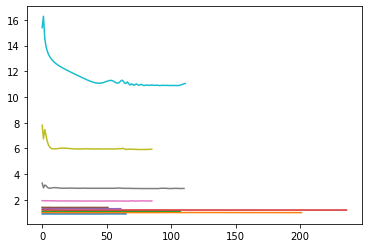

In [27]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses  =  train_gnumap(new_data, 32, 2, n_layers=1, target=None,
                                     model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                     norm = 'standardize', patience=20, epochs=500, lr=5e-1, wd=1e-2,
                                     min_dist=0.1, name_file="1", subsampling=None,
                                     spread = 1.0, repulsion_strength=repulsion_strength[i],
                                     device=None, verbose = False, normalized = True)
    out_tmp = model(new_data.x.float(), new_data.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

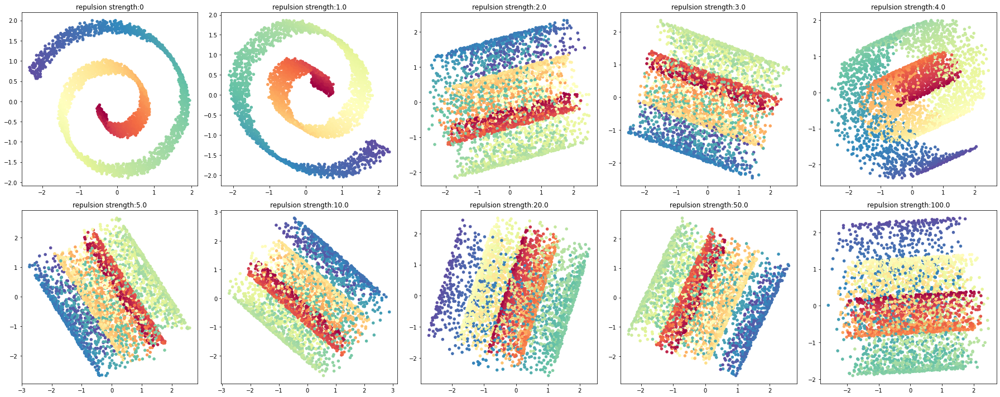

In [28]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7056, grad_fn=<NegBackward0>)
loss final tensor(3.8595, grad_fn=<AddBackward0>)
Epoch=000, loss=3.8595, time=0.0325
loss before neg tensor(0.7041, grad_fn=<NegBackward0>)
loss final tensor(3.7667, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7667, time=0.0358
loss before neg tensor(0.7032, grad_fn=<NegBackward0>)
loss final tensor(3.7190, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7190, time=0.0359
loss before neg tensor(0.7032, grad_fn=<NegBackward0>)
loss final tensor(3.7332, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7332, time=0.0311
loss before neg tensor(0.7037, grad_fn=<NegBackward0>)
loss final tensor(3.7690, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7690, time=0.0298
loss before neg tensor(0.7038, grad_fn=<NegBackward0>)
loss final tensor(3.7853, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7853, time=0.0291
loss before neg tensor(0.7036, grad_fn=<NegBackward0>)
loss final tensor(3.7710, grad_fn

loss before neg tensor(0.7045, grad_fn=<NegBackward0>)
loss final tensor(3.7160, grad_fn=<AddBackward0>)
Epoch=060, loss=3.7160, time=0.0221
loss before neg tensor(0.7043, grad_fn=<NegBackward0>)
loss final tensor(3.7132, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7132, time=0.0223
loss before neg tensor(0.7055, grad_fn=<NegBackward0>)
loss final tensor(3.7154, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7154, time=0.0214
loss before neg tensor(0.7056, grad_fn=<NegBackward0>)
loss final tensor(3.7141, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7141, time=0.0208
loss before neg tensor(0.7050, grad_fn=<NegBackward0>)
loss final tensor(3.7164, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7164, time=0.0200
loss before neg tensor(0.7047, grad_fn=<NegBackward0>)
loss final tensor(3.7151, grad_fn=<AddBackward0>)
Epoch=065, loss=3.7151, time=0.0211
loss before neg tensor(0.7048, grad_fn=<NegBackward0>)
loss final tensor(3.7156, grad_fn=<AddBackward0>)
Epoch=066, loss=3.7156, time=0.0191
loss before n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7031, grad_fn=<NegBackward0>)
loss final tensor(3.7818, grad_fn=<AddBackward0>)
Epoch=000, loss=3.7818, time=0.0175
loss before neg tensor(0.7029, grad_fn=<NegBackward0>)
loss final tensor(3.7542, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7542, time=0.0180
loss before neg tensor(0.7031, grad_fn=<NegBackward0>)
loss final tensor(3.7311, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7311, time=0.0172
loss before neg tensor(0.7038, grad_fn=<NegBackward0>)
loss final tensor(3.7313, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7313, time=0.0193
loss before neg tensor(0.7040, grad_fn=<NegBackward0>)
loss final tensor(3.7464, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7464, time=0.0170
loss before neg tensor(0.7039, grad_fn=<NegBackward0>)
loss final tensor(3.7569, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7569, time=0.0176
loss before neg tensor(0.7038, grad_fn=<NegBackward0>)
loss final tensor(3.7522, grad_fn

Epoch=057, loss=3.7286, time=0.0174
loss before neg tensor(0.7042, grad_fn=<NegBackward0>)
loss final tensor(3.7296, grad_fn=<AddBackward0>)
Epoch=058, loss=3.7296, time=0.0175
loss before neg tensor(0.7042, grad_fn=<NegBackward0>)
loss final tensor(3.7292, grad_fn=<AddBackward0>)
Epoch=059, loss=3.7292, time=0.0168
loss before neg tensor(0.7034, grad_fn=<NegBackward0>)
loss final tensor(3.7270, grad_fn=<AddBackward0>)
Epoch=060, loss=3.7270, time=0.0193
loss before neg tensor(0.7037, grad_fn=<NegBackward0>)
loss final tensor(3.7305, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7305, time=0.0180
loss before neg tensor(0.7046, grad_fn=<NegBackward0>)
loss final tensor(3.7274, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7274, time=0.0183
loss before neg tensor(0.7042, grad_fn=<NegBackward0>)
loss final tensor(3.7269, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7269, time=0.0181
loss before neg tensor(0.7046, grad_fn=<NegBackward0>)
loss final tensor(3.7262, grad_fn=<AddBackward0>)
Epoch=064, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7036, grad_fn=<NegBackward0>)
loss final tensor(3.8018, grad_fn=<AddBackward0>)
Epoch=000, loss=3.8018, time=0.0179
loss before neg tensor(0.7026, grad_fn=<NegBackward0>)
loss final tensor(3.7347, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7347, time=0.0174
loss before neg tensor(0.7021, grad_fn=<NegBackward0>)
loss final tensor(3.7378, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7378, time=0.0171
loss before neg tensor(0.7023, grad_fn=<NegBackward0>)
loss final tensor(3.7724, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7724, time=0.0175
loss before neg tensor(0.7016, grad_fn=<NegBackward0>)
loss final tensor(3.7677, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7677, time=0.0170
loss before neg tensor(0.7021, grad_fn=<NegBackward0>)
loss final tensor(3.7407, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7407, time=0.0167
loss before neg tensor(0.7028, grad_fn=<NegBackward0>)
loss final tensor(3.7294, grad_fn

loss before neg tensor(0.7047, grad_fn=<NegBackward0>)
loss final tensor(3.7257, grad_fn=<AddBackward0>)
Epoch=058, loss=3.7257, time=0.0198
loss before neg tensor(0.7046, grad_fn=<NegBackward0>)
loss final tensor(3.7257, grad_fn=<AddBackward0>)
Epoch=059, loss=3.7257, time=0.0180
loss before neg tensor(0.7029, grad_fn=<NegBackward0>)
loss final tensor(3.7257, grad_fn=<AddBackward0>)
Epoch=060, loss=3.7257, time=0.0164
loss before neg tensor(0.7026, grad_fn=<NegBackward0>)
loss final tensor(3.7268, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7268, time=0.0161
loss before neg tensor(0.7023, grad_fn=<NegBackward0>)
loss final tensor(3.7276, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7276, time=0.0160
loss before neg tensor(0.7022, grad_fn=<NegBackward0>)
loss final tensor(3.7282, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7282, time=0.0170
loss before neg tensor(0.7031, grad_fn=<NegBackward0>)
loss final tensor(3.7282, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7282, time=0.0161
loss before n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7050, grad_fn=<NegBackward0>)
loss final tensor(3.7231, grad_fn=<AddBackward0>)
Epoch=000, loss=3.7231, time=0.0163
loss before neg tensor(0.7048, grad_fn=<NegBackward0>)
loss final tensor(3.7213, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7213, time=0.0153
loss before neg tensor(0.7045, grad_fn=<NegBackward0>)
loss final tensor(3.7201, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7201, time=0.0174
loss before neg tensor(0.7042, grad_fn=<NegBackward0>)
loss final tensor(3.7204, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7204, time=0.0165
loss before neg tensor(0.7039, grad_fn=<NegBackward0>)
loss final tensor(3.7209, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7209, time=0.0163
loss before neg tensor(0.7037, grad_fn=<NegBackward0>)
loss final tensor(3.7208, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7208, time=0.0179
loss before neg tensor(0.7036, grad_fn=<NegBackward0>)
loss final tensor(3.7194, grad_fn

Epoch=060, loss=3.7189, time=0.0164
loss before neg tensor(0.7025, grad_fn=<NegBackward0>)
loss final tensor(3.7182, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7182, time=0.0174
loss before neg tensor(0.7029, grad_fn=<NegBackward0>)
loss final tensor(3.7183, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7183, time=0.0161
loss before neg tensor(0.7033, grad_fn=<NegBackward0>)
loss final tensor(3.7189, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7189, time=0.0170
loss before neg tensor(0.7030, grad_fn=<NegBackward0>)
loss final tensor(3.7184, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7184, time=0.0162
loss before neg tensor(0.7026, grad_fn=<NegBackward0>)
loss final tensor(3.7181, grad_fn=<AddBackward0>)
Epoch=065, loss=3.7181, time=0.0160
loss before neg tensor(0.7045, grad_fn=<NegBackward0>)
loss final tensor(3.7189, grad_fn=<AddBackward0>)
Epoch=066, loss=3.7189, time=0.0178
loss before neg tensor(0.7049, grad_fn=<NegBackward0>)
loss final tensor(3.7216, grad_fn=<AddBackward0>)
Epoch=067, lo

loss final tensor(3.7152, grad_fn=<AddBackward0>)
Epoch=125, loss=3.7152, time=0.0174
Early stopping at epoch 125!
Loading 105th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7050, grad_fn=<NegBackward0>)
loss final tensor(3.8347, grad_fn=<AddBackward0>)
Epoch=000, loss=3.8347, time=0.0163
loss before neg tensor(0.7038, grad_fn=<NegBackward0>)
loss final tensor(3.7641, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7641, time=0.0167
loss before neg tensor(0.7028, grad_fn=<NegBackward0>)
loss final tensor(3.7188, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7188, time=0.0164
loss before neg tensor(0.7022, grad_fn=<NegBackward0>)
loss final tensor(3.7260, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7260, time=0.0173
loss before neg tensor(0.7019, grad_fn=<NegBackward0>)
loss final tensor(3.7567, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7567, time=0.0180
loss before neg tensor(0.7017, grad_fn=<NegBackward0>)
loss final tensor(3.7741, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7741, time=0.0179
loss before neg tensor(0.7014, grad_fn=<NegBackward0>)
loss final tensor(3.7645, grad_fn

Epoch=058, loss=3.7137, time=0.0254
loss before neg tensor(0.7012, grad_fn=<NegBackward0>)
loss final tensor(3.7152, grad_fn=<AddBackward0>)
Epoch=059, loss=3.7152, time=0.0194
loss before neg tensor(0.7010, grad_fn=<NegBackward0>)
loss final tensor(3.7143, grad_fn=<AddBackward0>)
Epoch=060, loss=3.7143, time=0.0170
loss before neg tensor(0.7011, grad_fn=<NegBackward0>)
loss final tensor(3.7131, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7131, time=0.0183
loss before neg tensor(0.7017, grad_fn=<NegBackward0>)
loss final tensor(3.7136, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7136, time=0.0180
loss before neg tensor(0.7027, grad_fn=<NegBackward0>)
loss final tensor(3.7160, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7160, time=0.0182
loss before neg tensor(0.7030, grad_fn=<NegBackward0>)
loss final tensor(3.7194, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7194, time=0.0217
loss before neg tensor(0.7009, grad_fn=<NegBackward0>)
loss final tensor(3.7267, grad_fn=<AddBackward0>)
Epoch=065, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7076, grad_fn=<NegBackward0>)
loss final tensor(3.8536, grad_fn=<AddBackward0>)
Epoch=000, loss=3.8536, time=0.0174
loss before neg tensor(0.7060, grad_fn=<NegBackward0>)
loss final tensor(3.7563, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7563, time=0.0168
loss before neg tensor(0.7053, grad_fn=<NegBackward0>)
loss final tensor(3.7247, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7247, time=0.0160
loss before neg tensor(0.7056, grad_fn=<NegBackward0>)
loss final tensor(3.7547, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7547, time=0.0182
loss before neg tensor(0.7058, grad_fn=<NegBackward0>)
loss final tensor(3.7855, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7855, time=0.0172
loss before neg tensor(0.7055, grad_fn=<NegBackward0>)
loss final tensor(3.7819, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7819, time=0.0155
loss before neg tensor(0.7050, grad_fn=<NegBackward0>)
loss final tensor(3.7546, grad_fn

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7045, grad_fn=<NegBackward0>)
loss final tensor(3.7412, grad_fn=<AddBackward0>)
Epoch=000, loss=3.7412, time=0.0166
loss before neg tensor(0.7039, grad_fn=<NegBackward0>)
loss final tensor(3.7140, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7140, time=0.0163
loss before neg tensor(0.7041, grad_fn=<NegBackward0>)
loss final tensor(3.7287, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7287, time=0.0198
loss before neg tensor(0.7039, grad_fn=<NegBackward0>)
loss final tensor(3.7339, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7339, time=0.0170
loss before neg tensor(0.7038, grad_fn=<NegBackward0>)
loss final tensor(3.7159, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7159, time=0.0162
loss before neg tensor(0.7044, grad_fn=<NegBackward0>)
loss final tensor(3.7170, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7170, time=0.0169
loss before neg tensor(0.7049, grad_fn=<NegBackward0>)
loss final tensor(3.7272, grad_fn

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7128, grad_fn=<NegBackward0>)
loss final tensor(4.4437, grad_fn=<AddBackward0>)
Epoch=000, loss=4.4437, time=0.0176
loss before neg tensor(0.7040, grad_fn=<NegBackward0>)
loss final tensor(3.7223, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7223, time=0.0152
loss before neg tensor(0.7059, grad_fn=<NegBackward0>)
loss final tensor(3.7953, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7953, time=0.0166
loss before neg tensor(0.7075, grad_fn=<NegBackward0>)
loss final tensor(3.8911, grad_fn=<AddBackward0>)
Epoch=003, loss=3.8911, time=0.0182
loss before neg tensor(0.7080, grad_fn=<NegBackward0>)
loss final tensor(3.9272, grad_fn=<AddBackward0>)
Epoch=004, loss=3.9272, time=0.0179
loss before neg tensor(0.7077, grad_fn=<NegBackward0>)
loss final tensor(3.9150, grad_fn=<AddBackward0>)
Epoch=005, loss=3.9150, time=0.0186
loss before neg tensor(0.7076, grad_fn=<NegBackward0>)
loss final tensor(3.8817, grad_fn

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7004, grad_fn=<NegBackward0>)
loss final tensor(3.7532, grad_fn=<AddBackward0>)
Epoch=000, loss=3.7532, time=0.0195
loss before neg tensor(0.7006, grad_fn=<NegBackward0>)
loss final tensor(3.7255, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7255, time=0.0198
loss before neg tensor(0.7011, grad_fn=<NegBackward0>)
loss final tensor(3.7147, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7147, time=0.0201
loss before neg tensor(0.7016, grad_fn=<NegBackward0>)
loss final tensor(3.7300, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7300, time=0.0208
loss before neg tensor(0.7012, grad_fn=<NegBackward0>)
loss final tensor(3.7385, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7385, time=0.0194
loss before neg tensor(0.7012, grad_fn=<NegBackward0>)
loss final tensor(3.7248, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7248, time=0.0194
loss before neg tensor(0.7012, grad_fn=<NegBackward0>)
loss final tensor(3.7112, grad_fn

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7024, grad_fn=<NegBackward0>)
loss final tensor(3.7245, grad_fn=<AddBackward0>)
Epoch=000, loss=3.7245, time=0.0179
loss before neg tensor(0.7021, grad_fn=<NegBackward0>)
loss final tensor(3.7222, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7222, time=0.0159
loss before neg tensor(0.7022, grad_fn=<NegBackward0>)
loss final tensor(3.7213, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7213, time=0.0165
loss before neg tensor(0.7022, grad_fn=<NegBackward0>)
loss final tensor(3.7199, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7199, time=0.0187
loss before neg tensor(0.7023, grad_fn=<NegBackward0>)
loss final tensor(3.7192, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7192, time=0.0166
loss before neg tensor(0.7029, grad_fn=<NegBackward0>)
loss final tensor(3.7191, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7191, time=0.0170
loss before neg tensor(0.7033, grad_fn=<NegBackward0>)
loss final tensor(3.7183, grad_fn

Epoch=062, loss=3.7166, time=0.0172
loss before neg tensor(0.7024, grad_fn=<NegBackward0>)
loss final tensor(3.7160, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7160, time=0.0188
loss before neg tensor(0.7024, grad_fn=<NegBackward0>)
loss final tensor(3.7165, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7165, time=0.0195
loss before neg tensor(0.7024, grad_fn=<NegBackward0>)
loss final tensor(3.7157, grad_fn=<AddBackward0>)
Epoch=065, loss=3.7157, time=0.0174
loss before neg tensor(0.7024, grad_fn=<NegBackward0>)
loss final tensor(3.7165, grad_fn=<AddBackward0>)
Epoch=066, loss=3.7165, time=0.0251
loss before neg tensor(0.7021, grad_fn=<NegBackward0>)
loss final tensor(3.7163, grad_fn=<AddBackward0>)
Epoch=067, loss=3.7163, time=0.0207
loss before neg tensor(0.7020, grad_fn=<NegBackward0>)
loss final tensor(3.7167, grad_fn=<AddBackward0>)
Epoch=068, loss=3.7167, time=0.0185
loss before neg tensor(0.7023, grad_fn=<NegBackward0>)
loss final tensor(3.7162, grad_fn=<AddBackward0>)
Epoch=069, lo

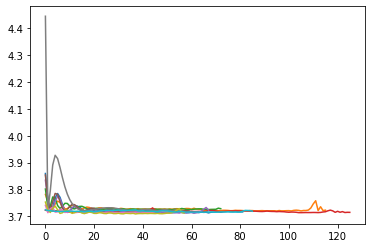

In [31]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses = train_gnumap(new_data_unweighted, 32, 2, n_layers=1, target=None,
                                  model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                  norm = 'standardize', patience=20, epochs=500, lr=5e-1, wd=1e-2,
                                  min_dist=0.1, name_file="1", subsampling=None,
                                  spread = 1.0, repulsion_strength=10.0,
                                  device=None, verbose = False, normalized = True )
    out_tmp = model(new_data_unweighted.x.float(), new_data_unweighted.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

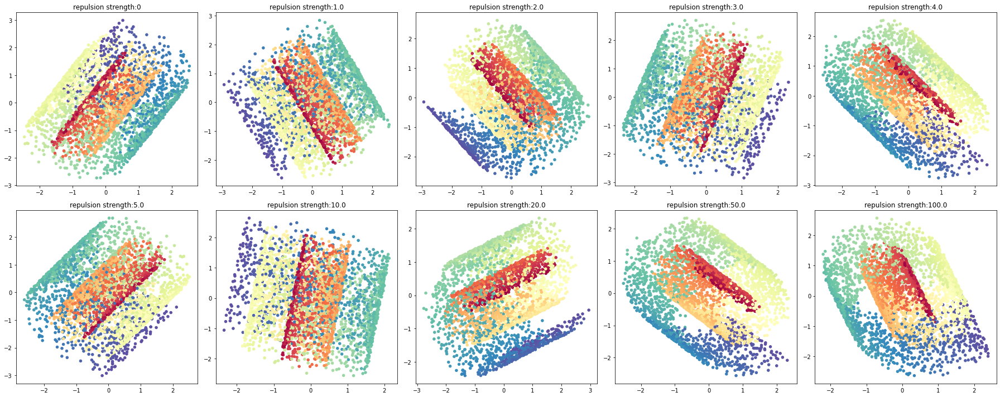

In [32]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

### GNN-normalize

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.9125, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9125, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=0.9125, time=0.0178
loss before neg tensor(0.9123, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9123, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.9123, time=0.0185
loss before neg tensor(0.9122, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9122, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.9122, time=0.0169
loss before neg tensor(0.9119, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9119, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.9119, time=0.0187
loss before neg tensor(0.9117, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9117, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=0.9117, time=0.0168
loss before neg ten

loss before neg tensor(0.9064, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9064, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=0.9064, time=0.0217
loss before neg tensor(0.9063, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9063, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=0.9063, time=0.0208
loss before neg tensor(0.9062, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9062, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=0.9062, time=0.0193
loss before neg tensor(0.9063, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9063, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=0.9063, time=0.0165
loss before neg tensor(0.9063, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9063, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=0.9063, time=0.0164
loss before neg tensor(0.9062, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=093, loss=0.9008, time=0.0169
loss before neg tensor(0.9007, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9007, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=0.9007, time=0.0168
loss before neg tensor(0.9007, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9007, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=0.9007, time=0.0164
loss before neg tensor(0.9006, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9006, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=0.9006, time=0.0157
loss before neg tensor(0.9005, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9005, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=097, loss=0.9005, time=0.0160
loss before neg tensor(0.9005, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9005, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=098, loss=0.9005, time=0.0164
loss before neg tensor(0.9005, dtype=torch.float6

Epoch=138, loss=0.9003, time=0.0258
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=139, loss=0.9003, time=0.0170
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=140, loss=0.9003, time=0.0163
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=141, loss=0.9003, time=0.0164
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=142, loss=0.9003, time=0.0166
loss before neg tensor(0.9003, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=143, loss=0.9003, time=0.0163
loss before neg tensor(0.9003, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7268, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0828, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.0828, time=0.0164
loss before neg tensor(0.7203, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0591, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.0591, time=0.0170
loss before neg tensor(0.7154, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0371, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.0371, time=0.0169
loss before neg tensor(0.7118, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0227, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.0227, time=0.0193
loss before neg tensor(0.7103, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0155, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.0155, time=0.0220
loss before neg ten

loss before neg tensor(0.7096, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0119, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.0119, time=0.0214
loss before neg tensor(0.7096, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0120, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.0120, time=0.0177
loss before neg tensor(0.7095, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0115, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.0115, time=0.0160
loss before neg tensor(0.7093, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0111, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.0111, time=0.0179
loss before neg tensor(0.7093, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.0113, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=1.0113, time=0.0149
loss before neg tensor(0.7093, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.5110, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1234, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.1234, time=0.0187
loss before neg tensor(0.5110, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1227, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.1227, time=0.0189
loss before neg tensor(0.5111, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1214, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.1214, time=0.0206
loss before neg tensor(0.5112, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1199, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.1199, time=0.0162
loss before neg tensor(0.5112, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1184, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.1184, time=0.0195
loss before neg ten

loss before neg tensor(0.5079, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1119, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.1119, time=0.0199
loss before neg tensor(0.5078, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1116, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.1116, time=0.0190
loss before neg tensor(0.5075, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1119, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.1119, time=0.0157
loss before neg tensor(0.5076, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1114, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.1114, time=0.0174
loss before neg tensor(0.5078, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.1120, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=1.1120, time=0.0163
loss before neg tensor(0.5074, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.3066, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2220, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.2220, time=0.0173
loss before neg tensor(0.3060, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2187, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.2187, time=0.0174
loss before neg tensor(0.3059, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2157, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.2157, time=0.0158
loss before neg tensor(0.3063, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2152, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.2152, time=0.0212
loss before neg tensor(0.3066, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2165, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.2165, time=0.0216
loss before neg ten

Epoch=045, loss=1.2150, time=0.0188
loss before neg tensor(0.3062, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2141, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=1.2141, time=0.0184
loss before neg tensor(0.3065, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2148, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.2148, time=0.0128
loss before neg tensor(0.3063, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2159, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.2159, time=0.0185
loss before neg tensor(0.3060, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2139, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.2139, time=0.0175
loss before neg tensor(0.3059, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2142, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.2142, time=0.0135
loss before neg tensor(0.3061, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.1113, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3765, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.3765, time=0.0189
loss before neg tensor(0.1096, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3562, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.3562, time=0.0171
loss before neg tensor(0.1070, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3315, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.3315, time=0.0175
loss before neg tensor(0.1051, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3161, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.3161, time=0.0197
loss before neg tensor(0.1041, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3124, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.3124, time=0.0177
loss before neg ten

loss before neg tensor(0.1045, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3120, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.3120, time=0.0202
loss before neg tensor(0.1045, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3120, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.3120, time=0.0150
loss before neg tensor(0.1043, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3112, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.3112, time=0.0150
loss before neg tensor(0.1042, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3116, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.3116, time=0.0207
loss before neg tensor(0.1045, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3120, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=1.3120, time=0.0177
loss before neg tensor(0.1046, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-0.0881, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4756, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.4756, time=0.0166
loss before neg tensor(-0.0912, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4360, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.4360, time=0.0166
loss before neg tensor(-0.0929, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4141, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.4141, time=0.0168
loss before neg tensor(-0.0927, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4234, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.4234, time=0.0165
loss before neg tensor(-0.0932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4398, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.4398, time=0.0185
loss before ne

Epoch=045, loss=1.4166, time=0.0224
loss before neg tensor(-0.0922, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4138, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=1.4138, time=0.0342
loss before neg tensor(-0.0934, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4133, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.4133, time=0.0189
loss before neg tensor(-0.0945, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4117, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.4117, time=0.0162
loss before neg tensor(-0.0934, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4618, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.4618, time=0.0157
loss before neg tensor(-0.0912, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4292, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.4292, time=0.0191
loss before neg tensor(-0.0915, dtype=torch.

loss before neg tensor(-0.0980, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4107, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=1.4107, time=0.0154
loss before neg tensor(-0.0982, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4103, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=1.4103, time=0.0223
loss before neg tensor(-0.0989, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4108, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=1.4108, time=0.0181
loss before neg tensor(-0.0993, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4115, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=1.4115, time=0.0158
loss before neg tensor(-0.0986, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.4101, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=097, loss=1.4101, time=0.0194
loss before neg tensor(-0.0984, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-1.0797, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0334, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.0334, time=0.0173
loss before neg tensor(-1.0856, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9458, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.9458, time=0.0167
loss before neg tensor(-1.0944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9229, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.9229, time=0.0183
loss before neg tensor(-1.0946, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9598, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.9598, time=0.0157
loss before neg tensor(-1.0954, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9747, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.9747, time=0.0229
loss before ne

loss before neg tensor(-1.1103, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9020, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=1.9020, time=0.0169
loss before neg tensor(-1.1126, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9033, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.9033, time=0.0173
loss before neg tensor(-1.1046, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9106, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.9106, time=0.0153
loss before neg tensor(-1.1054, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9105, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.9105, time=0.0167
loss before neg tensor(-1.1050, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9107, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.9107, time=0.0193
loss before neg tensor(-1.1051, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-3.1064, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.2803, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=3.2803, time=0.0196
loss before neg tensor(-3.1306, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9420, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.9420, time=0.0159
loss before neg tensor(-3.1266, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.0743, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=3.0743, time=0.0182
loss before neg tensor(-3.1187, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(3.0760, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=3.0760, time=0.0167
loss before neg tensor(-3.1200, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9932, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=2.9932, time=0.0169
loss before ne

Epoch=047, loss=2.9013, time=0.0599
loss before neg tensor(-3.1297, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9001, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=2.9001, time=0.0293
loss before neg tensor(-3.1302, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.8999, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=2.8999, time=0.0173
loss before neg tensor(-3.1297, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9014, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=2.9014, time=0.0186
loss before neg tensor(-3.1296, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.8992, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=2.8992, time=0.0183
loss before neg tensor(-3.1299, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9021, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=2.9021, time=0.0192
loss before neg tensor(-3.1288, dtype=torch.

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-9.0657, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.4202, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=7.4202, time=0.0181
loss before neg tensor(-9.0829, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.2006, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=10.2006, time=0.0154
loss before neg tensor(-9.0686, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.0504, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=10.0504, time=0.0242
loss before neg tensor(-9.0677, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(9.7754, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=9.7754, time=0.0198
loss before neg tensor(-9.0671, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(9.2842, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=9.2842, time=0.0206
loss befor

loss before neg tensor(-9.1676, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.9303, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=5.9303, time=0.0203
loss before neg tensor(-9.1716, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.9206, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=5.9206, time=0.0143
loss before neg tensor(-9.1770, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.9109, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=5.9109, time=0.0282
loss before neg tensor(-9.1826, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.9055, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=5.9055, time=0.0136
loss before neg tensor(-9.1876, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(5.9065, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=5.9065, time=0.0145
loss before neg tensor(-9.1915, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-19.0685, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.6217, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=11.6217, time=0.0162
loss before neg tensor(-18.9494, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(14.9189, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=14.9189, time=0.0171
loss before neg tensor(-19.1859, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(12.0638, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=12.0638, time=0.0168
loss before neg tensor(-19.1914, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(12.6363, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=12.6363, time=0.0154
loss before neg tensor(-19.1633, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(12.3391, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=12.3391, time=0.0166

loss before neg tensor(-19.2386, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.9815, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=10.9815, time=0.0253
loss before neg tensor(-19.2321, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(10.9910, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=10.9910, time=0.0159
loss before neg tensor(-19.2273, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.0010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=11.0010, time=0.0173
loss before neg tensor(-19.2208, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.0077, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=11.0077, time=0.0233
loss before neg tensor(-19.2176, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(11.0051, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=11.0051, time=0.0186
loss before neg tensor(-19.2210, dtype=torch.float64, grad_fn=<Ne

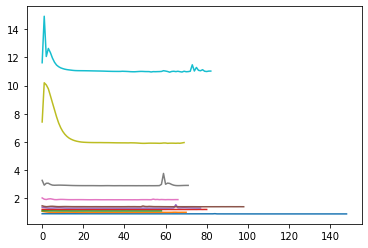

In [34]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses  =  train_gnumap(new_data, 32, 2, n_layers=1, target=None,
                                     model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                     norm = 'normalize', patience=20, epochs=500, lr=5e-1, wd=1e-2,
                                     min_dist=0.1, name_file="1", subsampling=None,
                                     spread = 1.0, repulsion_strength=repulsion_strength[i],
                                     device=None, verbose = False, normalized = True)
    out_tmp = model(new_data.x.float(), new_data.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

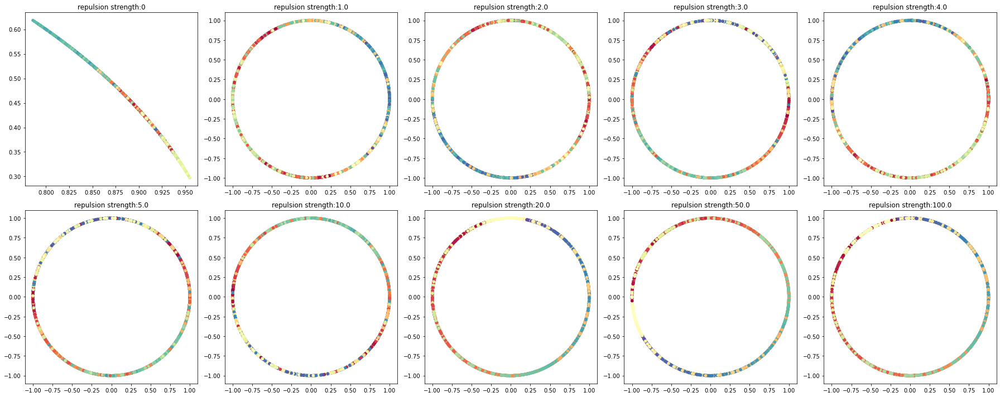

In [35]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

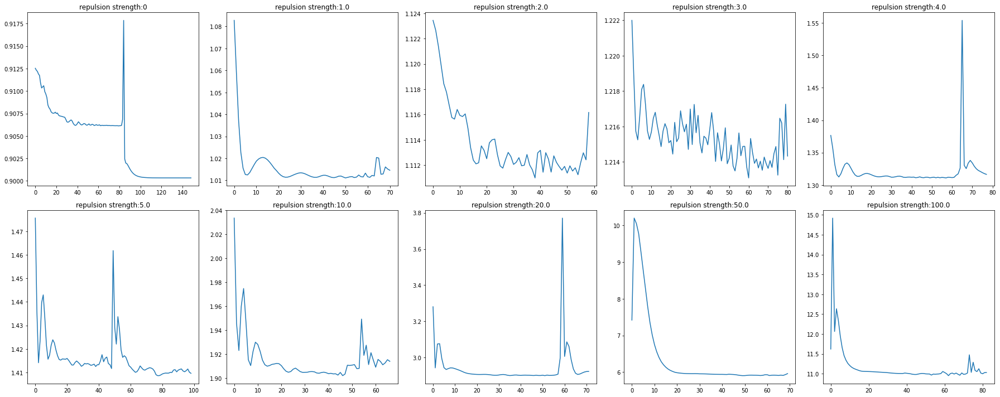

In [36]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7059, grad_fn=<NegBackward0>)
loss final tensor(3.7496, grad_fn=<AddBackward0>)
Epoch=000, loss=3.7496, time=0.0158
loss before neg tensor(0.7053, grad_fn=<NegBackward0>)
loss final tensor(3.7303, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7303, time=0.0149
loss before neg tensor(0.7050, grad_fn=<NegBackward0>)
loss final tensor(3.7223, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7223, time=0.0150
loss before neg tensor(0.7047, grad_fn=<NegBackward0>)
loss final tensor(3.7276, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7276, time=0.0169
loss before neg tensor(0.7042, grad_fn=<NegBackward0>)
loss final tensor(3.7332, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7332, time=0.0174
loss before neg tensor(0.7041, grad_fn=<NegBackward0>)
loss final tensor(3.7298, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7298, time=0.0142
loss before neg tensor(0.7038, grad_fn=<NegBackward0>)
loss final tensor(3.7223, grad_fn

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7042, grad_fn=<NegBackward0>)
loss final tensor(3.7298, grad_fn=<AddBackward0>)
Epoch=000, loss=3.7298, time=0.0151
loss before neg tensor(0.7043, grad_fn=<NegBackward0>)
loss final tensor(3.7221, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7221, time=0.0148
loss before neg tensor(0.7046, grad_fn=<NegBackward0>)
loss final tensor(3.7164, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7164, time=0.0146
loss before neg tensor(0.7045, grad_fn=<NegBackward0>)
loss final tensor(3.7184, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7184, time=0.0135
loss before neg tensor(0.7045, grad_fn=<NegBackward0>)
loss final tensor(3.7238, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7238, time=0.0142
loss before neg tensor(0.7047, grad_fn=<NegBackward0>)
loss final tensor(3.7221, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7221, time=0.0173
loss before neg tensor(0.7038, grad_fn=<NegBackward0>)
loss final tensor(3.7168, grad_fn

Epoch=057, loss=3.7111, time=0.0200
Early stopping at epoch 57!
Loading 37th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7056, grad_fn=<NegBackward0>)
loss final tensor(3.7664, grad_fn=<AddBackward0>)
Epoch=000, loss=3.7664, time=0.0199
loss before neg tensor(0.7050, grad_fn=<NegBackward0>)
loss final tensor(3.7485, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7485, time=0.0137
loss before neg tensor(0.7041, grad_fn=<NegBackward0>)
loss final tensor(3.7372, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7372, time=0.0136
loss before neg tensor(0.7048, grad_fn=<NegBackward0>)
loss final tensor(3.7456, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7456, time=0.0156
loss before neg tensor(0.7048, grad_fn=<NegBackward0>)
loss final tensor(3.7522, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7522, time=0.0145
loss before neg tensor(0.7026, grad_fn=<NegBackward0>)
loss final tensor(3.7561, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7561, time=0.0174
loss before neg tensor(0.7032, grad_fn=<NegBackward0>)
loss final tensor(3.7471, grad_fn

Epoch=057, loss=4.0139, time=0.0130
loss before neg tensor(0.6991, grad_fn=<NegBackward0>)
loss final tensor(3.9144, grad_fn=<AddBackward0>)
Epoch=058, loss=3.9144, time=0.0149
loss before neg tensor(0.6992, grad_fn=<NegBackward0>)
loss final tensor(3.8042, grad_fn=<AddBackward0>)
Epoch=059, loss=3.8042, time=0.0171
loss before neg tensor(0.6996, grad_fn=<NegBackward0>)
loss final tensor(3.7606, grad_fn=<AddBackward0>)
Epoch=060, loss=3.7606, time=0.0149
loss before neg tensor(0.7001, grad_fn=<NegBackward0>)
loss final tensor(3.7531, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7531, time=0.0123
loss before neg tensor(0.7006, grad_fn=<NegBackward0>)
loss final tensor(3.7577, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7577, time=0.0139
loss before neg tensor(0.7009, grad_fn=<NegBackward0>)
loss final tensor(3.7617, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7617, time=0.0190
loss before neg tensor(0.7011, grad_fn=<NegBackward0>)
loss final tensor(3.7607, grad_fn=<AddBackward0>)
Epoch=064, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7044, grad_fn=<NegBackward0>)
loss final tensor(3.8923, grad_fn=<AddBackward0>)
Epoch=000, loss=3.8923, time=0.0139
loss before neg tensor(0.7043, grad_fn=<NegBackward0>)
loss final tensor(3.7525, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7525, time=0.0161
loss before neg tensor(0.7032, grad_fn=<NegBackward0>)
loss final tensor(3.7378, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7378, time=0.0130
loss before neg tensor(0.7038, grad_fn=<NegBackward0>)
loss final tensor(3.7910, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7910, time=0.0169
loss before neg tensor(0.7045, grad_fn=<NegBackward0>)
loss final tensor(3.8086, grad_fn=<AddBackward0>)
Epoch=004, loss=3.8086, time=0.0136
loss before neg tensor(0.7042, grad_fn=<NegBackward0>)
loss final tensor(3.7766, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7766, time=0.0127
loss before neg tensor(0.7029, grad_fn=<NegBackward0>)
loss final tensor(3.7431, grad_fn

Epoch=059, loss=3.7413, time=0.0181
loss before neg tensor(0.7024, grad_fn=<NegBackward0>)
loss final tensor(3.7312, grad_fn=<AddBackward0>)
Epoch=060, loss=3.7312, time=0.0171
loss before neg tensor(0.7021, grad_fn=<NegBackward0>)
loss final tensor(3.7501, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7501, time=0.0139
loss before neg tensor(0.7015, grad_fn=<NegBackward0>)
loss final tensor(3.7385, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7385, time=0.0131
Early stopping at epoch 62!
Loading 42th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7050, grad_fn=<NegBackward0>)
loss final tensor(3.7886, grad_fn=<AddBackward0>)
Epoch=000, loss=3.7886, time=0.0141
loss before neg tensor(0.7045, grad_fn=<NegBackward0>)
loss final tensor(3.7543, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7543, time=0.0126
loss before neg tensor(0.7044, grad_fn=<NegBackward0>)
loss final tensor(3.7302, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7302, time=0.0133
loss before neg tensor(0.7046, grad_fn=<NegBackward0>)
loss final tensor(3.7326, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7326, time=0.0174
loss before neg tensor(0.7042, grad_fn=<NegBackward0>)
loss final tensor(3.7461, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7461, time=0.0138
loss before neg tensor(0.7036, grad_fn=<NegBackward0>)
loss final tensor(3.7517, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7517, time=0.0121
loss before neg tensor(0.7032, grad_fn=<NegBackward0>)
loss final tensor(3.7466, grad_fn

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7039, grad_fn=<NegBackward0>)
loss final tensor(3.8291, grad_fn=<AddBackward0>)
Epoch=000, loss=3.8291, time=0.0176
loss before neg tensor(0.7049, grad_fn=<NegBackward0>)
loss final tensor(3.7229, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7229, time=0.0130
loss before neg tensor(0.7045, grad_fn=<NegBackward0>)
loss final tensor(3.7768, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7768, time=0.0148
loss before neg tensor(0.7051, grad_fn=<NegBackward0>)
loss final tensor(3.7795, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7795, time=0.0196
loss before neg tensor(0.7045, grad_fn=<NegBackward0>)
loss final tensor(3.7424, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7424, time=0.0137
loss before neg tensor(0.7033, grad_fn=<NegBackward0>)
loss final tensor(3.7268, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7268, time=0.0148
loss before neg tensor(0.7035, grad_fn=<NegBackward0>)
loss final tensor(3.7280, grad_fn

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7067, grad_fn=<NegBackward0>)
loss final tensor(3.8918, grad_fn=<AddBackward0>)
Epoch=000, loss=3.8918, time=0.0169
loss before neg tensor(0.7043, grad_fn=<NegBackward0>)
loss final tensor(3.7275, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7275, time=0.0144
loss before neg tensor(0.7050, grad_fn=<NegBackward0>)
loss final tensor(3.7829, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7829, time=0.0127
loss before neg tensor(0.7049, grad_fn=<NegBackward0>)
loss final tensor(3.8201, grad_fn=<AddBackward0>)
Epoch=003, loss=3.8201, time=0.0178
loss before neg tensor(0.7052, grad_fn=<NegBackward0>)
loss final tensor(3.7857, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7857, time=0.0130
loss before neg tensor(0.7046, grad_fn=<NegBackward0>)
loss final tensor(3.7480, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7480, time=0.0163
loss before neg tensor(0.7044, grad_fn=<NegBackward0>)
loss final tensor(3.7322, grad_fn

Epoch=059, loss=3.7340, time=0.0128
loss before neg tensor(0.7051, grad_fn=<NegBackward0>)
loss final tensor(3.7545, grad_fn=<AddBackward0>)
Epoch=060, loss=3.7545, time=0.0177
loss before neg tensor(0.7040, grad_fn=<NegBackward0>)
loss final tensor(3.7440, grad_fn=<AddBackward0>)
Epoch=061, loss=3.7440, time=0.0299
loss before neg tensor(0.7027, grad_fn=<NegBackward0>)
loss final tensor(3.7174, grad_fn=<AddBackward0>)
Epoch=062, loss=3.7174, time=0.0166
loss before neg tensor(0.7021, grad_fn=<NegBackward0>)
loss final tensor(3.7217, grad_fn=<AddBackward0>)
Epoch=063, loss=3.7217, time=0.0148
loss before neg tensor(0.7018, grad_fn=<NegBackward0>)
loss final tensor(3.7283, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7283, time=0.0142
loss before neg tensor(0.7019, grad_fn=<NegBackward0>)
loss final tensor(3.7271, grad_fn=<AddBackward0>)
Epoch=065, loss=3.7271, time=0.0138
loss before neg tensor(0.7024, grad_fn=<NegBackward0>)
loss final tensor(3.7218, grad_fn=<AddBackward0>)
Epoch=066, lo

loss final tensor(3.7922, grad_fn=<AddBackward0>)
Epoch=118, loss=3.7922, time=0.0154
loss before neg tensor(0.7019, grad_fn=<NegBackward0>)
loss final tensor(3.7181, grad_fn=<AddBackward0>)
Epoch=119, loss=3.7181, time=0.0176
loss before neg tensor(0.7018, grad_fn=<NegBackward0>)
loss final tensor(3.7408, grad_fn=<AddBackward0>)
Epoch=120, loss=3.7408, time=0.0132
loss before neg tensor(0.7018, grad_fn=<NegBackward0>)
loss final tensor(3.7240, grad_fn=<AddBackward0>)
Epoch=121, loss=3.7240, time=0.0129
loss before neg tensor(0.7019, grad_fn=<NegBackward0>)
loss final tensor(3.7162, grad_fn=<AddBackward0>)
Epoch=122, loss=3.7162, time=0.0185
loss before neg tensor(0.7022, grad_fn=<NegBackward0>)
loss final tensor(3.7234, grad_fn=<AddBackward0>)
Epoch=123, loss=3.7234, time=0.0216
loss before neg tensor(0.7018, grad_fn=<NegBackward0>)
loss final tensor(3.7215, grad_fn=<AddBackward0>)
Epoch=124, loss=3.7215, time=0.0202
loss before neg tensor(0.7017, grad_fn=<NegBackward0>)
loss final te

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7099, grad_fn=<NegBackward0>)
loss final tensor(4.1481, grad_fn=<AddBackward0>)
Epoch=000, loss=4.1481, time=0.0168
loss before neg tensor(0.7024, grad_fn=<NegBackward0>)
loss final tensor(3.7432, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7432, time=0.0138
loss before neg tensor(0.7015, grad_fn=<NegBackward0>)
loss final tensor(3.7198, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7198, time=0.0141
loss before neg tensor(0.7020, grad_fn=<NegBackward0>)
loss final tensor(3.7965, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7965, time=0.0185
loss before neg tensor(0.7027, grad_fn=<NegBackward0>)
loss final tensor(3.8521, grad_fn=<AddBackward0>)
Epoch=004, loss=3.8521, time=0.0152
loss before neg tensor(0.7031, grad_fn=<NegBackward0>)
loss final tensor(3.8576, grad_fn=<AddBackward0>)
Epoch=005, loss=3.8576, time=0.0158
loss before neg tensor(0.7030, grad_fn=<NegBackward0>)
loss final tensor(3.8301, grad_fn

loss before neg tensor(0.7020, grad_fn=<NegBackward0>)
loss final tensor(3.7056, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7056, time=0.0166
loss before neg tensor(0.7021, grad_fn=<NegBackward0>)
loss final tensor(3.7064, grad_fn=<AddBackward0>)
Epoch=065, loss=3.7064, time=0.0176
Early stopping at epoch 65!
Loading 45th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7087, grad_fn=<NegBackward0>)
loss final tensor(4.5329, grad_fn=<AddBackward0>)
Epoch=000, loss=4.5329, time=0.0169
loss before neg tensor(0.7001, grad_fn=<NegBackward0>)
loss final tensor(3.7840, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7840, time=0.0146
loss before neg tensor(0.7012, grad_fn=<NegBackward0>)
loss final tensor(3.7767, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7767, time=0.0152
loss before neg tensor(0.7029, grad_fn=<NegBackward0>)
loss final tensor(3.8672, grad_fn=<AddBackward0>)
Epoch=003, loss=3.8672, time=0.0184
loss before neg tensor(0.7032, grad_fn=<NegBackward0>)
loss final tensor(3.8905, grad_fn=<AddBackward0>)
Epoch=004, loss=3.8905, time=0.0151
loss before neg tensor(0.7025, grad_fn=<NegBackward0>)
loss final tensor(3.8608, grad_fn=<AddBackward0>)
Epoch=005, loss=3.8608, time=0.0155
loss before neg tensor(0.7017, grad_fn=<NegBackward0>)
loss final tensor(3.8204, grad_fn

loss before neg tensor(0.7010, grad_fn=<NegBackward0>)
loss final tensor(3.7160, grad_fn=<AddBackward0>)
Epoch=064, loss=3.7160, time=0.0164
loss before neg tensor(0.7014, grad_fn=<NegBackward0>)
loss final tensor(3.7197, grad_fn=<AddBackward0>)
Epoch=065, loss=3.7197, time=0.0134
loss before neg tensor(0.7019, grad_fn=<NegBackward0>)
loss final tensor(3.7206, grad_fn=<AddBackward0>)
Epoch=066, loss=3.7206, time=0.0163
loss before neg tensor(0.7009, grad_fn=<NegBackward0>)
loss final tensor(3.7228, grad_fn=<AddBackward0>)
Epoch=067, loss=3.7228, time=0.0153
loss before neg tensor(0.7016, grad_fn=<NegBackward0>)
loss final tensor(3.7224, grad_fn=<AddBackward0>)
Epoch=068, loss=3.7224, time=0.0143
loss before neg tensor(0.7012, grad_fn=<NegBackward0>)
loss final tensor(3.7231, grad_fn=<AddBackward0>)
Epoch=069, loss=3.7231, time=0.0156
loss before neg tensor(0.7027, grad_fn=<NegBackward0>)
loss final tensor(3.7222, grad_fn=<AddBackward0>)
Epoch=070, loss=3.7222, time=0.0156
loss before n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.7046, grad_fn=<NegBackward0>)
loss final tensor(3.7793, grad_fn=<AddBackward0>)
Epoch=000, loss=3.7793, time=0.0154
loss before neg tensor(0.7054, grad_fn=<NegBackward0>)
loss final tensor(3.7326, grad_fn=<AddBackward0>)
Epoch=001, loss=3.7326, time=0.0147
loss before neg tensor(0.7042, grad_fn=<NegBackward0>)
loss final tensor(3.7220, grad_fn=<AddBackward0>)
Epoch=002, loss=3.7220, time=0.0167
loss before neg tensor(0.7042, grad_fn=<NegBackward0>)
loss final tensor(3.7469, grad_fn=<AddBackward0>)
Epoch=003, loss=3.7469, time=0.0160
loss before neg tensor(0.7046, grad_fn=<NegBackward0>)
loss final tensor(3.7495, grad_fn=<AddBackward0>)
Epoch=004, loss=3.7495, time=0.0130
loss before neg tensor(0.7038, grad_fn=<NegBackward0>)
loss final tensor(3.7312, grad_fn=<AddBackward0>)
Epoch=005, loss=3.7312, time=0.0145
loss before neg tensor(0.7050, grad_fn=<NegBackward0>)
loss final tensor(3.7227, grad_fn

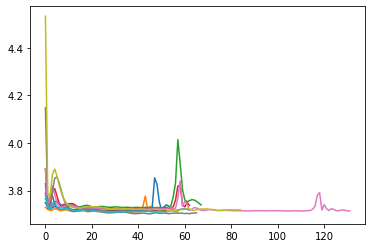

In [37]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses = train_gnumap(new_data_unweighted, 32, 2, n_layers=1, target=None,
                                  model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                  norm = 'normalize', patience=20, epochs=500, lr=5e-1, wd=1e-2,
                                  min_dist=0.1, name_file="1", subsampling=None,
                                  spread = 1.0, repulsion_strength=10.0,
                                  device=None, verbose = False, normalized = True )
    out_tmp = model(new_data_unweighted.x.float(), new_data_unweighted.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

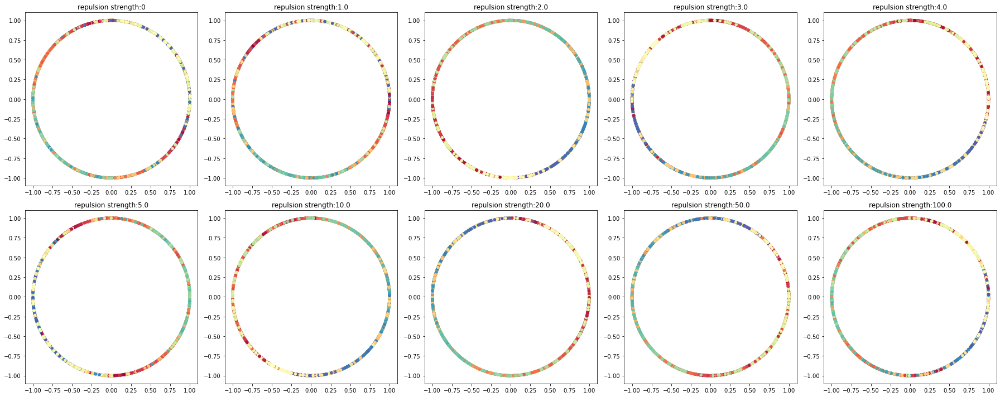

In [38]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

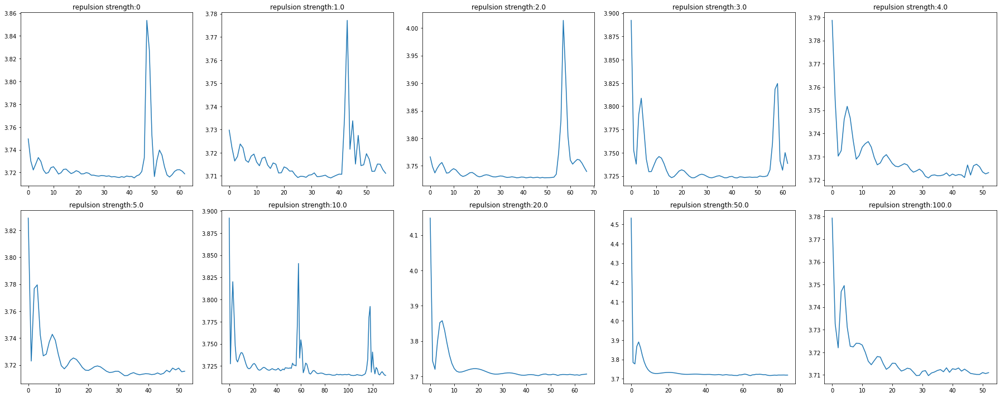

In [39]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

### GNN-col_uniform

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.9017, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9017, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=0.9017, time=0.0156
loss before neg tensor(0.9017, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9017, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.9017, time=0.0151
loss before neg tensor(0.9017, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9017, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.9017, time=0.0160
loss before neg tensor(0.9017, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9017, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.9017, time=0.0156
loss before neg tensor(0.9017, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9017, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=0.9017, time=0.0154
loss before neg ten

loss before neg tensor(0.9017, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9017, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=0.9017, time=0.0198
loss before neg tensor(0.9017, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9017, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=0.9017, time=0.0182
loss before neg tensor(0.9017, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9017, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=0.9017, time=0.0183
loss before neg tensor(0.9017, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9017, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=0.9017, time=0.0178
loss before neg tensor(0.9017, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9017, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=0.9017, time=0.0176
loss before neg tensor(0.9017, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=091, loss=0.9016, time=0.0175
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=0.9016, time=0.0186
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=0.9016, time=0.0159
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=0.9016, time=0.0153
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=0.9016, time=0.0156
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=0.9016, time=0.0152
loss before neg tensor(0.9016, dtype=torch.float6

Epoch=138, loss=0.9016, time=0.0163
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=139, loss=0.9016, time=0.0181
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=140, loss=0.9016, time=0.0162
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=141, loss=0.9016, time=0.0157
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=142, loss=0.9016, time=0.0156
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=143, loss=0.9016, time=0.0152
loss before neg tensor(0.9016, dtype=torch.float6

loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=187, loss=0.9016, time=0.0191
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=188, loss=0.9016, time=0.0160
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=189, loss=0.9016, time=0.0166
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=190, loss=0.9016, time=0.0167
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9016, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=191, loss=0.9016, time=0.0162
loss before neg tensor(0.9016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=233, loss=0.9015, time=0.0182
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=234, loss=0.9015, time=0.0196
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=235, loss=0.9015, time=0.0185
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=236, loss=0.9015, time=0.0183
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=237, loss=0.9015, time=0.0197
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=238, loss=0.9015, time=0.0185
loss before neg tensor(0.9015, dtype=torch.float6

Epoch=284, loss=0.9015, time=0.0195
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=285, loss=0.9015, time=0.0192
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=286, loss=0.9015, time=0.0175
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=287, loss=0.9015, time=0.0179
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=288, loss=0.9015, time=0.0180
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=289, loss=0.9015, time=0.0186
loss before neg tensor(0.9015, dtype=torch.float6

loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=336, loss=0.9015, time=0.0276
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=337, loss=0.9015, time=0.0227
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=338, loss=0.9015, time=0.0203
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=339, loss=0.9015, time=0.0472
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=340, loss=0.9015, time=0.0215
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=385, loss=0.9015, time=0.0219
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=386, loss=0.9015, time=0.0199
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=387, loss=0.9015, time=0.0180
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=388, loss=0.9015, time=0.0175
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=389, loss=0.9015, time=0.0180
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=437, loss=0.9015, time=0.0178
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=438, loss=0.9015, time=0.0170
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=439, loss=0.9015, time=0.0169
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=440, loss=0.9015, time=0.0169
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=441, loss=0.9015, time=0.0210
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=488, loss=0.9015, time=0.0242
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=489, loss=0.9015, time=0.0259
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=490, loss=0.9015, time=0.0169
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=491, loss=0.9015, time=0.0152
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=492, loss=0.9015, time=0.0153
loss before neg tensor(0.9015, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9015, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=493, loss=0.9015, time=0.0156
loss before neg tensor(0.9015, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6968, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3046, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.3046, time=0.0174
loss before neg tensor(0.6968, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3046, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.3046, time=0.0200
loss before neg tensor(0.6968, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3045, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.3045, time=0.0177
loss before neg tensor(0.6968, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3044, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.3044, time=0.0177
loss before neg tensor(0.6968, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3043, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.3043, time=0.0165
loss before neg ten

loss before neg tensor(0.6968, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2920, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=1.2920, time=0.0220
loss before neg tensor(0.6968, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2917, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=1.2917, time=0.0212
loss before neg tensor(0.6968, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2913, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.2913, time=0.0179
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2909, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.2909, time=0.0169
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2906, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.2906, time=0.0162
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=089, loss=1.2743, time=0.0194
loss before neg tensor(0.6970, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2744, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=090, loss=1.2744, time=0.0216
loss before neg tensor(0.6970, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2744, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=091, loss=1.2744, time=0.0185
loss before neg tensor(0.6970, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2745, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=1.2745, time=0.0169
loss before neg tensor(0.6970, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2745, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=1.2745, time=0.0175
loss before neg tensor(0.6970, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2745, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=1.2745, time=0.0189
loss before neg tensor(0.6970, dtype=torch.float6

loss before neg tensor(0.6970, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2715, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=135, loss=1.2715, time=0.0191
loss before neg tensor(0.6970, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2715, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=136, loss=1.2715, time=0.0177
loss before neg tensor(0.6970, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2714, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=137, loss=1.2714, time=0.0162
loss before neg tensor(0.6970, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2713, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=138, loss=1.2713, time=0.0152
loss before neg tensor(0.6970, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2713, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=139, loss=1.2713, time=0.0170
loss before neg tensor(0.6970, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=179, loss=1.2688, time=0.0179
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2687, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=180, loss=1.2687, time=0.0201
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2686, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=181, loss=1.2686, time=0.0163
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2686, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=182, loss=1.2686, time=0.0166
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2685, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=183, loss=1.2685, time=0.0166
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2684, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=184, loss=1.2684, time=0.0159
loss before neg tensor(0.6969, dtype=torch.float6

loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2652, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=234, loss=1.2652, time=0.0184
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2651, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=235, loss=1.2651, time=0.0193
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2651, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=236, loss=1.2651, time=0.0181
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2650, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=237, loss=1.2650, time=0.0175
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2649, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=238, loss=1.2649, time=0.0170
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2624, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=280, loss=1.2624, time=0.0203
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2623, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=281, loss=1.2623, time=0.0169
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2623, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=282, loss=1.2623, time=0.0150
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2622, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=283, loss=1.2622, time=0.0166
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2621, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=284, loss=1.2621, time=0.0156
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=324, loss=1.2601, time=0.0175
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2600, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=325, loss=1.2600, time=0.0176
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2600, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=326, loss=1.2600, time=0.0165
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2599, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=327, loss=1.2599, time=0.0171
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2599, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=328, loss=1.2599, time=0.0155
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2599, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=329, loss=1.2599, time=0.0155
loss before neg tensor(0.6969, dtype=torch.float6

Epoch=370, loss=1.2584, time=0.0180
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2584, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=371, loss=1.2584, time=0.0171
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2584, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=372, loss=1.2584, time=0.0171
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2583, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=373, loss=1.2583, time=0.0174
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2583, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=374, loss=1.2583, time=0.0170
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2583, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=375, loss=1.2583, time=0.0175
loss before neg tensor(0.6969, dtype=torch.float6

Epoch=424, loss=1.2570, time=0.0169
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2570, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=425, loss=1.2570, time=0.0171
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2570, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=426, loss=1.2570, time=0.0171
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2570, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=427, loss=1.2570, time=0.0225
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2570, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=428, loss=1.2570, time=0.0147
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2570, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=429, loss=1.2570, time=0.0174
loss before neg tensor(0.6969, dtype=torch.float6

loss final tensor(1.2566, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=476, loss=1.2566, time=0.0201
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2566, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=477, loss=1.2566, time=0.0237
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2566, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=478, loss=1.2566, time=0.0191
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2566, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=479, loss=1.2566, time=0.0176
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2566, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=480, loss=1.2566, time=0.0195
loss before neg tensor(0.6969, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2566, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=481, los

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.4929, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.8739, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.8739, time=0.0159
loss before neg tensor(0.4929, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.8739, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.8739, time=0.0191
loss before neg tensor(0.4929, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.8739, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.8739, time=0.0186
loss before neg tensor(0.4929, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.8738, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.8738, time=0.0186
loss before neg tensor(0.4929, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.8737, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.8737, time=0.0205
loss before neg ten

Epoch=045, loss=1.8059, time=0.0186
loss before neg tensor(0.4930, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.8028, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=1.8028, time=0.0184
loss before neg tensor(0.4928, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.7998, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=1.7998, time=0.0160
loss before neg tensor(0.4928, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.7967, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.7967, time=0.0179
loss before neg tensor(0.4927, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.7937, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.7937, time=0.0165
loss before neg tensor(0.4926, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.7908, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.7908, time=0.0175
loss before neg tensor(0.4926, dtype=torch.float6

Epoch=096, loss=1.6724, time=0.0172
loss before neg tensor(0.4925, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.6704, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=097, loss=1.6704, time=0.0197
loss before neg tensor(0.4925, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.6683, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=098, loss=1.6683, time=0.0162
loss before neg tensor(0.4925, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.6662, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=099, loss=1.6662, time=0.0190
loss before neg tensor(0.4925, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.6642, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=100, loss=1.6642, time=0.0180
loss before neg tensor(0.4925, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.6621, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=101, loss=1.6621, time=0.0164
loss before neg tensor(0.4926, dtype=torch.float6

loss before neg tensor(0.4931, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5962, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=142, loss=1.5962, time=0.0247
loss before neg tensor(0.4932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5944, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=143, loss=1.5944, time=0.0195
loss before neg tensor(0.4932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5924, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=144, loss=1.5924, time=0.0257
loss before neg tensor(0.4932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5904, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=145, loss=1.5904, time=0.0173
loss before neg tensor(0.4932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5882, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=146, loss=1.5882, time=0.0173
loss before neg tensor(0.4933, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.4940, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5502, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=187, loss=1.5502, time=0.0178
loss before neg tensor(0.4940, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5501, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=188, loss=1.5501, time=0.0188
loss before neg tensor(0.4940, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5499, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=189, loss=1.5499, time=0.0190
loss before neg tensor(0.4940, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5495, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=190, loss=1.5495, time=0.0181
loss before neg tensor(0.4940, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5490, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=191, loss=1.5490, time=0.0164
loss before neg tensor(0.4940, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=231, loss=1.5305, time=0.0166
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5300, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=232, loss=1.5300, time=0.0179
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5295, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=233, loss=1.5295, time=0.0175
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5291, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=234, loss=1.5291, time=0.0161
loss before neg tensor(0.4945, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5288, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=235, loss=1.5288, time=0.0193
loss before neg tensor(0.4945, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5285, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=236, loss=1.5285, time=0.0165
loss before neg tensor(0.4945, dtype=torch.float6

loss before neg tensor(0.4945, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5272, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=278, loss=1.5272, time=0.0193
loss before neg tensor(0.4945, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5272, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=279, loss=1.5272, time=0.0164
loss before neg tensor(0.4945, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5271, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=280, loss=1.5271, time=0.0173
loss before neg tensor(0.4945, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5272, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=281, loss=1.5272, time=0.0170
loss before neg tensor(0.4945, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5272, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=282, loss=1.5272, time=0.0167
loss before neg tensor(0.4945, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5269, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=326, loss=1.5269, time=0.0173
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5269, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=327, loss=1.5269, time=0.0191
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5268, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=328, loss=1.5268, time=0.0175
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5268, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=329, loss=1.5268, time=0.0164
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5268, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=330, loss=1.5268, time=0.0171
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=372, loss=1.5266, time=0.0189
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5266, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=373, loss=1.5266, time=0.0225
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5266, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=374, loss=1.5266, time=0.0194
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5266, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=375, loss=1.5266, time=0.0171
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5266, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=376, loss=1.5266, time=0.0168
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5266, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=377, loss=1.5266, time=0.0172
loss before neg tensor(0.4944, dtype=torch.float6

Epoch=417, loss=1.5264, time=0.0175
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5264, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=418, loss=1.5264, time=0.0182
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5264, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=419, loss=1.5264, time=0.0187
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5264, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=420, loss=1.5264, time=0.0164
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5263, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=421, loss=1.5263, time=0.0174
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5263, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=422, loss=1.5263, time=0.0172
loss before neg tensor(0.4944, dtype=torch.float6

Epoch=465, loss=1.5262, time=0.0181
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5262, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=466, loss=1.5262, time=0.0183
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5262, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=467, loss=1.5262, time=0.0179
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5262, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=468, loss=1.5262, time=0.0167
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5262, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=469, loss=1.5262, time=0.0166
loss before neg tensor(0.4944, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5262, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=470, loss=1.5262, time=0.0164
loss before neg tensor(0.4944, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.2879, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0986, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.0986, time=0.0195
loss before neg tensor(0.2879, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0985, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.0985, time=0.0181
loss before neg tensor(0.2879, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0983, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.0983, time=0.0172
loss before neg tensor(0.2879, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0980, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.0980, time=0.0184
loss before neg tensor(0.2879, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0977, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=2.0977, time=0.0174
loss before neg ten

loss before neg tensor(0.2881, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0674, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=2.0674, time=0.0178
loss before neg tensor(0.2881, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0667, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=2.0667, time=0.0183
loss before neg tensor(0.2881, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0660, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=2.0660, time=0.0178
loss before neg tensor(0.2881, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0653, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=2.0653, time=0.0173
loss before neg tensor(0.2882, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0646, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=2.0646, time=0.0163
loss before neg tensor(0.2882, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=092, loss=2.0351, time=0.0152
loss before neg tensor(0.2885, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0345, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=2.0345, time=0.0168
loss before neg tensor(0.2885, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0338, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=2.0338, time=0.0164
loss before neg tensor(0.2885, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0331, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=2.0331, time=0.0175
loss before neg tensor(0.2885, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0324, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=2.0324, time=0.0183
loss before neg tensor(0.2885, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0318, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=097, loss=2.0318, time=0.0156
loss before neg tensor(0.2885, dtype=torch.float6

Epoch=140, loss=2.0109, time=0.0184
loss before neg tensor(0.2888, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0104, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=141, loss=2.0104, time=0.0191
loss before neg tensor(0.2888, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0099, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=142, loss=2.0099, time=0.0180
loss before neg tensor(0.2888, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0094, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=143, loss=2.0094, time=0.0185
loss before neg tensor(0.2889, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0090, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=144, loss=2.0090, time=0.0183
loss before neg tensor(0.2889, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0085, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=145, loss=2.0085, time=0.0173
loss before neg tensor(0.2889, dtype=torch.float6

loss before neg tensor(0.2892, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9888, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=187, loss=1.9888, time=0.0193
loss before neg tensor(0.2892, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9884, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=188, loss=1.9884, time=0.0175
loss before neg tensor(0.2892, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9881, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=189, loss=1.9881, time=0.0175
loss before neg tensor(0.2892, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9877, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=190, loss=1.9877, time=0.0176
loss before neg tensor(0.2892, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9873, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=191, loss=1.9873, time=0.0174
loss before neg tensor(0.2892, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=233, loss=1.9674, time=0.0167
loss before neg tensor(0.2897, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9673, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=234, loss=1.9673, time=0.0170
loss before neg tensor(0.2897, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9672, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=235, loss=1.9672, time=0.0170
loss before neg tensor(0.2897, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9670, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=236, loss=1.9670, time=0.0178
loss before neg tensor(0.2897, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9667, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=237, loss=1.9667, time=0.0174
loss before neg tensor(0.2897, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9664, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=238, loss=1.9664, time=0.0160
loss before neg tensor(0.2897, dtype=torch.float6

loss before neg tensor(0.2898, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9590, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=281, loss=1.9590, time=0.0171
loss before neg tensor(0.2898, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9588, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=282, loss=1.9588, time=0.0160
loss before neg tensor(0.2898, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9587, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=283, loss=1.9587, time=0.0161
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9586, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=284, loss=1.9586, time=0.0176
loss before neg tensor(0.2898, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9586, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=285, loss=1.9586, time=0.0161
loss before neg tensor(0.2898, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9548, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=328, loss=1.9548, time=0.0175
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9547, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=329, loss=1.9547, time=0.0181
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9546, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=330, loss=1.9546, time=0.0184
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9545, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=331, loss=1.9545, time=0.0183
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9544, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=332, loss=1.9544, time=0.0199
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=376, loss=1.9509, time=0.0156
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9508, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=377, loss=1.9508, time=0.0132
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9508, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=378, loss=1.9508, time=0.0148
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9508, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=379, loss=1.9508, time=0.0126
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9506, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=380, loss=1.9506, time=0.0128
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9505, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=381, loss=1.9505, time=0.0138
loss before neg tensor(0.2899, dtype=torch.float6

Epoch=421, loss=1.9479, time=0.0141
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9479, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=422, loss=1.9479, time=0.0153
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9478, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=423, loss=1.9478, time=0.0134
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9477, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=424, loss=1.9477, time=0.0137
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9477, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=425, loss=1.9477, time=0.0132
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9476, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=426, loss=1.9476, time=0.0157
loss before neg tensor(0.2899, dtype=torch.float6

Epoch=469, loss=1.9459, time=0.0143
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9459, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=470, loss=1.9459, time=0.0127
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9459, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=471, loss=1.9459, time=0.0163
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9459, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=472, loss=1.9459, time=0.0138
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9458, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=473, loss=1.9458, time=0.0142
loss before neg tensor(0.2899, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9458, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=474, loss=1.9458, time=0.0135
loss before neg tensor(0.2899, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.0845, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.7769, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.7769, time=0.0139
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.7726, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.7726, time=0.0135
loss before neg tensor(0.0843, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.7647, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.7647, time=0.0129
loss before neg tensor(0.0842, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.7540, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.7540, time=0.0138
loss before neg tensor(0.0841, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.7412, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=2.7412, time=0.0152
loss before neg ten

Epoch=047, loss=2.3616, time=0.0141
loss before neg tensor(0.0836, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3596, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=2.3596, time=0.0151
loss before neg tensor(0.0836, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3576, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=2.3576, time=0.0131
loss before neg tensor(0.0836, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3556, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=2.3556, time=0.0152
loss before neg tensor(0.0836, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3535, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=2.3535, time=0.0142
loss before neg tensor(0.0836, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3534, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=2.3534, time=0.0162
loss before neg tensor(0.0836, dtype=torch.float6

Epoch=099, loss=2.2945, time=0.0129
loss before neg tensor(0.0837, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2936, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=100, loss=2.2936, time=0.0153
loss before neg tensor(0.0837, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2926, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=101, loss=2.2926, time=0.0127
loss before neg tensor(0.0837, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2916, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=102, loss=2.2916, time=0.0133
loss before neg tensor(0.0837, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2905, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=103, loss=2.2905, time=0.0132
loss before neg tensor(0.0837, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2894, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=104, loss=2.2894, time=0.0155
loss before neg tensor(0.0837, dtype=torch.float6

Epoch=145, loss=2.2294, time=0.0142
loss before neg tensor(0.0840, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2274, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=146, loss=2.2274, time=0.0144
loss before neg tensor(0.0840, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2254, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=147, loss=2.2254, time=0.0145
loss before neg tensor(0.0840, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2233, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=148, loss=2.2233, time=0.0159
loss before neg tensor(0.0840, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2212, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=149, loss=2.2212, time=0.0133
loss before neg tensor(0.0840, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2192, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=150, loss=2.2192, time=0.0132
loss before neg tensor(0.0841, dtype=torch.float6

Epoch=197, loss=2.1890, time=0.0154
loss before neg tensor(0.0842, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1888, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=198, loss=2.1888, time=0.0145
loss before neg tensor(0.0842, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1886, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=199, loss=2.1886, time=0.0129
loss before neg tensor(0.0842, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1882, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=200, loss=2.1882, time=0.0126
loss before neg tensor(0.0842, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1876, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=201, loss=2.1876, time=0.0154
loss before neg tensor(0.0842, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1870, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=202, loss=2.1870, time=0.0154
loss before neg tensor(0.0842, dtype=torch.float6

Epoch=244, loss=2.1735, time=0.0144
loss before neg tensor(0.0843, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1730, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=245, loss=2.1730, time=0.0159
loss before neg tensor(0.0843, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1730, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=246, loss=2.1730, time=0.0138
loss before neg tensor(0.0843, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1729, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=247, loss=2.1729, time=0.0137
loss before neg tensor(0.0843, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1726, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=248, loss=2.1726, time=0.0140
loss before neg tensor(0.0843, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1720, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=249, loss=2.1720, time=0.0145
loss before neg tensor(0.0843, dtype=torch.float6

Epoch=290, loss=2.1637, time=0.0214
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1636, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=291, loss=2.1636, time=0.0178
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1636, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=292, loss=2.1636, time=0.0185
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1634, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=293, loss=2.1634, time=0.0172
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1634, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=294, loss=2.1634, time=0.0155
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1633, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=295, loss=2.1633, time=0.0162
loss before neg tensor(0.0844, dtype=torch.float6

Epoch=338, loss=2.1593, time=0.0150
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1593, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=339, loss=2.1593, time=0.0144
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1592, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=340, loss=2.1592, time=0.0130
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1590, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=341, loss=2.1590, time=0.0136
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1589, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=342, loss=2.1589, time=0.0169
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1589, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=343, loss=2.1589, time=0.0154
loss before neg tensor(0.0844, dtype=torch.float6

loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1553, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=384, loss=2.1553, time=0.0149
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1552, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=385, loss=2.1552, time=0.0179
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1551, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=386, loss=2.1551, time=0.0125
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1550, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=387, loss=2.1550, time=0.0116
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1550, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=388, loss=2.1550, time=0.0156
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1526, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=429, loss=2.1526, time=0.0155
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1526, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=430, loss=2.1526, time=0.0164
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1525, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=431, loss=2.1525, time=0.0164
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1525, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=432, loss=2.1525, time=0.0149
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1525, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=433, loss=2.1525, time=0.0174
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1518, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=478, loss=2.1518, time=0.0298
loss before neg tensor(0.0845, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1517, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=479, loss=2.1517, time=0.0359
loss before neg tensor(0.0845, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1517, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=480, loss=2.1517, time=0.0300
loss before neg tensor(0.0845, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1517, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=481, loss=2.1517, time=0.0495
loss before neg tensor(0.0845, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1517, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=482, loss=2.1517, time=0.0275
loss before neg tensor(0.0845, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-0.1168, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9508, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.9508, time=0.0187
loss before neg tensor(-0.1167, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9421, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.9421, time=0.0186
loss before neg tensor(-0.1167, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9283, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.9283, time=0.0189
loss before neg tensor(-0.1165, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9091, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.9091, time=0.0169
loss before neg tensor(-0.1162, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.8849, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=2.8849, time=0.0208
loss before ne

loss final tensor(2.7144, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=2.7144, time=0.0196
loss before neg tensor(-0.1186, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.7119, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=2.7119, time=0.0197
loss before neg tensor(-0.1186, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.7079, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=2.7079, time=0.0160
loss before neg tensor(-0.1186, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.7030, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=2.7030, time=0.0160
loss before neg tensor(-0.1187, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.6997, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=2.6997, time=0.0172
loss before neg tensor(-0.1188, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.6975, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049

Epoch=089, loss=2.6513, time=0.0197
loss before neg tensor(-0.1198, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.6506, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=090, loss=2.6506, time=0.0187
loss before neg tensor(-0.1198, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.6499, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=091, loss=2.6499, time=0.0167
loss before neg tensor(-0.1199, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.6491, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=2.6491, time=0.0233
loss before neg tensor(-0.1199, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.6483, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=2.6483, time=0.0193
loss before neg tensor(-0.1199, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.6474, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=2.6474, time=0.0201
loss before neg tensor(-0.1199, dtype=torch.

Epoch=134, loss=2.6089, time=0.0182
loss before neg tensor(-0.1202, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.6080, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=135, loss=2.6080, time=0.0193
loss before neg tensor(-0.1202, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.6066, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=136, loss=2.6066, time=0.0166
loss before neg tensor(-0.1202, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.6060, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=137, loss=2.6060, time=0.0168
loss before neg tensor(-0.1202, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.6053, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=138, loss=2.6053, time=0.0163
loss before neg tensor(-0.1202, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.6044, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=139, loss=2.6044, time=0.0168
loss before neg tensor(-0.1202, dtype=torch.

loss before neg tensor(-0.1203, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.5703, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=180, loss=2.5703, time=0.0197
loss before neg tensor(-0.1203, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.5687, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=181, loss=2.5687, time=0.0172
loss before neg tensor(-0.1203, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.5678, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=182, loss=2.5678, time=0.0161
loss before neg tensor(-0.1203, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.5666, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=183, loss=2.5666, time=0.0160
loss before neg tensor(-0.1203, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.5656, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=184, loss=2.5656, time=0.0169
loss before neg tensor(-0.1203, dtype=torch.float64, grad_fn=<NegBackward0>)
los

loss before neg tensor(-0.1198, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.4948, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=226, loss=2.4948, time=0.0183
loss before neg tensor(-0.1198, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.4928, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=227, loss=2.4928, time=0.0197
loss before neg tensor(-0.1198, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.4906, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=228, loss=2.4906, time=0.0169
loss before neg tensor(-0.1198, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.4884, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=229, loss=2.4884, time=0.0162
loss before neg tensor(-0.1198, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.4862, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=230, loss=2.4862, time=0.0170
loss before neg tensor(-0.1197, dtype=torch.float64, grad_fn=<NegBackward0>)
los

loss before neg tensor(-0.1194, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.4532, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=279, loss=2.4532, time=0.0176
loss before neg tensor(-0.1194, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.4535, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=280, loss=2.4535, time=0.0175
loss before neg tensor(-0.1194, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.4534, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=281, loss=2.4534, time=0.0158
loss before neg tensor(-0.1194, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.4532, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=282, loss=2.4532, time=0.0127
loss before neg tensor(-0.1194, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.4533, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=283, loss=2.4533, time=0.0123
loss before neg tensor(-0.1194, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-1.1418, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.8192, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=4.8192, time=0.0180
loss before neg tensor(-1.1418, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.8121, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=4.8121, time=0.0163
loss before neg tensor(-1.1417, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.7978, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=4.7978, time=0.0179
loss before neg tensor(-1.1417, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.7753, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=4.7753, time=0.0147
loss before neg tensor(-1.1416, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.7423, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=4.7423, time=0.0158
loss before ne

Epoch=044, loss=4.1000, time=0.0134
loss before neg tensor(-1.1402, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0911, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=4.0911, time=0.0130
loss before neg tensor(-1.1401, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0810, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=4.0810, time=0.0175
loss before neg tensor(-1.1400, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0681, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=4.0681, time=0.0158
loss before neg tensor(-1.1399, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0551, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=4.0551, time=0.0141
loss before neg tensor(-1.1398, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0434, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=4.0434, time=0.0127
loss before neg tensor(-1.1397, dtype=torch.

loss before neg tensor(-1.1395, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0063, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=097, loss=4.0063, time=0.0165
loss before neg tensor(-1.1394, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0058, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=098, loss=4.0058, time=0.0164
loss before neg tensor(-1.1394, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0059, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=099, loss=4.0059, time=0.0152
loss before neg tensor(-1.1394, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0055, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=100, loss=4.0055, time=0.0147
loss before neg tensor(-1.1394, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0065, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=101, loss=4.0065, time=0.0146
loss before neg tensor(-1.1394, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-3.1816, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(8.2328, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=8.2328, time=0.0206
loss before neg tensor(-3.1815, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(8.2224, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=8.2224, time=0.0187
loss before neg tensor(-3.1814, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(8.2021, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=8.2021, time=0.0181
loss before neg tensor(-3.1812, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(8.1719, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=8.1719, time=0.0159
loss before neg tensor(-3.1811, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(8.1381, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=8.1381, time=0.0156
loss before ne

loss final tensor(7.4407, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=7.4407, time=0.0204
loss before neg tensor(-3.1783, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.4191, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=7.4191, time=0.0131
loss before neg tensor(-3.1782, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.3932, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=7.3932, time=0.0174
loss before neg tensor(-3.1785, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.4089, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=7.4089, time=0.0169
loss before neg tensor(-3.1785, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.4025, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=7.4025, time=0.0140
loss before neg tensor(-3.1783, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.3770, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049

loss before neg tensor(-3.1747, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.0974, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=7.0974, time=0.0158
loss before neg tensor(-3.1748, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.1024, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=7.1024, time=0.0195
loss before neg tensor(-3.1748, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.1063, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=7.1063, time=0.0157
loss before neg tensor(-3.1749, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.1103, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=097, loss=7.1103, time=0.0157
loss before neg tensor(-3.1748, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.1046, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=098, loss=7.1046, time=0.0163
loss before neg tensor(-3.1747, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-9.3126, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(20.1210, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=20.1210, time=0.0129
loss before neg tensor(-9.3121, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(19.9038, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=19.9038, time=0.0128
loss before neg tensor(-9.3108, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(19.4590, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=19.4590, time=0.0129
loss before neg tensor(-9.3081, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(18.7617, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=18.7617, time=0.0160
loss before neg tensor(-9.3062, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(18.2322, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=18.2322, time=0.0130
loss

Epoch=043, loss=16.5728, time=0.0155
loss before neg tensor(-9.3073, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.5567, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=16.5567, time=0.0155
loss before neg tensor(-9.3074, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.5575, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=16.5575, time=0.0166
loss before neg tensor(-9.3072, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.5324, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=16.5324, time=0.0148
loss before neg tensor(-9.3072, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.5212, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=16.5212, time=0.0162
loss before neg tensor(-9.3071, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.5163, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=16.5163, time=0.0167
loss before neg tensor(-9.3071, d

loss before neg tensor(-9.3071, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.4383, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=088, loss=16.4383, time=0.0199
loss before neg tensor(-9.3071, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.4369, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=089, loss=16.4369, time=0.0164
loss before neg tensor(-9.3073, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.4485, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=090, loss=16.4485, time=0.0167
loss before neg tensor(-9.3073, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.4453, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=091, loss=16.4453, time=0.0167
loss before neg tensor(-9.3072, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.4326, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=16.4326, time=0.0134
loss before neg tensor(-9.3073, dtype=torch.float64, grad_fn=<NegBackw

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-19.5235, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(39.3205, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=39.3205, time=0.0125
loss before neg tensor(-19.5247, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(38.7857, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=38.7857, time=0.0128
loss before neg tensor(-19.5289, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(38.0003, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=38.0003, time=0.0182
loss before neg tensor(-19.5326, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(37.1251, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=37.1251, time=0.0128
loss before neg tensor(-19.5323, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(35.9215, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=35.9215, time=0.0134

Epoch=043, loss=32.2643, time=0.0131
loss before neg tensor(-19.5116, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(32.2151, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=044, loss=32.2151, time=0.0139
loss before neg tensor(-19.5111, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(32.1286, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=045, loss=32.1286, time=0.0139
loss before neg tensor(-19.5109, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(32.0681, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=32.0681, time=0.0137
loss before neg tensor(-19.5110, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(32.0881, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=32.0881, time=0.0154
loss before neg tensor(-19.5110, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(32.1248, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=32.1248, time=0.0132
loss before neg tensor(-19.5

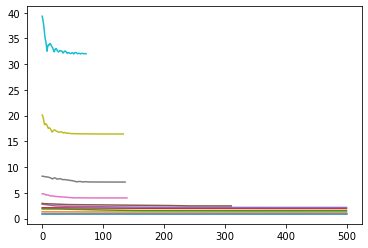

In [53]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses  =  train_gnumap(new_data, 32, 2, n_layers=1, target=None,
                                     model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                     norm = 'col_uniform', patience=20, epochs=500, lr=1e-2, wd=1e-2,
                                     min_dist=0.1, name_file="1", subsampling=None,
                                     spread = 1.0, repulsion_strength=repulsion_strength[i],
                                     device=None, verbose = False, normalized = True)
    out_tmp = model(new_data.x.float(), new_data.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

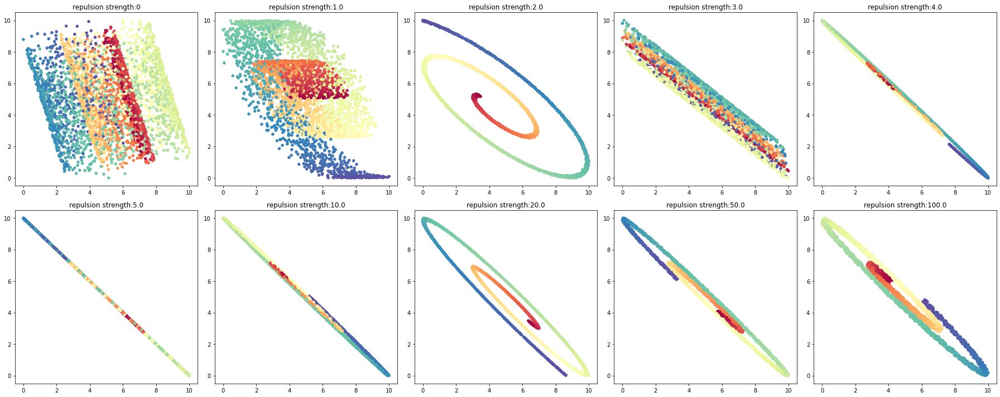

In [54]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

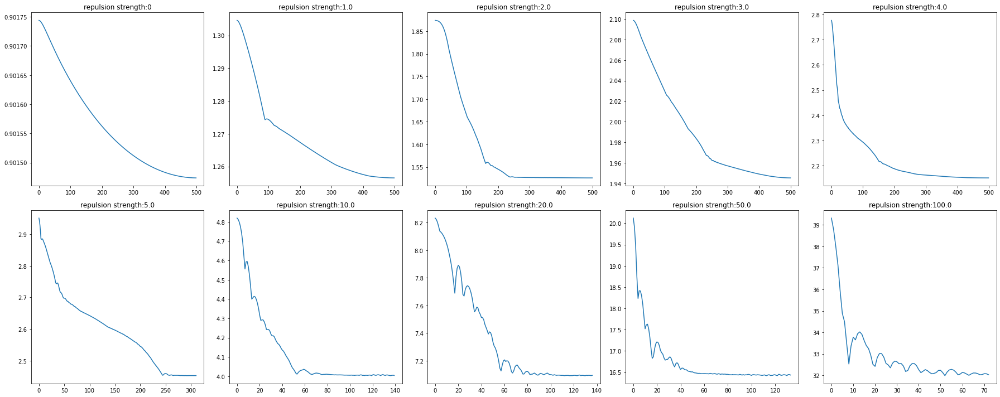

In [55]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3555, grad_fn=<AddBackward0>)
Epoch=000, loss=6.3555, time=0.0169
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3531, grad_fn=<AddBackward0>)
Epoch=001, loss=6.3531, time=0.0192
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3484, grad_fn=<AddBackward0>)
Epoch=002, loss=6.3484, time=0.0186
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3417, grad_fn=<AddBackward0>)
Epoch=003, loss=6.3417, time=0.0186
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3328, grad_fn=<AddBackward0>)
Epoch=004, loss=6.3328, time=0.0196
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3218, grad_fn=<AddBackward0>)
Epoch=005, loss=6.3218, time=0.0183
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3085, grad_fn

Epoch=070, loss=5.8273, time=0.0158
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8282, grad_fn=<AddBackward0>)
Epoch=071, loss=5.8282, time=0.0180
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8274, grad_fn=<AddBackward0>)
Epoch=072, loss=5.8274, time=0.0144
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8299, grad_fn=<AddBackward0>)
Epoch=073, loss=5.8299, time=0.0143
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8306, grad_fn=<AddBackward0>)
Epoch=074, loss=5.8306, time=0.0137
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8301, grad_fn=<AddBackward0>)
Epoch=075, loss=5.8301, time=0.0138
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8280, grad_fn=<AddBackward0>)
Epoch=076, loss=5.8280, time=0.0134
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8304, grad_fn=<AddBackward0>)
Epoch=077, lo

loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8267, grad_fn=<AddBackward0>)
Epoch=137, loss=5.8267, time=0.0146
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8269, grad_fn=<AddBackward0>)
Epoch=138, loss=5.8269, time=0.0161
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8257, grad_fn=<AddBackward0>)
Epoch=139, loss=5.8257, time=0.0135
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8251, grad_fn=<AddBackward0>)
Epoch=140, loss=5.8251, time=0.0143
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8271, grad_fn=<AddBackward0>)
Epoch=141, loss=5.8271, time=0.0139
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8275, grad_fn=<AddBackward0>)
Epoch=142, loss=5.8275, time=0.0142
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8271, grad_fn=<AddBackward0>)
Epoch=143, loss=5.8271, time=0.0128
loss before n

Epoch=206, loss=5.8241, time=0.0173
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8234, grad_fn=<AddBackward0>)
Epoch=207, loss=5.8234, time=0.0167
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8249, grad_fn=<AddBackward0>)
Epoch=208, loss=5.8249, time=0.0155
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8263, grad_fn=<AddBackward0>)
Epoch=209, loss=5.8263, time=0.0160
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8254, grad_fn=<AddBackward0>)
Epoch=210, loss=5.8254, time=0.0149
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8231, grad_fn=<AddBackward0>)
Epoch=211, loss=5.8231, time=0.0152
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8248, grad_fn=<AddBackward0>)
Epoch=212, loss=5.8248, time=0.0154
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8260, grad_fn=<AddBackward0>)
Epoch=213, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.8465, grad_fn=<AddBackward0>)
Epoch=000, loss=6.8465, time=0.0150
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.8431, grad_fn=<AddBackward0>)
Epoch=001, loss=6.8431, time=0.0151
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.8365, grad_fn=<AddBackward0>)
Epoch=002, loss=6.8365, time=0.0167
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.8274, grad_fn=<AddBackward0>)
Epoch=003, loss=6.8274, time=0.0134
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.8163, grad_fn=<AddBackward0>)
Epoch=004, loss=6.8163, time=0.0132
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.8033, grad_fn=<AddBackward0>)
Epoch=005, loss=6.8033, time=0.0168
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.7886, grad_fn

loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.2180, grad_fn=<AddBackward0>)
Epoch=059, loss=6.2180, time=0.0149
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.2140, grad_fn=<AddBackward0>)
Epoch=060, loss=6.2140, time=0.0161
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.2098, grad_fn=<AddBackward0>)
Epoch=061, loss=6.2098, time=0.0144
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.2043, grad_fn=<AddBackward0>)
Epoch=062, loss=6.2043, time=0.0144
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.1975, grad_fn=<AddBackward0>)
Epoch=063, loss=6.1975, time=0.0135
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.1947, grad_fn=<AddBackward0>)
Epoch=064, loss=6.1947, time=0.0135
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.1908, grad_fn=<AddBackward0>)
Epoch=065, loss=6.1908, time=0.0141
loss before n

Epoch=119, loss=6.0974, time=0.0144
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0980, grad_fn=<AddBackward0>)
Epoch=120, loss=6.0980, time=0.0153
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0979, grad_fn=<AddBackward0>)
Epoch=121, loss=6.0979, time=0.0153
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0964, grad_fn=<AddBackward0>)
Epoch=122, loss=6.0964, time=0.0133
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0956, grad_fn=<AddBackward0>)
Epoch=123, loss=6.0956, time=0.0135
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0959, grad_fn=<AddBackward0>)
Epoch=124, loss=6.0959, time=0.0165
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0981, grad_fn=<AddBackward0>)
Epoch=125, loss=6.0981, time=0.0133
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0984, grad_fn=<AddBackward0>)
Epoch=126, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.3837, grad_fn=<AddBackward0>)
Epoch=000, loss=7.3837, time=0.0167
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.3719, grad_fn=<AddBackward0>)
Epoch=001, loss=7.3719, time=0.0150
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.3488, grad_fn=<AddBackward0>)
Epoch=002, loss=7.3488, time=0.0127
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.3152, grad_fn=<AddBackward0>)
Epoch=003, loss=7.3152, time=0.0134
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.2712, grad_fn=<AddBackward0>)
Epoch=004, loss=7.2712, time=0.0139
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.2172, grad_fn=<AddBackward0>)
Epoch=005, loss=7.2172, time=0.0137
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.1534, grad_fn

Epoch=058, loss=5.9387, time=0.0147
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9325, grad_fn=<AddBackward0>)
Epoch=059, loss=5.9325, time=0.0137
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9287, grad_fn=<AddBackward0>)
Epoch=060, loss=5.9287, time=0.0178
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9288, grad_fn=<AddBackward0>)
Epoch=061, loss=5.9288, time=0.0149
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9300, grad_fn=<AddBackward0>)
Epoch=062, loss=5.9300, time=0.0140
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9301, grad_fn=<AddBackward0>)
Epoch=063, loss=5.9301, time=0.0143
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9293, grad_fn=<AddBackward0>)
Epoch=064, loss=5.9293, time=0.0167
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9290, grad_fn=<AddBackward0>)
Epoch=065, lo

loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8932, grad_fn=<AddBackward0>)
Epoch=118, loss=5.8932, time=0.0173
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8928, grad_fn=<AddBackward0>)
Epoch=119, loss=5.8928, time=0.0143
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8923, grad_fn=<AddBackward0>)
Epoch=120, loss=5.8923, time=0.0147
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8916, grad_fn=<AddBackward0>)
Epoch=121, loss=5.8916, time=0.0147
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8911, grad_fn=<AddBackward0>)
Epoch=122, loss=5.8911, time=0.0127
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8907, grad_fn=<AddBackward0>)
Epoch=123, loss=5.8907, time=0.0135
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8908, grad_fn=<AddBackward0>)
Epoch=124, loss=5.8908, time=0.0175
loss before n

loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8758, grad_fn=<AddBackward0>)
Epoch=182, loss=5.8758, time=0.0159
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8755, grad_fn=<AddBackward0>)
Epoch=183, loss=5.8755, time=0.0169
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8753, grad_fn=<AddBackward0>)
Epoch=184, loss=5.8753, time=0.0160
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8750, grad_fn=<AddBackward0>)
Epoch=185, loss=5.8750, time=0.0157
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8749, grad_fn=<AddBackward0>)
Epoch=186, loss=5.8749, time=0.0144
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8745, grad_fn=<AddBackward0>)
Epoch=187, loss=5.8745, time=0.0134
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8742, grad_fn=<AddBackward0>)
Epoch=188, loss=5.8742, time=0.0196
loss before n

Epoch=245, loss=5.8594, time=0.0142
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8590, grad_fn=<AddBackward0>)
Epoch=246, loss=5.8590, time=0.0155
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8592, grad_fn=<AddBackward0>)
Epoch=247, loss=5.8592, time=0.0140
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8591, grad_fn=<AddBackward0>)
Epoch=248, loss=5.8591, time=0.0166
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8591, grad_fn=<AddBackward0>)
Epoch=249, loss=5.8591, time=0.0204
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8590, grad_fn=<AddBackward0>)
Epoch=250, loss=5.8590, time=0.0175
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8591, grad_fn=<AddBackward0>)
Epoch=251, loss=5.8591, time=0.0178
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8589, grad_fn=<AddBackward0>)
Epoch=252, lo

loss final tensor(5.8564, grad_fn=<AddBackward0>)
Epoch=305, loss=5.8564, time=0.0149
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8562, grad_fn=<AddBackward0>)
Epoch=306, loss=5.8562, time=0.0173
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8563, grad_fn=<AddBackward0>)
Epoch=307, loss=5.8563, time=0.0132
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8564, grad_fn=<AddBackward0>)
Epoch=308, loss=5.8564, time=0.0128
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8564, grad_fn=<AddBackward0>)
Epoch=309, loss=5.8564, time=0.0125
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8563, grad_fn=<AddBackward0>)
Epoch=310, loss=5.8563, time=0.0135
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8562, grad_fn=<AddBackward0>)
Epoch=311, loss=5.8562, time=0.0134
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final te

Epoch=368, loss=5.8522, time=0.0145
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8520, grad_fn=<AddBackward0>)
Epoch=369, loss=5.8520, time=0.0163
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8518, grad_fn=<AddBackward0>)
Epoch=370, loss=5.8518, time=0.0141
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8515, grad_fn=<AddBackward0>)
Epoch=371, loss=5.8515, time=0.0153
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8516, grad_fn=<AddBackward0>)
Epoch=372, loss=5.8516, time=0.0151
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8516, grad_fn=<AddBackward0>)
Epoch=373, loss=5.8516, time=0.0134
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8514, grad_fn=<AddBackward0>)
Epoch=374, loss=5.8514, time=0.0152
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8515, grad_fn=<AddBackward0>)
Epoch=375, lo

Epoch=434, loss=5.8504, time=0.0147
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8505, grad_fn=<AddBackward0>)
Epoch=435, loss=5.8505, time=0.0160
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8503, grad_fn=<AddBackward0>)
Epoch=436, loss=5.8503, time=0.0148
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8502, grad_fn=<AddBackward0>)
Epoch=437, loss=5.8502, time=0.0125
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8502, grad_fn=<AddBackward0>)
Epoch=438, loss=5.8502, time=0.0144
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8502, grad_fn=<AddBackward0>)
Epoch=439, loss=5.8502, time=0.0145
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8502, grad_fn=<AddBackward0>)
Epoch=440, loss=5.8502, time=0.0147
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8502, grad_fn=<AddBackward0>)
Epoch=441, lo

loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8496, grad_fn=<AddBackward0>)
Epoch=498, loss=5.8496, time=0.0159
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8496, grad_fn=<AddBackward0>)
Epoch=499, loss=5.8496, time=0.0161
Loading 499th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.4488, grad_fn=<AddBackward0>)
Epoch=000, loss=6.4488, time=0.0151
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.4458, grad_fn=<AddBackward0>)
Epoch=001, loss=6.4458, time=0.0134
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.4399, grad_fn=<AddBackward0>)
Epoch=002, loss=6.4399, time=0.0140
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.4313, grad_fn=<AddBackward0>)
Epoch=003, loss=6.4313, time=0.0144
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.4199, grad_fn=<AddBackward0>)
Epoch=004, loss=6.4199, time=0.0160
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.4055, grad_fn=<AddBackward0>)
Epoch=005, loss=6.4055, time=0.0160
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3879, grad_fn

loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(5.8412, grad_fn=<AddBackward0>)
Epoch=058, loss=5.8412, time=0.0157
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(5.8411, grad_fn=<AddBackward0>)
Epoch=059, loss=5.8411, time=0.0156
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(5.8412, grad_fn=<AddBackward0>)
Epoch=060, loss=5.8412, time=0.0156
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(5.8410, grad_fn=<AddBackward0>)
Epoch=061, loss=5.8410, time=0.0127
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(5.8410, grad_fn=<AddBackward0>)
Epoch=062, loss=5.8410, time=0.0139
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(5.8409, grad_fn=<AddBackward0>)
Epoch=063, loss=5.8409, time=0.0151
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(5.8410, grad_fn=<AddBackward0>)
Epoch=064, loss=5.8410, time=0.0137
loss before n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.3198, grad_fn=<AddBackward0>)
Epoch=000, loss=6.3198, time=0.0175
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.3031, grad_fn=<AddBackward0>)
Epoch=001, loss=6.3031, time=0.0139
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.2712, grad_fn=<AddBackward0>)
Epoch=002, loss=6.2712, time=0.0191
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.2669, grad_fn=<AddBackward0>)
Epoch=003, loss=6.2669, time=0.0320
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.2699, grad_fn=<AddBackward0>)
Epoch=004, loss=6.2699, time=0.0555
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.2718, grad_fn=<AddBackward0>)
Epoch=005, loss=6.2718, time=0.0192
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.2677, grad_fn

Epoch=060, loss=5.9600, time=0.0241
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.9463, grad_fn=<AddBackward0>)
Epoch=061, loss=5.9463, time=0.0225
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.9290, grad_fn=<AddBackward0>)
Epoch=062, loss=5.9290, time=0.0154
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(5.9138, grad_fn=<AddBackward0>)
Epoch=063, loss=5.9138, time=0.0149
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(5.8952, grad_fn=<AddBackward0>)
Epoch=064, loss=5.8952, time=0.0163
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(5.8735, grad_fn=<AddBackward0>)
Epoch=065, loss=5.8735, time=0.0164
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(5.8586, grad_fn=<AddBackward0>)
Epoch=066, loss=5.8586, time=0.0137
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(5.8559, grad_fn=<AddBackward0>)
Epoch=067, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.9500, grad_fn=<AddBackward0>)
Epoch=000, loss=6.9500, time=0.0150
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.9470, grad_fn=<AddBackward0>)
Epoch=001, loss=6.9470, time=0.0151
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.9410, grad_fn=<AddBackward0>)
Epoch=002, loss=6.9410, time=0.0149
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.9322, grad_fn=<AddBackward0>)
Epoch=003, loss=6.9322, time=0.0156
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.9203, grad_fn=<AddBackward0>)
Epoch=004, loss=6.9203, time=0.0154
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.9045, grad_fn=<AddBackward0>)
Epoch=005, loss=6.9045, time=0.0142
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.8831, grad_fn

loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.1809, grad_fn=<AddBackward0>)
Epoch=058, loss=6.1809, time=0.0160
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.1783, grad_fn=<AddBackward0>)
Epoch=059, loss=6.1783, time=0.0133
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.1782, grad_fn=<AddBackward0>)
Epoch=060, loss=6.1782, time=0.0128
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.1756, grad_fn=<AddBackward0>)
Epoch=061, loss=6.1756, time=0.0140
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.1753, grad_fn=<AddBackward0>)
Epoch=062, loss=6.1753, time=0.0122
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.1726, grad_fn=<AddBackward0>)
Epoch=063, loss=6.1726, time=0.0127
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.1725, grad_fn=<AddBackward0>)
Epoch=064, loss=6.1725, time=0.0130
loss before n

loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.0047, grad_fn=<AddBackward0>)
Epoch=119, loss=6.0047, time=0.0152
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9990, grad_fn=<AddBackward0>)
Epoch=120, loss=5.9990, time=0.0142
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9921, grad_fn=<AddBackward0>)
Epoch=121, loss=5.9921, time=0.0141
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9857, grad_fn=<AddBackward0>)
Epoch=122, loss=5.9857, time=0.0136
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9789, grad_fn=<AddBackward0>)
Epoch=123, loss=5.9789, time=0.0144
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9716, grad_fn=<AddBackward0>)
Epoch=124, loss=5.9716, time=0.0149
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9636, grad_fn=<AddBackward0>)
Epoch=125, loss=5.9636, time=0.0142
loss before n

Epoch=180, loss=5.8525, time=0.0182
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8528, grad_fn=<AddBackward0>)
Epoch=181, loss=5.8528, time=0.0153
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8527, grad_fn=<AddBackward0>)
Epoch=182, loss=5.8527, time=0.0134
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8538, grad_fn=<AddBackward0>)
Epoch=183, loss=5.8538, time=0.0125
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8533, grad_fn=<AddBackward0>)
Epoch=184, loss=5.8533, time=0.0127
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8532, grad_fn=<AddBackward0>)
Epoch=185, loss=5.8532, time=0.0137
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8535, grad_fn=<AddBackward0>)
Epoch=186, loss=5.8535, time=0.0123
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8534, grad_fn=<AddBackward0>)
Epoch=187, lo

loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8492, grad_fn=<AddBackward0>)
Epoch=239, loss=5.8492, time=0.0162
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8484, grad_fn=<AddBackward0>)
Epoch=240, loss=5.8484, time=0.0130
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8485, grad_fn=<AddBackward0>)
Epoch=241, loss=5.8485, time=0.0135
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8486, grad_fn=<AddBackward0>)
Epoch=242, loss=5.8486, time=0.0132
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8493, grad_fn=<AddBackward0>)
Epoch=243, loss=5.8493, time=0.0125
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8497, grad_fn=<AddBackward0>)
Epoch=244, loss=5.8497, time=0.0127
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8493, grad_fn=<AddBackward0>)
Epoch=245, loss=5.8493, time=0.0128
loss before n

loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8470, grad_fn=<AddBackward0>)
Epoch=306, loss=5.8470, time=0.0154
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8468, grad_fn=<AddBackward0>)
Epoch=307, loss=5.8468, time=0.0141
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8460, grad_fn=<AddBackward0>)
Epoch=308, loss=5.8460, time=0.0126
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8462, grad_fn=<AddBackward0>)
Epoch=309, loss=5.8462, time=0.0128
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8471, grad_fn=<AddBackward0>)
Epoch=310, loss=5.8471, time=0.0128
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8473, grad_fn=<AddBackward0>)
Epoch=311, loss=5.8473, time=0.0125
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8475, grad_fn=<AddBackward0>)
Epoch=312, loss=5.8475, time=0.0164
loss before n

Epoch=364, loss=5.8444, time=0.0172
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8445, grad_fn=<AddBackward0>)
Epoch=365, loss=5.8445, time=0.0146
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8444, grad_fn=<AddBackward0>)
Epoch=366, loss=5.8444, time=0.0139
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8441, grad_fn=<AddBackward0>)
Epoch=367, loss=5.8441, time=0.0179
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8447, grad_fn=<AddBackward0>)
Epoch=368, loss=5.8447, time=0.0137
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8447, grad_fn=<AddBackward0>)
Epoch=369, loss=5.8447, time=0.0138
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8439, grad_fn=<AddBackward0>)
Epoch=370, loss=5.8439, time=0.0178
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8442, grad_fn=<AddBackward0>)
Epoch=371, lo

loss final tensor(5.8433, grad_fn=<AddBackward0>)
Epoch=426, loss=5.8433, time=0.0176
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8433, grad_fn=<AddBackward0>)
Epoch=427, loss=5.8433, time=0.0131
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8431, grad_fn=<AddBackward0>)
Epoch=428, loss=5.8431, time=0.0130
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8430, grad_fn=<AddBackward0>)
Epoch=429, loss=5.8430, time=0.0160
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8431, grad_fn=<AddBackward0>)
Epoch=430, loss=5.8431, time=0.0187
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8430, grad_fn=<AddBackward0>)
Epoch=431, loss=5.8430, time=0.0186
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8431, grad_fn=<AddBackward0>)
Epoch=432, loss=5.8431, time=0.0183
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final te

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.5397, grad_fn=<AddBackward0>)
Epoch=000, loss=6.5397, time=0.0135
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.5375, grad_fn=<AddBackward0>)
Epoch=001, loss=6.5375, time=0.0136
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.5334, grad_fn=<AddBackward0>)
Epoch=002, loss=6.5334, time=0.0127
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.5273, grad_fn=<AddBackward0>)
Epoch=003, loss=6.5273, time=0.0129
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.5196, grad_fn=<AddBackward0>)
Epoch=004, loss=6.5196, time=0.0127
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.5102, grad_fn=<AddBackward0>)
Epoch=005, loss=6.5102, time=0.0156
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.4991, grad_fn

loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.1011, grad_fn=<AddBackward0>)
Epoch=058, loss=6.1011, time=0.0164
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.1013, grad_fn=<AddBackward0>)
Epoch=059, loss=6.1013, time=0.0133
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.1001, grad_fn=<AddBackward0>)
Epoch=060, loss=6.1001, time=0.0131
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0993, grad_fn=<AddBackward0>)
Epoch=061, loss=6.0993, time=0.0141
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0994, grad_fn=<AddBackward0>)
Epoch=062, loss=6.0994, time=0.0135
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0990, grad_fn=<AddBackward0>)
Epoch=063, loss=6.0990, time=0.0163
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.1009, grad_fn=<AddBackward0>)
Epoch=064, loss=6.1009, time=0.0154
loss before n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.4664, grad_fn=<AddBackward0>)
Epoch=000, loss=6.4664, time=0.0162
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.4649, grad_fn=<AddBackward0>)
Epoch=001, loss=6.4649, time=0.0139
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.4619, grad_fn=<AddBackward0>)
Epoch=002, loss=6.4619, time=0.0127
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.4577, grad_fn=<AddBackward0>)
Epoch=003, loss=6.4577, time=0.0130
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.4524, grad_fn=<AddBackward0>)
Epoch=004, loss=6.4524, time=0.0137
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.4459, grad_fn=<AddBackward0>)
Epoch=005, loss=6.4459, time=0.0124
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.4389, grad_fn

Epoch=063, loss=6.1962, time=0.0141
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.1909, grad_fn=<AddBackward0>)
Epoch=064, loss=6.1909, time=0.0157
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.1825, grad_fn=<AddBackward0>)
Epoch=065, loss=6.1825, time=0.0141
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.1740, grad_fn=<AddBackward0>)
Epoch=066, loss=6.1740, time=0.0141
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.1672, grad_fn=<AddBackward0>)
Epoch=067, loss=6.1672, time=0.0144
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.1598, grad_fn=<AddBackward0>)
Epoch=068, loss=6.1598, time=0.0144
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.1517, grad_fn=<AddBackward0>)
Epoch=069, loss=6.1517, time=0.0144
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.1442, grad_fn=<AddBackward0>)
Epoch=070, lo

loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0938, grad_fn=<AddBackward0>)
Epoch=127, loss=6.0938, time=0.0157
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0926, grad_fn=<AddBackward0>)
Epoch=128, loss=6.0926, time=0.0160
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0919, grad_fn=<AddBackward0>)
Epoch=129, loss=6.0919, time=0.0158
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0935, grad_fn=<AddBackward0>)
Epoch=130, loss=6.0935, time=0.0156
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0930, grad_fn=<AddBackward0>)
Epoch=131, loss=6.0930, time=0.0143
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0930, grad_fn=<AddBackward0>)
Epoch=132, loss=6.0930, time=0.0145
loss before neg tensor(0.6957, grad_fn=<NegBackward0>)
loss final tensor(6.0941, grad_fn=<AddBackward0>)
Epoch=133, loss=6.0941, time=0.0146
loss before n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3408, grad_fn=<AddBackward0>)
Epoch=000, loss=6.3408, time=0.0145
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3314, grad_fn=<AddBackward0>)
Epoch=001, loss=6.3314, time=0.0150
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3124, grad_fn=<AddBackward0>)
Epoch=002, loss=6.3124, time=0.0137
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.2826, grad_fn=<AddBackward0>)
Epoch=003, loss=6.2826, time=0.0130
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.2398, grad_fn=<AddBackward0>)
Epoch=004, loss=6.2398, time=0.0126
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.1802, grad_fn=<AddBackward0>)
Epoch=005, loss=6.1802, time=0.0130
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.1831, grad_fn

loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8522, grad_fn=<AddBackward0>)
Epoch=065, loss=5.8522, time=0.0175
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8519, grad_fn=<AddBackward0>)
Epoch=066, loss=5.8519, time=0.0164
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8502, grad_fn=<AddBackward0>)
Epoch=067, loss=5.8502, time=0.0141
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8499, grad_fn=<AddBackward0>)
Epoch=068, loss=5.8499, time=0.0172
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8515, grad_fn=<AddBackward0>)
Epoch=069, loss=5.8515, time=0.0172
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8499, grad_fn=<AddBackward0>)
Epoch=070, loss=5.8499, time=0.0149
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8500, grad_fn=<AddBackward0>)
Epoch=071, loss=5.8500, time=0.0152
loss before n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(7.0722, grad_fn=<AddBackward0>)
Epoch=000, loss=7.0722, time=0.0126
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(7.0570, grad_fn=<AddBackward0>)
Epoch=001, loss=7.0570, time=0.0134
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(7.0276, grad_fn=<AddBackward0>)
Epoch=002, loss=7.0276, time=0.0140
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.9847, grad_fn=<AddBackward0>)
Epoch=003, loss=6.9847, time=0.0143
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.9285, grad_fn=<AddBackward0>)
Epoch=004, loss=6.9285, time=0.0133
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.8652, grad_fn=<AddBackward0>)
Epoch=005, loss=6.8652, time=0.0124
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.7946, grad_fn

loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.0809, grad_fn=<AddBackward0>)
Epoch=058, loss=6.0809, time=0.0154
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.0762, grad_fn=<AddBackward0>)
Epoch=059, loss=6.0762, time=0.0166
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.0686, grad_fn=<AddBackward0>)
Epoch=060, loss=6.0686, time=0.0155
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.0587, grad_fn=<AddBackward0>)
Epoch=061, loss=6.0587, time=0.0152
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.0481, grad_fn=<AddBackward0>)
Epoch=062, loss=6.0481, time=0.0155
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.0483, grad_fn=<AddBackward0>)
Epoch=063, loss=6.0483, time=0.0162
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.0444, grad_fn=<AddBackward0>)
Epoch=064, loss=6.0444, time=0.0128
loss before n

Epoch=122, loss=5.8270, time=0.0166
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8263, grad_fn=<AddBackward0>)
Epoch=123, loss=5.8263, time=0.0159
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8263, grad_fn=<AddBackward0>)
Epoch=124, loss=5.8263, time=0.0139
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8271, grad_fn=<AddBackward0>)
Epoch=125, loss=5.8271, time=0.0174
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8269, grad_fn=<AddBackward0>)
Epoch=126, loss=5.8269, time=0.0147
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8264, grad_fn=<AddBackward0>)
Epoch=127, loss=5.8264, time=0.0135
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8258, grad_fn=<AddBackward0>)
Epoch=128, loss=5.8258, time=0.0203
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8260, grad_fn=<AddBackward0>)
Epoch=129, lo

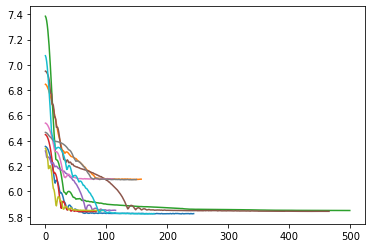

In [56]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses = train_gnumap(new_data_unweighted, 32, 2, n_layers=1, target=None,
                                  model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                  norm = 'col_uniform', patience=20, epochs=500, lr=1e-2, wd=1e-2,
                                  min_dist=0.1, name_file="1", subsampling=None,
                                  spread = 1.0, repulsion_strength=10.0,
                                  device=None, verbose = False, normalized = True )
    out_tmp = model(new_data_unweighted.x.float(), new_data_unweighted.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

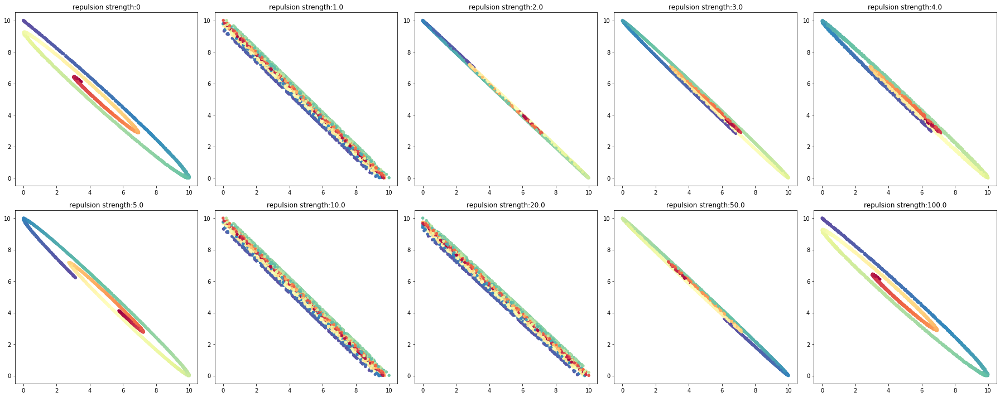

In [57]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

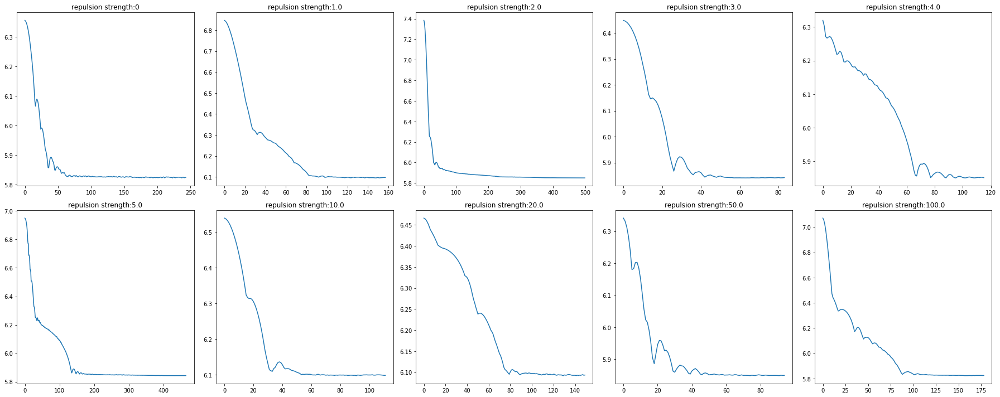

In [58]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

### GNN-uniform

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=0.9011, time=0.0169
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=0.9011, time=0.0148
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=0.9011, time=0.0170
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=0.9011, time=0.0165
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=0.9011, time=0.0172
loss before neg ten

Epoch=045, loss=0.9011, time=0.0146
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=0.9011, time=0.0248
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=0.9011, time=0.0145
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=0.9011, time=0.0168
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=0.9011, time=0.0148
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=0.9011, time=0.0125
loss before neg tensor(0.9011, dtype=torch.float6

Epoch=093, loss=0.9011, time=0.0131
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=0.9011, time=0.0138
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=0.9011, time=0.0130
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=0.9011, time=0.0139
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=097, loss=0.9011, time=0.0130
loss before neg tensor(0.9011, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=098, loss=0.9011, time=0.0132
loss before neg tensor(0.9011, dtype=torch.float6

Epoch=145, loss=0.9010, time=0.0140
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=146, loss=0.9010, time=0.0168
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=147, loss=0.9010, time=0.0197
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=148, loss=0.9010, time=0.0194
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=149, loss=0.9010, time=0.0150
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=150, loss=0.9010, time=0.0160
loss before neg tensor(0.9010, dtype=torch.float6

Epoch=193, loss=0.9010, time=0.0164
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=194, loss=0.9010, time=0.0145
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=195, loss=0.9010, time=0.0119
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=196, loss=0.9010, time=0.0129
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=197, loss=0.9010, time=0.0122
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=198, loss=0.9010, time=0.0128
loss before neg tensor(0.9010, dtype=torch.float6

Epoch=249, loss=0.9010, time=0.0145
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=250, loss=0.9010, time=0.0148
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=251, loss=0.9010, time=0.0191
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=252, loss=0.9010, time=0.0131
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=253, loss=0.9010, time=0.0134
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=254, loss=0.9010, time=0.0159
loss before neg tensor(0.9010, dtype=torch.float6

loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=300, loss=0.9010, time=0.0171
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=301, loss=0.9010, time=0.0138
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=302, loss=0.9010, time=0.0130
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=303, loss=0.9010, time=0.0130
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=304, loss=0.9010, time=0.0140
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=351, loss=0.9010, time=0.0171
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=352, loss=0.9010, time=0.0146
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=353, loss=0.9010, time=0.0153
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=354, loss=0.9010, time=0.0145
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=355, loss=0.9010, time=0.0152
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=405, loss=0.9010, time=0.0166
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=406, loss=0.9010, time=0.0129
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=407, loss=0.9010, time=0.0130
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=408, loss=0.9010, time=0.0130
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=409, loss=0.9010, time=0.0128
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=459, loss=0.9010, time=0.0165
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=460, loss=0.9010, time=0.0193
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=461, loss=0.9010, time=0.0151
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=462, loss=0.9010, time=0.0166
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=463, loss=0.9010, time=0.0168
loss before neg tensor(0.9010, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(0.9010, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=464, loss=0.9010, time=0.0142
loss before neg tensor(0.9010, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6963, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3301, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.3301, time=0.0149
loss before neg tensor(0.6963, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3297, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.3297, time=0.0170
loss before neg tensor(0.6964, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3290, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.3290, time=0.0172
loss before neg tensor(0.6964, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3279, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.3279, time=0.0167
loss before neg tensor(0.6964, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.3265, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.3265, time=0.0170
loss before neg ten

Epoch=051, loss=1.2393, time=0.0166
loss before neg tensor(0.6975, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2382, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=1.2382, time=0.0202
loss before neg tensor(0.6975, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2375, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=053, loss=1.2375, time=0.0185
loss before neg tensor(0.6976, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2362, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=054, loss=1.2362, time=0.0175
loss before neg tensor(0.6976, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2343, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=055, loss=1.2343, time=0.0161
loss before neg tensor(0.6976, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2338, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=056, loss=1.2338, time=0.0149
loss before neg tensor(0.6976, dtype=torch.float6

Epoch=101, loss=1.2232, time=0.0188
loss before neg tensor(0.6975, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2233, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=102, loss=1.2233, time=0.0165
loss before neg tensor(0.6975, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2232, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=103, loss=1.2232, time=0.0185
loss before neg tensor(0.6975, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2230, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=104, loss=1.2230, time=0.0159
loss before neg tensor(0.6975, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2229, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=105, loss=1.2229, time=0.0155
loss before neg tensor(0.6975, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2226, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=106, loss=1.2226, time=0.0169
loss before neg tensor(0.6975, dtype=torch.float6

Epoch=152, loss=1.2197, time=0.0215
loss before neg tensor(0.6974, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2197, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=153, loss=1.2197, time=0.0174
loss before neg tensor(0.6974, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2195, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=154, loss=1.2195, time=0.0255
loss before neg tensor(0.6974, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2195, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=155, loss=1.2195, time=0.0161
loss before neg tensor(0.6974, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2193, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=156, loss=1.2193, time=0.0157
loss before neg tensor(0.6973, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2195, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=157, loss=1.2195, time=0.0158
loss before neg tensor(0.6973, dtype=torch.float6

Epoch=203, loss=1.2178, time=0.0161
loss before neg tensor(0.6973, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2175, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=204, loss=1.2175, time=0.0166
loss before neg tensor(0.6973, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2175, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=205, loss=1.2175, time=0.0159
loss before neg tensor(0.6973, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2174, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=206, loss=1.2174, time=0.0150
loss before neg tensor(0.6973, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2174, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=207, loss=1.2174, time=0.0150
loss before neg tensor(0.6973, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2175, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=208, loss=1.2175, time=0.0138
loss before neg tensor(0.6973, dtype=torch.float6

Epoch=258, loss=1.2168, time=0.0148
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2170, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=259, loss=1.2170, time=0.0155
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2170, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=260, loss=1.2170, time=0.0145
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2168, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=261, loss=1.2168, time=0.0149
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2166, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=262, loss=1.2166, time=0.0155
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2168, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=263, loss=1.2168, time=0.0141
loss before neg tensor(0.6972, dtype=torch.float6

loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2162, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=308, loss=1.2162, time=0.0154
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2162, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=309, loss=1.2162, time=0.0176
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2162, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=310, loss=1.2162, time=0.0172
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2161, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=311, loss=1.2161, time=0.0176
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2161, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=312, loss=1.2161, time=0.0163
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2158, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=364, loss=1.2158, time=0.0193
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2158, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=365, loss=1.2158, time=0.0153
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2158, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=366, loss=1.2158, time=0.0130
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2158, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=367, loss=1.2158, time=0.0152
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2158, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=368, loss=1.2158, time=0.0161
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2155, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=422, loss=1.2155, time=0.0159
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2155, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=423, loss=1.2155, time=0.0149
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2154, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=424, loss=1.2154, time=0.0122
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2155, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=425, loss=1.2155, time=0.0128
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2155, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=426, loss=1.2155, time=0.0118
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

Epoch=466, loss=1.2152, time=0.0125
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2152, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=467, loss=1.2152, time=0.0156
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2152, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=468, loss=1.2152, time=0.0143
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2152, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=469, loss=1.2152, time=0.0128
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2152, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=470, loss=1.2152, time=0.0123
loss before neg tensor(0.6972, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.2152, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=471, loss=1.2152, time=0.0118
loss before neg tensor(0.6972, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.4925, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5913, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=1.5913, time=0.0141
loss before neg tensor(0.4925, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5909, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=1.5909, time=0.0119
loss before neg tensor(0.4925, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5902, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=1.5902, time=0.0133
loss before neg tensor(0.4925, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5891, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=1.5891, time=0.0149
loss before neg tensor(0.4925, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5877, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=1.5877, time=0.0140
loss before neg ten

Epoch=047, loss=1.5427, time=0.0153
loss before neg tensor(0.4931, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5436, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=1.5436, time=0.0157
loss before neg tensor(0.4931, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5441, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=1.5441, time=0.0127
loss before neg tensor(0.4931, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5442, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=1.5442, time=0.0150
loss before neg tensor(0.4931, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5437, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=1.5437, time=0.0146
loss before neg tensor(0.4931, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5427, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=1.5427, time=0.0126
loss before neg tensor(0.4931, dtype=torch.float6

Epoch=103, loss=1.5398, time=0.0143
loss before neg tensor(0.4932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5400, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=104, loss=1.5400, time=0.0145
loss before neg tensor(0.4932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5399, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=105, loss=1.5399, time=0.0182
loss before neg tensor(0.4932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5399, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=106, loss=1.5399, time=0.0153
loss before neg tensor(0.4932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5399, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=107, loss=1.5399, time=0.0151
loss before neg tensor(0.4932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5397, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=108, loss=1.5397, time=0.0159
loss before neg tensor(0.4932, dtype=torch.float6

Epoch=148, loss=1.5383, time=0.0142
loss before neg tensor(0.4932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5383, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=149, loss=1.5383, time=0.0143
loss before neg tensor(0.4932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5385, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=150, loss=1.5385, time=0.0168
loss before neg tensor(0.4932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5384, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=151, loss=1.5384, time=0.0137
loss before neg tensor(0.4932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5389, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=152, loss=1.5389, time=0.0149
loss before neg tensor(0.4932, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.5390, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=153, loss=1.5390, time=0.0148
loss before neg tensor(0.4932, dtype=torch.float6

Epoch=202, loss=1.5378, time=0.0146
Early stopping at epoch 202!
Loading 182th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.2870, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2265, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.2265, time=0.0133
loss before neg tensor(0.2870, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2263, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.2263, time=0.0148
loss before neg tensor(0.2870, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2258, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.2258, time=0.0127
loss before neg tensor(0.2870, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2251, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.2251, time=0.0128
loss before neg tensor(0.2870, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2242, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=2.2242, time=0.0148
loss before neg ten

Epoch=047, loss=2.0966, time=0.0132
loss before neg tensor(0.2878, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0909, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=2.0909, time=0.0152
loss before neg tensor(0.2879, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0850, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=2.0850, time=0.0140
loss before neg tensor(0.2880, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0788, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=2.0788, time=0.0129
loss before neg tensor(0.2880, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0723, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=2.0723, time=0.0137
loss before neg tensor(0.2881, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.0654, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=2.0654, time=0.0149
loss before neg tensor(0.2882, dtype=torch.float6

Epoch=095, loss=1.9285, time=0.0152
loss before neg tensor(0.2900, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9271, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=1.9271, time=0.0137
loss before neg tensor(0.2900, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9263, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=097, loss=1.9263, time=0.0136
loss before neg tensor(0.2901, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9242, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=098, loss=1.9242, time=0.0179
loss before neg tensor(0.2901, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9242, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=099, loss=1.9242, time=0.0135
loss before neg tensor(0.2901, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(1.9233, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=100, loss=1.9233, time=0.0139
loss before neg tensor(0.2901, dtype=torch.float6

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.0843, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3792, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.3792, time=0.0147
loss before neg tensor(0.0843, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3780, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.3780, time=0.0131
loss before neg tensor(0.0843, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3756, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.3756, time=0.0138
loss before neg tensor(0.0843, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3722, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.3722, time=0.0135
loss before neg tensor(0.0844, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3703, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=2.3703, time=0.0147
loss before neg ten

loss before neg tensor(0.0847, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3057, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=2.3057, time=0.0166
loss before neg tensor(0.0848, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3006, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=2.3006, time=0.0150
loss before neg tensor(0.0847, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3014, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=2.3014, time=0.0138
loss before neg tensor(0.0847, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3045, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=2.3045, time=0.0141
loss before neg tensor(0.0846, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.3068, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=2.3068, time=0.0137
loss before neg tensor(0.0846, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.0846, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2719, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=2.2719, time=0.0166
loss before neg tensor(0.0846, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2711, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=2.2711, time=0.0138
loss before neg tensor(0.0846, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2707, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=2.2707, time=0.0158
loss before neg tensor(0.0846, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2695, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=2.2695, time=0.0148
loss before neg tensor(0.0846, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2684, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=097, loss=2.2684, time=0.0139
loss before neg tensor(0.0846, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.0847, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2306, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=138, loss=2.2306, time=0.0171
loss before neg tensor(0.0847, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2297, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=139, loss=2.2297, time=0.0149
loss before neg tensor(0.0847, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2292, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=140, loss=2.2292, time=0.0159
loss before neg tensor(0.0847, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2276, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=141, loss=2.2276, time=0.0155
loss before neg tensor(0.0847, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.2248, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=142, loss=2.2248, time=0.0139
loss before neg tensor(0.0847, dtype=torch.float64, grad_fn=<NegBackward0>)
loss fina

loss before neg tensor(0.0850, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1863, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=190, loss=2.1863, time=0.0156
loss before neg tensor(0.0850, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.1857, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=191, loss=2.1857, time=0.0142
Early stopping at epoch 191!
Loading 171th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-0.1213, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9423, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=2.9423, time=0.0152
loss before neg tensor(-0.1213, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9397, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=2.9397, time=0.0155
loss before neg tensor(-0.1213, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9346, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=2.9346, time=0.0133
loss before neg tensor(-0.1212, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9273, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=2.9273, time=0.0133
loss before neg tensor(-0.1212, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.9176, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=2.9176, time=0.0143
loss before ne

loss before neg tensor(-0.1181, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.5103, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=2.5103, time=0.0149
loss before neg tensor(-0.1181, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.5048, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=2.5048, time=0.0124
loss before neg tensor(-0.1179, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.4949, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=2.4949, time=0.0133
loss before neg tensor(-0.1177, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.4809, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=2.4809, time=0.0125
loss before neg tensor(-0.1177, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(2.4794, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=2.4794, time=0.0134
loss before neg tensor(-0.1177, dtype=torch.float64, grad_fn=<NegBackward0>)
los

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-1.1435, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.7011, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=4.7011, time=0.0175
loss before neg tensor(-1.1435, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.6882, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=4.6882, time=0.0193
loss before neg tensor(-1.1434, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.6656, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=4.6656, time=0.0212
loss before neg tensor(-1.1432, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.6324, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=4.6324, time=0.0142
loss before neg tensor(-1.1432, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.6244, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=4.6244, time=0.0157
loss before ne

Epoch=047, loss=4.1114, time=0.0150
loss before neg tensor(-1.1406, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.1093, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=4.1093, time=0.0158
loss before neg tensor(-1.1405, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0959, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=4.0959, time=0.0136
loss before neg tensor(-1.1403, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0750, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=4.0750, time=0.0143
loss before neg tensor(-1.1403, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0717, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=4.0717, time=0.0143
loss before neg tensor(-1.1402, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0640, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=052, loss=4.0640, time=0.0144
loss before neg tensor(-1.1402, dtype=torch.

Epoch=100, loss=4.0568, time=0.0133
loss before neg tensor(-1.1403, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0535, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=101, loss=4.0535, time=0.0146
loss before neg tensor(-1.1403, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0522, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=102, loss=4.0522, time=0.0132
loss before neg tensor(-1.1403, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0506, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=103, loss=4.0506, time=0.0152
loss before neg tensor(-1.1403, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0548, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=104, loss=4.0548, time=0.0124
loss before neg tensor(-1.1403, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0557, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=105, loss=4.0557, time=0.0123
loss before neg tensor(-1.1403, dtype=torch.

Epoch=146, loss=4.0325, time=0.0156
loss before neg tensor(-1.1404, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0304, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=147, loss=4.0304, time=0.0151
loss before neg tensor(-1.1404, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0289, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=148, loss=4.0289, time=0.0129
loss before neg tensor(-1.1405, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0292, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=149, loss=4.0292, time=0.0122
loss before neg tensor(-1.1404, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0237, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=150, loss=4.0237, time=0.0121
loss before neg tensor(-1.1404, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0215, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=151, loss=4.0215, time=0.0123
loss before neg tensor(-1.1404, dtype=torch.

Epoch=194, loss=4.0242, time=0.0126
loss before neg tensor(-1.1405, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0283, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=195, loss=4.0283, time=0.0145
loss before neg tensor(-1.1406, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0315, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=196, loss=4.0315, time=0.0172
loss before neg tensor(-1.1406, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0331, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=197, loss=4.0331, time=0.0120
loss before neg tensor(-1.1405, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0245, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=198, loss=4.0245, time=0.0120
loss before neg tensor(-1.1404, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(4.0139, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=199, loss=4.0139, time=0.0118
loss before neg tensor(-1.1405, dtype=torch.

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-3.1873, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(8.6052, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=8.6052, time=0.0132
loss before neg tensor(-3.1873, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(8.5866, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=8.5866, time=0.0121
loss before neg tensor(-3.1871, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(8.5504, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=8.5504, time=0.0120
loss before neg tensor(-3.1869, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(8.4966, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=8.4966, time=0.0129
loss before neg tensor(-3.1866, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(8.4245, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=8.4245, time=0.0140
loss before ne

Epoch=045, loss=7.2062, time=0.0133
loss before neg tensor(-3.1792, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.2278, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=7.2278, time=0.0133
loss before neg tensor(-3.1792, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.2289, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=7.2289, time=0.0132
loss before neg tensor(-3.1789, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.1976, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=7.1976, time=0.0124
loss before neg tensor(-3.1787, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.1817, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=7.1817, time=0.0140
loss before neg tensor(-3.1787, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(7.1818, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=7.1818, time=0.0147
loss before neg tensor(-3.1786, dtype=torch.

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-9.3250, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(24.7526, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=24.7526, time=0.0137
loss before neg tensor(-9.3250, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(24.7147, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=24.7147, time=0.0130
loss before neg tensor(-9.3252, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(24.6431, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=24.6431, time=0.0142
loss before neg tensor(-9.3254, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(24.5422, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=24.5422, time=0.0142
loss before neg tensor(-9.3256, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(24.4170, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=24.4170, time=0.0126
loss

loss before neg tensor(-9.2956, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.8404, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=046, loss=16.8404, time=0.0158
loss before neg tensor(-9.2945, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.7216, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=16.7216, time=0.0149
loss before neg tensor(-9.2945, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.7335, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=16.7335, time=0.0135
loss before neg tensor(-9.2952, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.8054, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=16.8054, time=0.0125
loss before neg tensor(-9.2951, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.7898, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=16.7898, time=0.0120
loss before neg tensor(-9.2942, dtype=torch.float64, grad_fn=<NegBackw

loss before neg tensor(-9.2910, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.4278, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=092, loss=16.4278, time=0.0186
loss before neg tensor(-9.2908, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.4028, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=093, loss=16.4028, time=0.0132
loss before neg tensor(-9.2906, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.3836, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=094, loss=16.3836, time=0.0128
loss before neg tensor(-9.2907, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.4065, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=095, loss=16.4065, time=0.0119
loss before neg tensor(-9.2908, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(16.4130, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=096, loss=16.4130, time=0.0122
loss before neg tensor(-9.2910, dtype=torch.float64, grad_fn=<NegBackw

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(-19.5355, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(44.2657, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=000, loss=44.2657, time=0.0128
loss before neg tensor(-19.5338, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(43.6827, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=001, loss=43.6827, time=0.0124
loss before neg tensor(-19.5282, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(42.3334, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=002, loss=42.3334, time=0.0124
loss before neg tensor(-19.5181, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(40.2183, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=003, loss=40.2183, time=0.0125
loss before neg tensor(-19.5141, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(38.2355, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=004, loss=38.2355, time=0.0136

Epoch=046, loss=32.5032, time=0.0133
loss before neg tensor(-19.4966, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(32.3891, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=047, loss=32.3891, time=0.0153
loss before neg tensor(-19.4999, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(32.7267, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=048, loss=32.7267, time=0.0122
loss before neg tensor(-19.5016, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(32.9082, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=049, loss=32.9082, time=0.0173
loss before neg tensor(-19.5012, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(32.8707, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=050, loss=32.8707, time=0.0118
loss before neg tensor(-19.4990, dtype=torch.float64, grad_fn=<NegBackward0>)
loss final tensor(32.6365, dtype=torch.float64, grad_fn=<AddBackward0>)
Epoch=051, loss=32.6365, time=0.0166
loss before neg tensor(-19.4

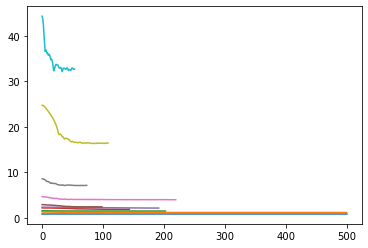

In [47]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses  =  train_gnumap(new_data, 32, 2, n_layers=1, target=None,
                                     model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                     norm = 'uniform', patience=20, epochs=500, lr=1e-2, wd=1e-2,
                                     min_dist=0.1, name_file="1", subsampling=None,
                                     spread = 1.0, repulsion_strength=repulsion_strength[i],
                                     device=None, verbose = False, normalized = True)
    out_tmp = model(new_data.x.float(), new_data.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

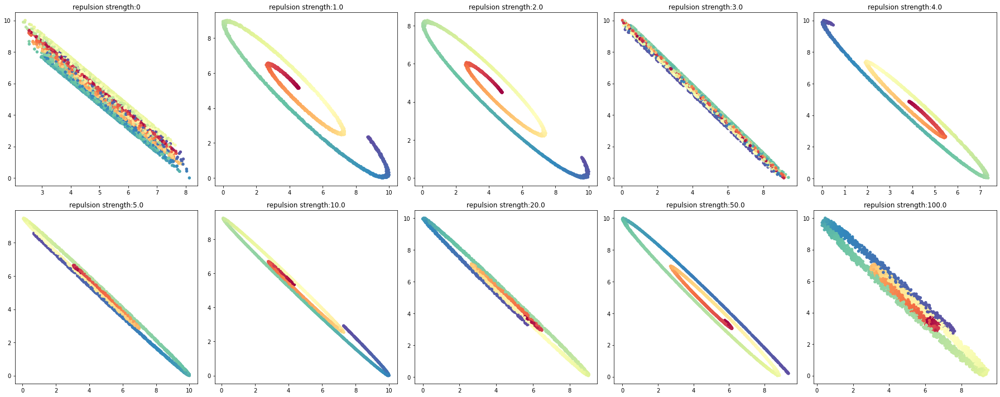

In [48]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

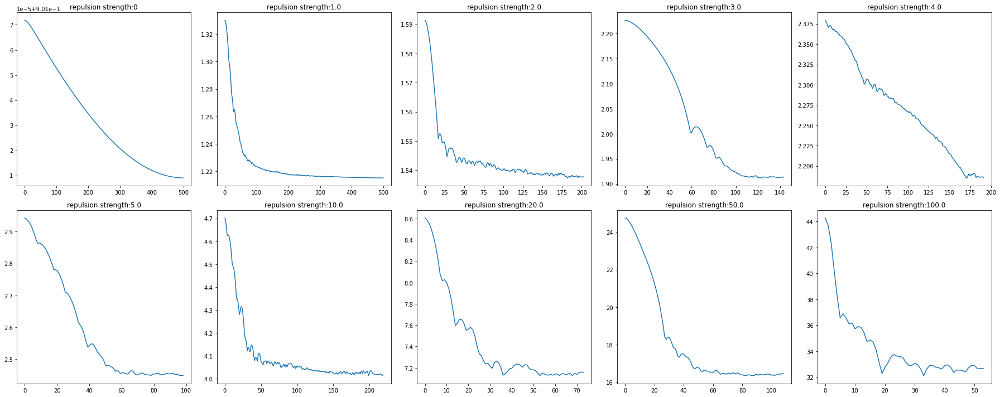

In [49]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.0817, grad_fn=<AddBackward0>)
Epoch=000, loss=7.0817, time=0.0126
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.0778, grad_fn=<AddBackward0>)
Epoch=001, loss=7.0778, time=0.0131
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.0704, grad_fn=<AddBackward0>)
Epoch=002, loss=7.0704, time=0.0121
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.0596, grad_fn=<AddBackward0>)
Epoch=003, loss=7.0596, time=0.0123
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.0468, grad_fn=<AddBackward0>)
Epoch=004, loss=7.0468, time=0.0127
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.0344, grad_fn=<AddBackward0>)
Epoch=005, loss=7.0344, time=0.0124
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.0200, grad_fn

Epoch=065, loss=6.3443, time=0.0165
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3406, grad_fn=<AddBackward0>)
Epoch=066, loss=6.3406, time=0.0149
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3313, grad_fn=<AddBackward0>)
Epoch=067, loss=6.3313, time=0.0151
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3166, grad_fn=<AddBackward0>)
Epoch=068, loss=6.3166, time=0.0146
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3159, grad_fn=<AddBackward0>)
Epoch=069, loss=6.3159, time=0.0143
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3182, grad_fn=<AddBackward0>)
Epoch=070, loss=6.3182, time=0.0146
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3145, grad_fn=<AddBackward0>)
Epoch=071, loss=6.3145, time=0.0133
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.3052, grad_fn=<AddBackward0>)
Epoch=072, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.8900, grad_fn=<AddBackward0>)
Epoch=000, loss=6.8900, time=0.0145
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.8828, grad_fn=<AddBackward0>)
Epoch=001, loss=6.8828, time=0.0143
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.8689, grad_fn=<AddBackward0>)
Epoch=002, loss=6.8689, time=0.0133
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.8484, grad_fn=<AddBackward0>)
Epoch=003, loss=6.8484, time=0.0134
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.8214, grad_fn=<AddBackward0>)
Epoch=004, loss=6.8214, time=0.0131
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.7875, grad_fn=<AddBackward0>)
Epoch=005, loss=6.7875, time=0.0130
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.7463, grad_fn

loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8664, grad_fn=<AddBackward0>)
Epoch=061, loss=5.8664, time=0.0163
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8669, grad_fn=<AddBackward0>)
Epoch=062, loss=5.8669, time=0.0166
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8658, grad_fn=<AddBackward0>)
Epoch=063, loss=5.8658, time=0.0154
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8661, grad_fn=<AddBackward0>)
Epoch=064, loss=5.8661, time=0.0148
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8569, grad_fn=<AddBackward0>)
Epoch=065, loss=5.8569, time=0.0149
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8537, grad_fn=<AddBackward0>)
Epoch=066, loss=5.8537, time=0.0135
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8577, grad_fn=<AddBackward0>)
Epoch=067, loss=5.8577, time=0.0135
loss before n

Epoch=120, loss=5.8568, time=0.0144
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8527, grad_fn=<AddBackward0>)
Epoch=121, loss=5.8527, time=0.0173
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8595, grad_fn=<AddBackward0>)
Epoch=122, loss=5.8595, time=0.0133
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8589, grad_fn=<AddBackward0>)
Epoch=123, loss=5.8589, time=0.0179
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8507, grad_fn=<AddBackward0>)
Epoch=124, loss=5.8507, time=0.0162
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8533, grad_fn=<AddBackward0>)
Epoch=125, loss=5.8533, time=0.0149
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8571, grad_fn=<AddBackward0>)
Epoch=126, loss=5.8571, time=0.0136
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8613, grad_fn=<AddBackward0>)
Epoch=127, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.2162, grad_fn=<AddBackward0>)
Epoch=000, loss=7.2162, time=0.0131
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.2105, grad_fn=<AddBackward0>)
Epoch=001, loss=7.2105, time=0.0132
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.1995, grad_fn=<AddBackward0>)
Epoch=002, loss=7.1995, time=0.0120
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.1832, grad_fn=<AddBackward0>)
Epoch=003, loss=7.1832, time=0.0128
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.1615, grad_fn=<AddBackward0>)
Epoch=004, loss=7.1615, time=0.0122
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.1343, grad_fn=<AddBackward0>)
Epoch=005, loss=7.1343, time=0.0122
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.1008, grad_fn

loss final tensor(6.3240, grad_fn=<AddBackward0>)
Epoch=063, loss=6.3240, time=0.0170
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.3289, grad_fn=<AddBackward0>)
Epoch=064, loss=6.3289, time=0.0173
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.3260, grad_fn=<AddBackward0>)
Epoch=065, loss=6.3260, time=0.0146
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.3114, grad_fn=<AddBackward0>)
Epoch=066, loss=6.3114, time=0.0142
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.3119, grad_fn=<AddBackward0>)
Epoch=067, loss=6.3119, time=0.0147
loss before neg tensor(0.6954, grad_fn=<NegBackward0>)
loss final tensor(6.3152, grad_fn=<AddBackward0>)
Epoch=068, loss=6.3152, time=0.0167
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.3198, grad_fn=<AddBackward0>)
Epoch=069, loss=6.3198, time=0.0160
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final te

Epoch=126, loss=6.2781, time=0.0139
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.2783, grad_fn=<AddBackward0>)
Epoch=127, loss=6.2783, time=0.0150
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.2718, grad_fn=<AddBackward0>)
Epoch=128, loss=6.2718, time=0.0148
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.2810, grad_fn=<AddBackward0>)
Epoch=129, loss=6.2810, time=0.0146
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.2854, grad_fn=<AddBackward0>)
Epoch=130, loss=6.2854, time=0.0125
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.2768, grad_fn=<AddBackward0>)
Epoch=131, loss=6.2768, time=0.0130
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.2616, grad_fn=<AddBackward0>)
Epoch=132, loss=6.2616, time=0.0143
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.2674, grad_fn=<AddBackward0>)
Epoch=133, lo

loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.2499, grad_fn=<AddBackward0>)
Epoch=190, loss=6.2499, time=0.0156
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.2428, grad_fn=<AddBackward0>)
Epoch=191, loss=6.2428, time=0.0136
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.2426, grad_fn=<AddBackward0>)
Epoch=192, loss=6.2426, time=0.0141
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.2471, grad_fn=<AddBackward0>)
Epoch=193, loss=6.2471, time=0.0133
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.2478, grad_fn=<AddBackward0>)
Epoch=194, loss=6.2478, time=0.0133
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.2456, grad_fn=<AddBackward0>)
Epoch=195, loss=6.2456, time=0.0141
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.2409, grad_fn=<AddBackward0>)
Epoch=196, loss=6.2409, time=0.0169
loss before n

loss final tensor(6.1993, grad_fn=<AddBackward0>)
Epoch=249, loss=6.1993, time=0.0163
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.1980, grad_fn=<AddBackward0>)
Epoch=250, loss=6.1980, time=0.0145
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.1947, grad_fn=<AddBackward0>)
Epoch=251, loss=6.1947, time=0.0136
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.1987, grad_fn=<AddBackward0>)
Epoch=252, loss=6.1987, time=0.0145
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.1983, grad_fn=<AddBackward0>)
Epoch=253, loss=6.1983, time=0.0136
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.1986, grad_fn=<AddBackward0>)
Epoch=254, loss=6.1986, time=0.0833
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.1966, grad_fn=<AddBackward0>)
Epoch=255, loss=6.1966, time=0.0147
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final te

loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.0921, grad_fn=<AddBackward0>)
Epoch=310, loss=6.0921, time=0.0165
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.0887, grad_fn=<AddBackward0>)
Epoch=311, loss=6.0887, time=0.0156
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.0910, grad_fn=<AddBackward0>)
Epoch=312, loss=6.0910, time=0.0179
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.0884, grad_fn=<AddBackward0>)
Epoch=313, loss=6.0884, time=0.0174
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.0825, grad_fn=<AddBackward0>)
Epoch=314, loss=6.0825, time=0.0153
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.0813, grad_fn=<AddBackward0>)
Epoch=315, loss=6.0813, time=0.0182
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.0781, grad_fn=<AddBackward0>)
Epoch=316, loss=6.0781, time=0.0151
loss before n

loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9077, grad_fn=<AddBackward0>)
Epoch=370, loss=5.9077, time=0.0177
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9021, grad_fn=<AddBackward0>)
Epoch=371, loss=5.9021, time=0.0170
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8991, grad_fn=<AddBackward0>)
Epoch=372, loss=5.8991, time=0.0135
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8954, grad_fn=<AddBackward0>)
Epoch=373, loss=5.8954, time=0.0143
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8887, grad_fn=<AddBackward0>)
Epoch=374, loss=5.8887, time=0.0177
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8850, grad_fn=<AddBackward0>)
Epoch=375, loss=5.8850, time=0.0135
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8811, grad_fn=<AddBackward0>)
Epoch=376, loss=5.8811, time=0.0161
loss before n

Epoch=430, loss=5.8620, time=0.0184
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8625, grad_fn=<AddBackward0>)
Epoch=431, loss=5.8625, time=0.0191
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8625, grad_fn=<AddBackward0>)
Epoch=432, loss=5.8625, time=0.0185
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8624, grad_fn=<AddBackward0>)
Epoch=433, loss=5.8624, time=0.0167
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8624, grad_fn=<AddBackward0>)
Epoch=434, loss=5.8624, time=0.0159
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8617, grad_fn=<AddBackward0>)
Epoch=435, loss=5.8617, time=0.0169
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8622, grad_fn=<AddBackward0>)
Epoch=436, loss=5.8622, time=0.0154
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8622, grad_fn=<AddBackward0>)
Epoch=437, lo

Epoch=494, loss=5.8598, time=0.0145
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8598, grad_fn=<AddBackward0>)
Epoch=495, loss=5.8598, time=0.0145
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8598, grad_fn=<AddBackward0>)
Epoch=496, loss=5.8598, time=0.0154
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8597, grad_fn=<AddBackward0>)
Epoch=497, loss=5.8597, time=0.0130
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8597, grad_fn=<AddBackward0>)
Epoch=498, loss=5.8597, time=0.0129
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8597, grad_fn=<AddBackward0>)
Epoch=499, loss=5.8597, time=0.0151
Loading 498th epoch


Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.2167, grad_fn=<AddBackward0>)
Epoch=000, loss=7.2167, time=0.0169
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.2105, grad_fn=<AddBackward0>)
Epoch=001, loss=7.2105, time=0.0184
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.1985, grad_fn=<AddBackward0>)
Epoch=002, loss=7.1985, time=0.0241
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.1809, grad_fn=<AddBackward0>)
Epoch=003, loss=7.1809, time=0.0170
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.1578, grad_fn=<AddBackward0>)
Epoch=004, loss=7.1578, time=0.0155
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.1292, grad_fn=<AddBackward0>)
Epoch=005, loss=7.1292, time=0.0163
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.0947, grad_fn

Epoch=061, loss=6.0798, time=0.0174
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.0815, grad_fn=<AddBackward0>)
Epoch=062, loss=6.0815, time=0.0196
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.0800, grad_fn=<AddBackward0>)
Epoch=063, loss=6.0800, time=0.0143
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.0699, grad_fn=<AddBackward0>)
Epoch=064, loss=6.0699, time=0.0140
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.0592, grad_fn=<AddBackward0>)
Epoch=065, loss=6.0592, time=0.0148
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.0572, grad_fn=<AddBackward0>)
Epoch=066, loss=6.0572, time=0.0203
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.0539, grad_fn=<AddBackward0>)
Epoch=067, loss=6.0539, time=0.0216
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.0476, grad_fn=<AddBackward0>)
Epoch=068, lo

Epoch=120, loss=5.8526, time=0.0160
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8542, grad_fn=<AddBackward0>)
Epoch=121, loss=5.8542, time=0.0168
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8513, grad_fn=<AddBackward0>)
Epoch=122, loss=5.8513, time=0.0228
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8614, grad_fn=<AddBackward0>)
Epoch=123, loss=5.8614, time=0.0176
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8612, grad_fn=<AddBackward0>)
Epoch=124, loss=5.8612, time=0.0188
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8507, grad_fn=<AddBackward0>)
Epoch=125, loss=5.8507, time=0.0230
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8525, grad_fn=<AddBackward0>)
Epoch=126, loss=5.8525, time=0.0157
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(5.8529, grad_fn=<AddBackward0>)
Epoch=127, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.8337, grad_fn=<AddBackward0>)
Epoch=000, loss=6.8337, time=0.0172
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.8308, grad_fn=<AddBackward0>)
Epoch=001, loss=6.8308, time=0.0162
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.8252, grad_fn=<AddBackward0>)
Epoch=002, loss=6.8252, time=0.0155
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.8172, grad_fn=<AddBackward0>)
Epoch=003, loss=6.8172, time=0.0228
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.8068, grad_fn=<AddBackward0>)
Epoch=004, loss=6.8068, time=0.0147
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.7941, grad_fn=<AddBackward0>)
Epoch=005, loss=6.7941, time=0.0131
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.7791, grad_fn

Epoch=057, loss=6.3420, time=0.0146
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(6.3201, grad_fn=<AddBackward0>)
Epoch=058, loss=6.3201, time=0.0168
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(6.3250, grad_fn=<AddBackward0>)
Epoch=059, loss=6.3250, time=0.0144
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(6.3321, grad_fn=<AddBackward0>)
Epoch=060, loss=6.3321, time=0.0159
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(6.3305, grad_fn=<AddBackward0>)
Epoch=061, loss=6.3305, time=0.0146
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(6.3214, grad_fn=<AddBackward0>)
Epoch=062, loss=6.3214, time=0.0152
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(6.3071, grad_fn=<AddBackward0>)
Epoch=063, loss=6.3071, time=0.0142
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(6.2862, grad_fn=<AddBackward0>)
Epoch=064, lo

loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9325, grad_fn=<AddBackward0>)
Epoch=116, loss=5.9325, time=0.0199
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9312, grad_fn=<AddBackward0>)
Epoch=117, loss=5.9312, time=0.0167
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9242, grad_fn=<AddBackward0>)
Epoch=118, loss=5.9242, time=0.0152
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9147, grad_fn=<AddBackward0>)
Epoch=119, loss=5.9147, time=0.0166
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9189, grad_fn=<AddBackward0>)
Epoch=120, loss=5.9189, time=0.0177
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9163, grad_fn=<AddBackward0>)
Epoch=121, loss=5.9163, time=0.0169
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.9134, grad_fn=<AddBackward0>)
Epoch=122, loss=5.9134, time=0.0176
loss before n

loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8929, grad_fn=<AddBackward0>)
Epoch=179, loss=5.8929, time=0.0150
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8943, grad_fn=<AddBackward0>)
Epoch=180, loss=5.8943, time=0.0153
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8960, grad_fn=<AddBackward0>)
Epoch=181, loss=5.8960, time=0.0158
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8955, grad_fn=<AddBackward0>)
Epoch=182, loss=5.8955, time=0.0173
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8953, grad_fn=<AddBackward0>)
Epoch=183, loss=5.8953, time=0.0128
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8928, grad_fn=<AddBackward0>)
Epoch=184, loss=5.8928, time=0.0167
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8917, grad_fn=<AddBackward0>)
Epoch=185, loss=5.8917, time=0.0173
loss before n

Epoch=243, loss=5.8677, time=0.0127
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8653, grad_fn=<AddBackward0>)
Epoch=244, loss=5.8653, time=0.0217
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8672, grad_fn=<AddBackward0>)
Epoch=245, loss=5.8672, time=0.0137
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8641, grad_fn=<AddBackward0>)
Epoch=246, loss=5.8641, time=0.0134
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8606, grad_fn=<AddBackward0>)
Epoch=247, loss=5.8606, time=0.0170
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8602, grad_fn=<AddBackward0>)
Epoch=248, loss=5.8602, time=0.0159
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8664, grad_fn=<AddBackward0>)
Epoch=249, loss=5.8664, time=0.0148
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8643, grad_fn=<AddBackward0>)
Epoch=250, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(6.6691, grad_fn=<AddBackward0>)
Epoch=000, loss=6.6691, time=0.0144
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(6.6550, grad_fn=<AddBackward0>)
Epoch=001, loss=6.6550, time=0.0155
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(6.6272, grad_fn=<AddBackward0>)
Epoch=002, loss=6.6272, time=0.0238
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.5906, grad_fn=<AddBackward0>)
Epoch=003, loss=6.5906, time=0.0164
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.5404, grad_fn=<AddBackward0>)
Epoch=004, loss=6.5404, time=0.0176
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.4700, grad_fn=<AddBackward0>)
Epoch=005, loss=6.4700, time=0.0190
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.3917, grad_fn

loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.0362, grad_fn=<AddBackward0>)
Epoch=059, loss=6.0362, time=0.0173
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.0361, grad_fn=<AddBackward0>)
Epoch=060, loss=6.0361, time=0.0179
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.0316, grad_fn=<AddBackward0>)
Epoch=061, loss=6.0316, time=0.0153
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.0226, grad_fn=<AddBackward0>)
Epoch=062, loss=6.0226, time=0.0159
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.0324, grad_fn=<AddBackward0>)
Epoch=063, loss=6.0324, time=0.0232
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.0331, grad_fn=<AddBackward0>)
Epoch=064, loss=6.0331, time=0.0167
loss before neg tensor(0.6953, grad_fn=<NegBackward0>)
loss final tensor(6.0181, grad_fn=<AddBackward0>)
Epoch=065, loss=6.0181, time=0.0284
loss before n

loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8753, grad_fn=<AddBackward0>)
Epoch=121, loss=5.8753, time=0.0162
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8737, grad_fn=<AddBackward0>)
Epoch=122, loss=5.8737, time=0.0168
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8793, grad_fn=<AddBackward0>)
Epoch=123, loss=5.8793, time=0.0166
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8765, grad_fn=<AddBackward0>)
Epoch=124, loss=5.8765, time=0.0156
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8879, grad_fn=<AddBackward0>)
Epoch=125, loss=5.8879, time=0.0165
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8827, grad_fn=<AddBackward0>)
Epoch=126, loss=5.8827, time=0.0193
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8716, grad_fn=<AddBackward0>)
Epoch=127, loss=5.8716, time=0.0188
loss before n

loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8475, grad_fn=<AddBackward0>)
Epoch=185, loss=5.8475, time=0.0154
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8439, grad_fn=<AddBackward0>)
Epoch=186, loss=5.8439, time=0.0150
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8494, grad_fn=<AddBackward0>)
Epoch=187, loss=5.8494, time=0.0132
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8440, grad_fn=<AddBackward0>)
Epoch=188, loss=5.8440, time=0.0132
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8422, grad_fn=<AddBackward0>)
Epoch=189, loss=5.8422, time=0.0153
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(5.8379, grad_fn=<AddBackward0>)
Epoch=190, loss=5.8379, time=0.0181
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8436, grad_fn=<AddBackward0>)
Epoch=191, loss=5.8436, time=0.0159
loss before n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.0348, grad_fn=<AddBackward0>)
Epoch=000, loss=7.0348, time=0.0164
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.0317, grad_fn=<AddBackward0>)
Epoch=001, loss=7.0317, time=0.0153
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.0257, grad_fn=<AddBackward0>)
Epoch=002, loss=7.0257, time=0.0137
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.0171, grad_fn=<AddBackward0>)
Epoch=003, loss=7.0171, time=0.0147
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(7.0060, grad_fn=<AddBackward0>)
Epoch=004, loss=7.0060, time=0.0176
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.9925, grad_fn=<AddBackward0>)
Epoch=005, loss=6.9925, time=0.0161
loss before neg tensor(0.6949, grad_fn=<NegBackward0>)
loss final tensor(6.9768, grad_fn

Epoch=060, loss=5.9157, time=0.0169
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8931, grad_fn=<AddBackward0>)
Epoch=061, loss=5.8931, time=0.0151
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8671, grad_fn=<AddBackward0>)
Epoch=062, loss=5.8671, time=0.0136
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8606, grad_fn=<AddBackward0>)
Epoch=063, loss=5.8606, time=0.0136
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8473, grad_fn=<AddBackward0>)
Epoch=064, loss=5.8473, time=0.0189
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8553, grad_fn=<AddBackward0>)
Epoch=065, loss=5.8553, time=0.0139
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8676, grad_fn=<AddBackward0>)
Epoch=066, loss=5.8676, time=0.0140
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8654, grad_fn=<AddBackward0>)
Epoch=067, lo

Epoch=123, loss=5.8201, time=0.0131
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(5.8174, grad_fn=<AddBackward0>)
Epoch=124, loss=5.8174, time=0.0228
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(5.8226, grad_fn=<AddBackward0>)
Epoch=125, loss=5.8226, time=0.0138
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(5.8242, grad_fn=<AddBackward0>)
Epoch=126, loss=5.8242, time=0.0132
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(5.8207, grad_fn=<AddBackward0>)
Epoch=127, loss=5.8207, time=0.0234
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(5.8234, grad_fn=<AddBackward0>)
Epoch=128, loss=5.8234, time=0.0158
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(5.8213, grad_fn=<AddBackward0>)
Epoch=129, loss=5.8213, time=0.0141
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(5.8215, grad_fn=<AddBackward0>)
Epoch=130, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.5878, grad_fn=<AddBackward0>)
Epoch=000, loss=6.5878, time=0.0135
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.5821, grad_fn=<AddBackward0>)
Epoch=001, loss=6.5821, time=0.0136
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.5711, grad_fn=<AddBackward0>)
Epoch=002, loss=6.5711, time=0.0169
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.5549, grad_fn=<AddBackward0>)
Epoch=003, loss=6.5549, time=0.0135
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.5336, grad_fn=<AddBackward0>)
Epoch=004, loss=6.5336, time=0.0132
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.5068, grad_fn=<AddBackward0>)
Epoch=005, loss=6.5068, time=0.0153
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(6.4742, grad_fn

loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.1962, grad_fn=<AddBackward0>)
Epoch=062, loss=6.1962, time=0.0194
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.1907, grad_fn=<AddBackward0>)
Epoch=063, loss=6.1907, time=0.0147
loss before neg tensor(0.6955, grad_fn=<NegBackward0>)
loss final tensor(6.1889, grad_fn=<AddBackward0>)
Epoch=064, loss=6.1889, time=0.0186
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.1850, grad_fn=<AddBackward0>)
Epoch=065, loss=6.1850, time=0.0189
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.1741, grad_fn=<AddBackward0>)
Epoch=066, loss=6.1741, time=0.0169
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.1784, grad_fn=<AddBackward0>)
Epoch=067, loss=6.1784, time=0.0154
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.1776, grad_fn=<AddBackward0>)
Epoch=068, loss=6.1776, time=0.0171
loss before n

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.0704, grad_fn=<AddBackward0>)
Epoch=000, loss=7.0704, time=0.0193
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.0643, grad_fn=<AddBackward0>)
Epoch=001, loss=7.0643, time=0.0150
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.0526, grad_fn=<AddBackward0>)
Epoch=002, loss=7.0526, time=0.0133
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.0353, grad_fn=<AddBackward0>)
Epoch=003, loss=7.0353, time=0.0204
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(7.0125, grad_fn=<AddBackward0>)
Epoch=004, loss=7.0125, time=0.0168
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(6.9837, grad_fn=<AddBackward0>)
Epoch=005, loss=6.9837, time=0.0201
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(6.9552, grad_fn

Epoch=057, loss=6.1205, time=0.0139
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.1240, grad_fn=<AddBackward0>)
Epoch=058, loss=6.1240, time=0.0154
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.1260, grad_fn=<AddBackward0>)
Epoch=059, loss=6.1260, time=0.0141
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.1214, grad_fn=<AddBackward0>)
Epoch=060, loss=6.1214, time=0.0137
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.1176, grad_fn=<AddBackward0>)
Epoch=061, loss=6.1176, time=0.0129
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.1183, grad_fn=<AddBackward0>)
Epoch=062, loss=6.1183, time=0.0131
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.1133, grad_fn=<AddBackward0>)
Epoch=063, loss=6.1133, time=0.0140
loss before neg tensor(0.6956, grad_fn=<NegBackward0>)
loss final tensor(6.1177, grad_fn=<AddBackward0>)
Epoch=064, lo

Hyperparameters a = 1.5769434603113077 and b = 0.8950608779109733
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.7539, grad_fn=<AddBackward0>)
Epoch=000, loss=6.7539, time=0.0151
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.6985, grad_fn=<AddBackward0>)
Epoch=001, loss=6.6985, time=0.0162
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.6879, grad_fn=<AddBackward0>)
Epoch=002, loss=6.6879, time=0.0153
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(6.6772, grad_fn=<AddBackward0>)
Epoch=003, loss=6.6772, time=0.0141
loss before neg tensor(0.6950, grad_fn=<NegBackward0>)
loss final tensor(6.6363, grad_fn=<AddBackward0>)
Epoch=004, loss=6.6363, time=0.0140
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.5718, grad_fn=<AddBackward0>)
Epoch=005, loss=6.5718, time=0.0141
loss before neg tensor(0.6951, grad_fn=<NegBackward0>)
loss final tensor(6.5082, grad_fn

loss final tensor(5.8587, grad_fn=<AddBackward0>)
Epoch=058, loss=5.8587, time=0.0160
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8685, grad_fn=<AddBackward0>)
Epoch=059, loss=5.8685, time=0.0142
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8630, grad_fn=<AddBackward0>)
Epoch=060, loss=5.8630, time=0.0131
loss before neg tensor(0.6952, grad_fn=<NegBackward0>)
loss final tensor(5.8759, grad_fn=<AddBackward0>)
Epoch=061, loss=5.8759, time=0.0127
Early stopping at epoch 61!
Loading 41th epoch


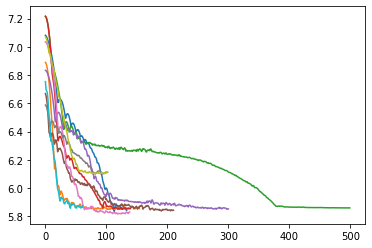

In [50]:
out = {}
loss = {}
repulsion_strength = [0, 1.0,2.0,3.0,4.0,5.0,10.0,20.0,50.0,100.0]
for i in np.arange(10):
    model, target_index, losses = train_gnumap(new_data_unweighted, 32, 2, n_layers=1, target=None,
                                  model_type = 'GNN', must_propagate= [True, True, True, True, True],
                                  norm = 'uniform', patience=20, epochs=500, lr=1e-2, wd=1e-2,
                                  min_dist=0.1, name_file="1", subsampling=None,
                                  spread = 1.0, repulsion_strength=10.0,
                                  device=None, verbose = False, normalized = True )
    out_tmp = model(new_data_unweighted.x.float(), new_data_unweighted.edge_index)
    out[i] = out_tmp
    loss[i] = losses
    plt.plot(losses)

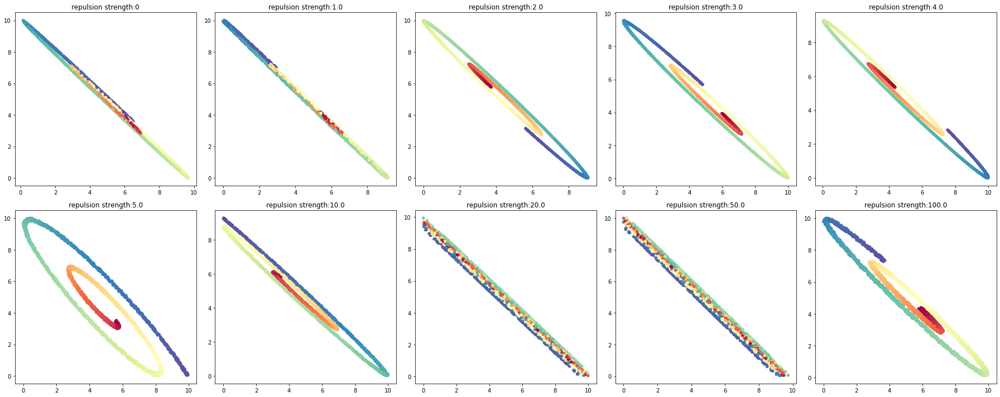

In [51]:
# dropout = 0.01
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(out[i].detach().numpy()[:,0],out[i].detach().numpy()[:,1], c = t, cmap="Spectral", s = 20)
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()

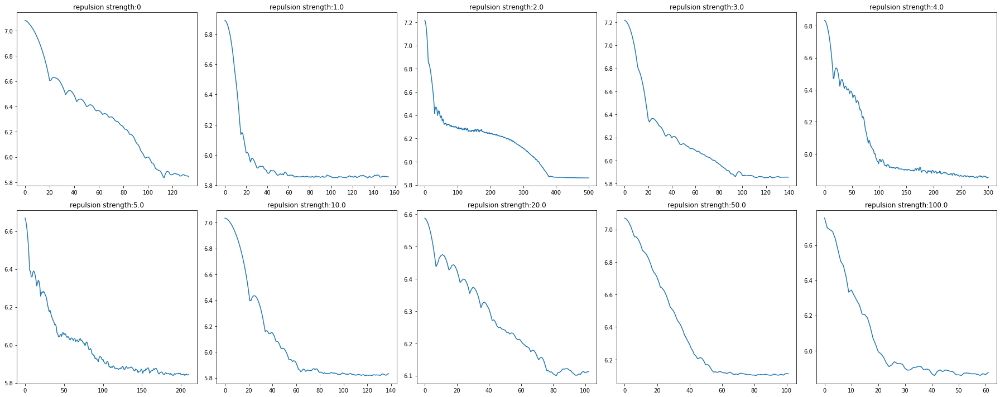

In [52]:
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.plot(loss[i])
    _ = ax.set_title('repulsion strength:' + str(round(repulsion_strength[i],1)))
plt.tight_layout()
plt.show()